# Import

In [21]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import time
import tqdm

#from pytrends.request import TrendReq
import datetime
from iso3166 import countries
from prophet import Prophet
import warnings
warnings.filterwarnings("ignore")
import math
import statsmodels.api as sm # 21.12.13 OLS analysis

import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn import model_selection, svm, metrics
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import QuantileTransformer
from sklearn.model_selection import GridSearchCV

from sklearn import model_selection, svm, metrics
from sklearn.svm import SVR, LinearSVC
from lightgbm import LGBMRegressor, plot_importance

from openpyxl import load_workbook
import openpyxl.utils.dataframe
from openpyxl.utils.dataframe import dataframe_to_rows
import xlwings as xw
import logging


%config InlineBackend.figure_format = 'retina'

plt.rc('font', family='Malgun Gothic') # For Windows

In [22]:
###############################################
###        실행 전 조정 변수 및 Flag        ###
###############################################
m_rows_init = 104        ### Gfk 실적 기준   = 25.8
m_rows_2_init = 120     ### 예측기간 기준   = 26.12
first_fcst = "N"        ### 머신러닝예측치 저장파일 신규 생성 여부 (매월 처음실행만 "Y", 이후는 "N" 으로 조정하여 Append함)
exclude_covid = "Y"     ### COVID로 인한 Pent-up 수요기간 제외 여부 (기본 N)
use_google_trends = "Y" ### 구글트렌드 인자 사용여부 (기본 Y)
###############################################

pred_iloc = m_rows_init%3 # 당분기 가져올 실적갯수
covid = 0
m_rows_init_org = m_rows_init
m_rows_2_init_org = m_rows_2_init

print("첫번째 실행 여부: ",first_fcst)
print("COVID 구간 제외 여부: ",exclude_covid)
print("구글트렌드 사용 여부: ",use_google_trends)

첫번째 실행 여부:  N
COVID 구간 제외 여부:  Y
구글트렌드 사용 여부:  Y


In [23]:
#############################
PG_dir = "10. TV시장수요예측/0.Region"
prod_type = "TV sales"
gt_key = "Google Trends TV"
#############################

file_dir_sub = r"D:\05. SCM DX개선\{}\0.ALL\subsidiary_name.csv".format(PG_dir)

df_subsidiary = pd.DataFrame()
df_subsidiary = pd.read_csv(file_dir_sub)
subs_no = len(df_subsidiary[df_subsidiary['ml_fcst']=="Y"])+1
print("예측국가수:",subs_no-1)
subs_no = len(df_subsidiary)+1
print("국가수:",subs_no-1)

예측국가수: 4
국가수: 7


# 선행지표 기준 예측 한번에 실행하기

## 모형적정성 점검 (주석처리) 

## 원본

  0%|          | 0/7 [00:00<?, ?it/s]

-------
(7, 11)
구글트렌드 적용: Y
법인명: 02.EU
(120, 514)
COVID 구간 제외 여부:  Y
COVID 구간 :  12
max_feature 조정값:(No=0/Yes=1) 1
max_feature 갯수: 17
feature 범위: 0 ~ - 0 개월
(92, 513)
(92, 514)
['TV sales', 'TV sales PY', 'Google Trends TV', 'Romania_Government Revenues', 'United Kingdom_Electricity Production', 'Poland_Personal Savings', 'Romania_Natural Gas Imports']
['TV sales', 'Romania_Government Budget Value', 'Poland_Labour Costs', 'Switzerland_Tourist Arrivals', 'United Kingdom_Capital Flows', 'United Kingdom_GDP from Construction', 'Switzerland_Wages']
(92, 514)
랜덤 포레스트 회귀
Train 결정계수: 0.997
Test 결정계수: 0.975


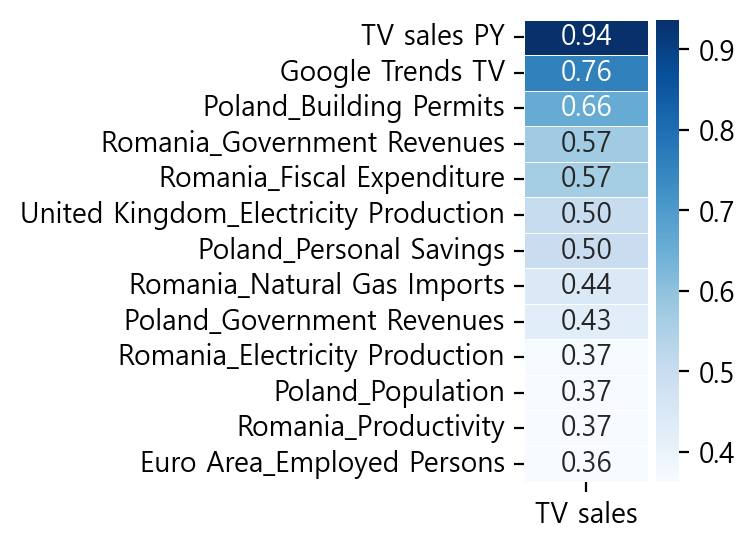

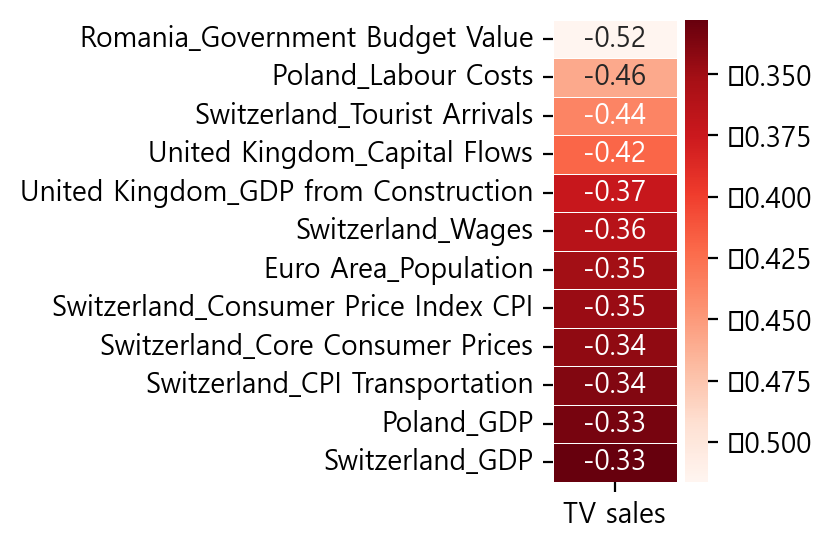

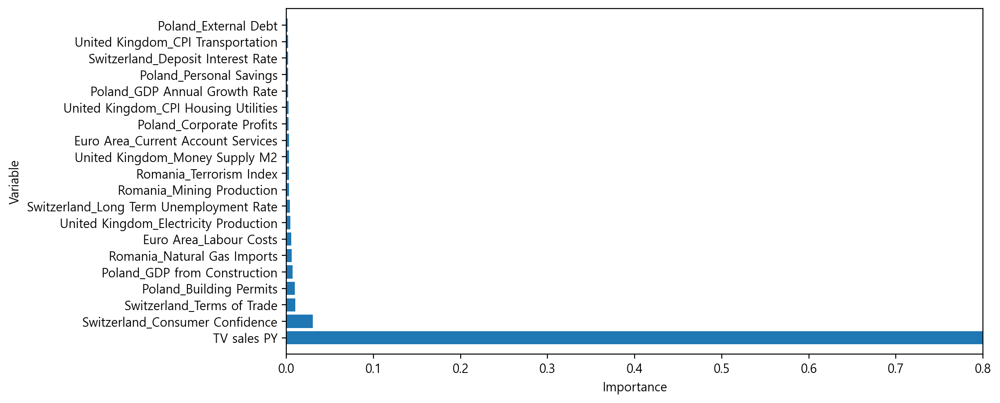

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


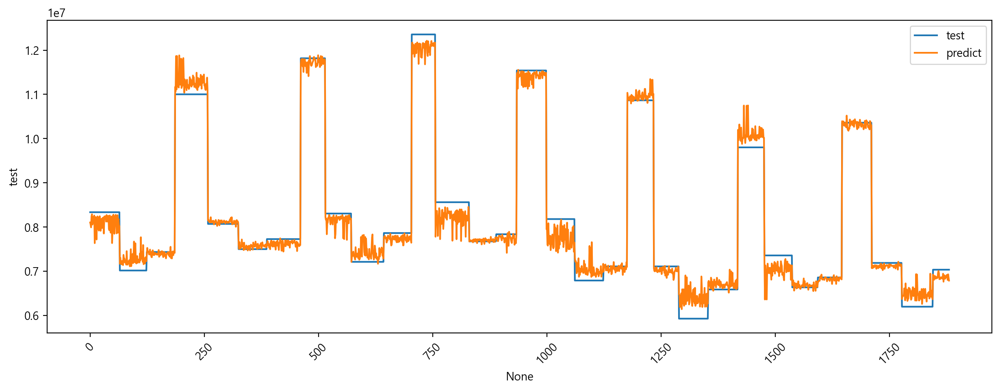

(92, 514)
(20, 2)
20
[2, 12, 18, 23, 30, 32, 33, 72, 102, 150, 169, 311, 319, 365, 428, 438, 509, 511, 512, 513]
max_feature 조정: 1
max_feature 갯수: 17
(92, 20)
랜덤 포레스트 회귀
Train 결정계수: 0.997
Test 결정계수: 0.98


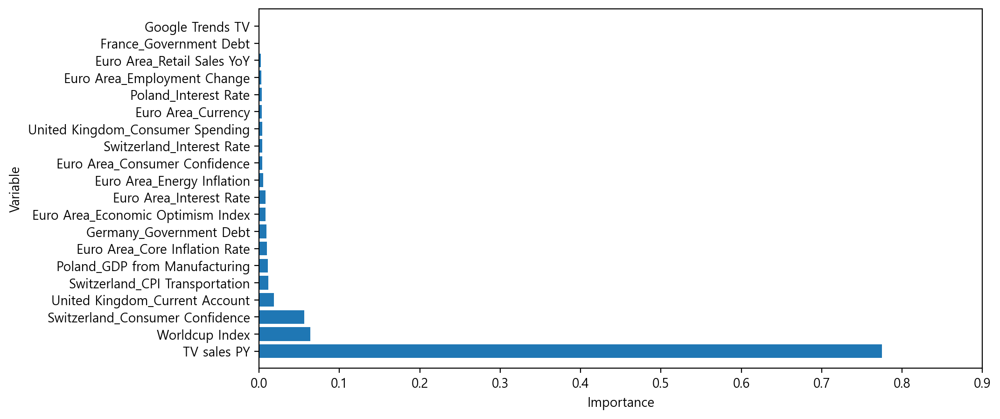

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


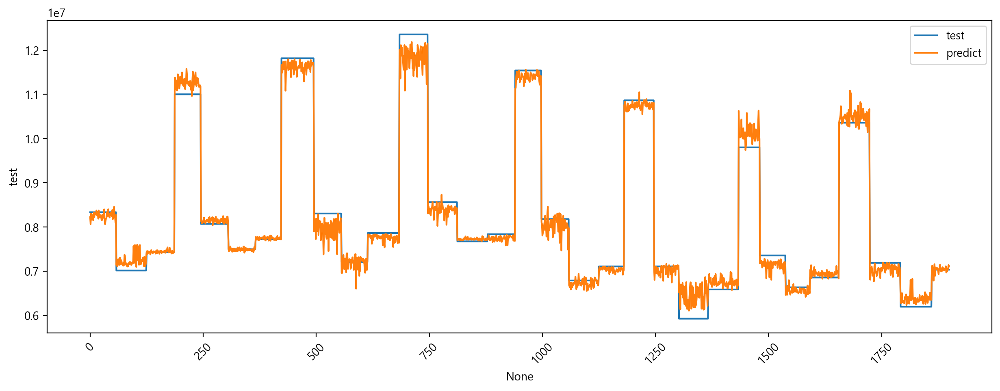

(108, 514)
(20, 2)
20
[2, 12, 18, 23, 30, 32, 33, 72, 102, 150, 169, 311, 319, 365, 428, 438, 509, 511, 512, 513]
(108, 20)
랜덤 포레스트 회귀


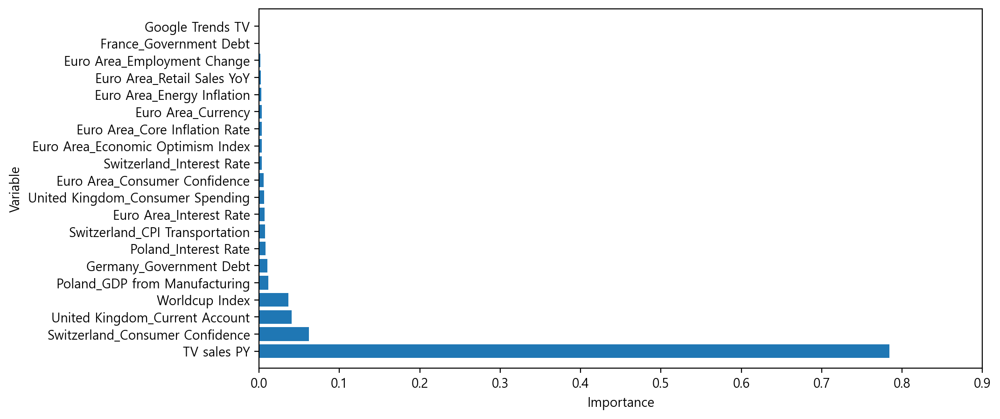

corr: [0.94] / importance: 78.0 %


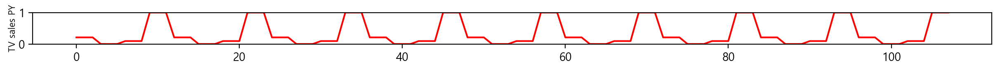

corr: [0.24] / importance: 1.0 %


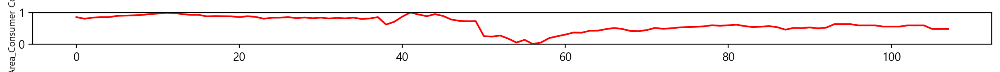

corr: [-0.23] / importance: 0.0 %


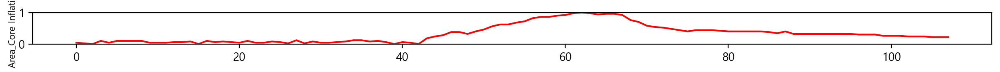

corr: [0.06] / importance: 0.0 %


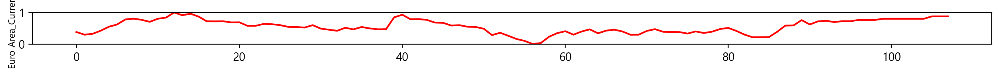

corr: [0.26] / importance: 0.0 %


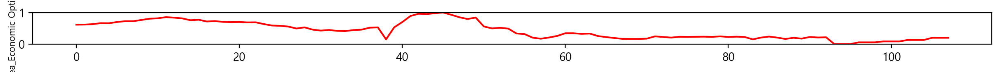

corr: [-0.02] / importance: 0.0 %


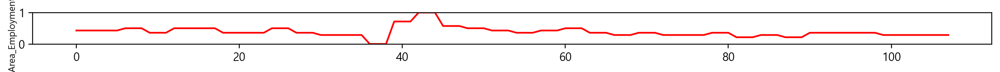

corr: [0.1] / importance: 0.0 %


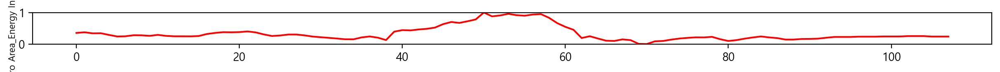

corr: [-0.27] / importance: 1.0 %


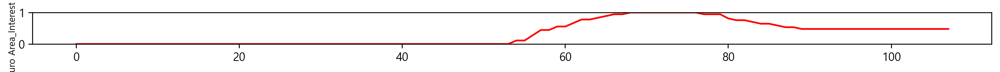

corr: [0.07] / importance: 0.0 %


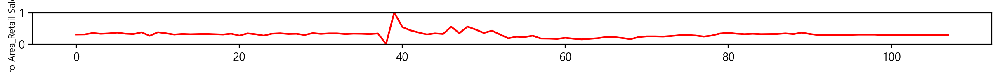

corr: [0.12] / importance: 1.0 %


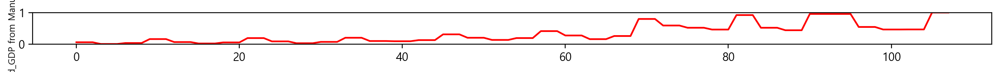

corr: [-0.3] / importance: 1.0 %


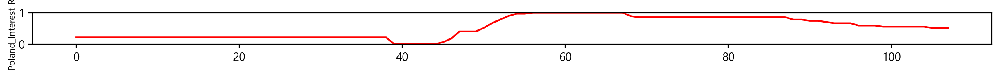

corr: [0.27] / importance: 6.0 %


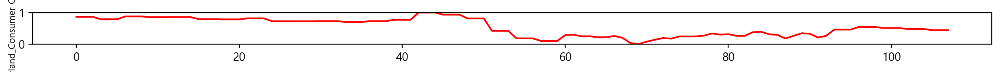

corr: [-0.34] / importance: 1.0 %


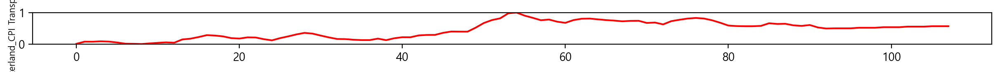

corr: [-0.26] / importance: 0.0 %


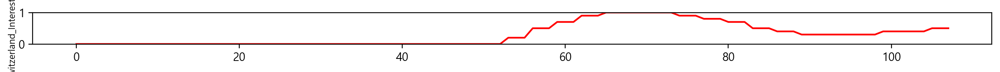

corr: [-0.3] / importance: 1.0 %


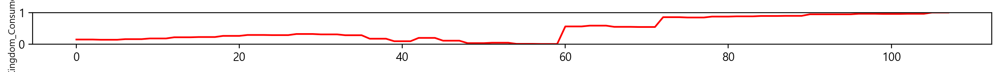

corr: [0.28] / importance: 4.0 %


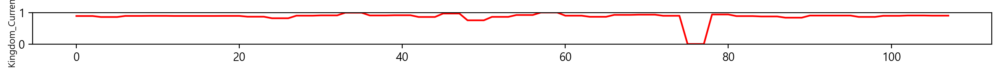

corr: [-0.3] / importance: 1.0 %


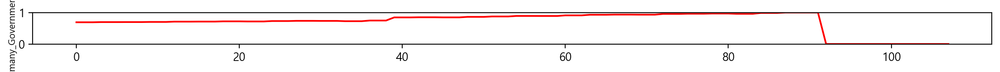

corr: [-0.29] / importance: 0.0 %


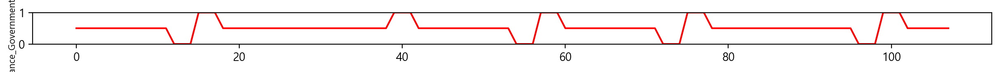

corr: [0.08] / importance: 4.0 %


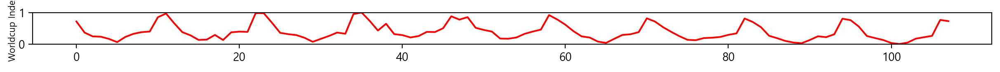

corr: [0.76] / importance: 0.0 %


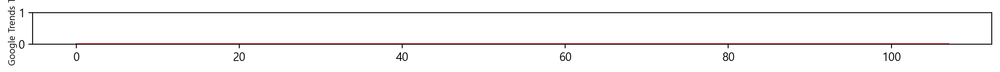

랜덤 포레스트 회귀: 예측 결과


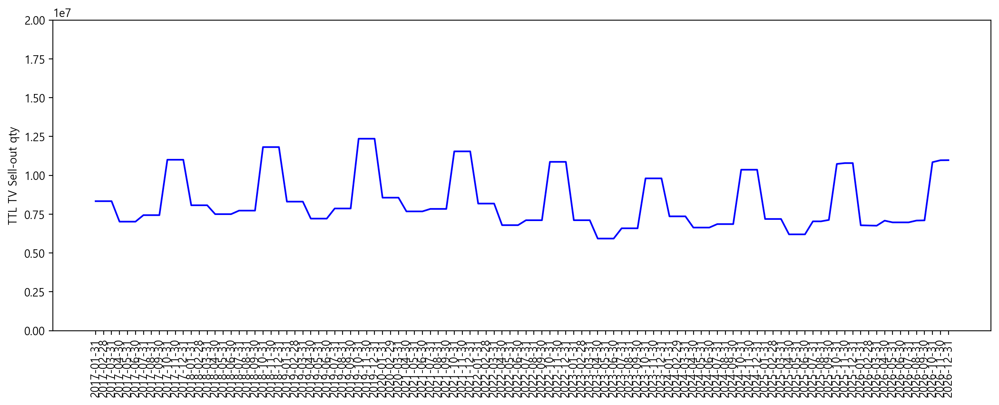

7064639.0 10767480.0 6768401.0 7005523.0 7051045.0 10929219.0
-------
(7, 11)
구글트렌드 적용: N
법인명: 03.SCA
(120, 407)
COVID 구간 제외 여부:  Y
COVID 구간 :  12
max_feature 조정값:(No=0/Yes=1) 1
max_feature 갯수: 13
feature 범위: 0 ~ - 0 개월
(92, 406)
(92, 407)
['TV sales', 'TV sales PY', 'Mexico_GDP from Public Administration', 'Mexico_Current Account', 'Peru_Current Account', 'Peru_Gross Fixed Capital Formation', 'Peru_GDP from Services']
['TV sales', 'Mexico_Government Budget Value', 'Chile_Changes in Inventories', 'Mexico_Foreign Direct Investment', 'Brazil_Bank Lending Rate', 'Colombia_Inflation Rate MoM', 'Peru_Government Budget Value']
(92, 407)
랜덤 포레스트 회귀
Train 결정계수: 0.988
Test 결정계수: 0.901


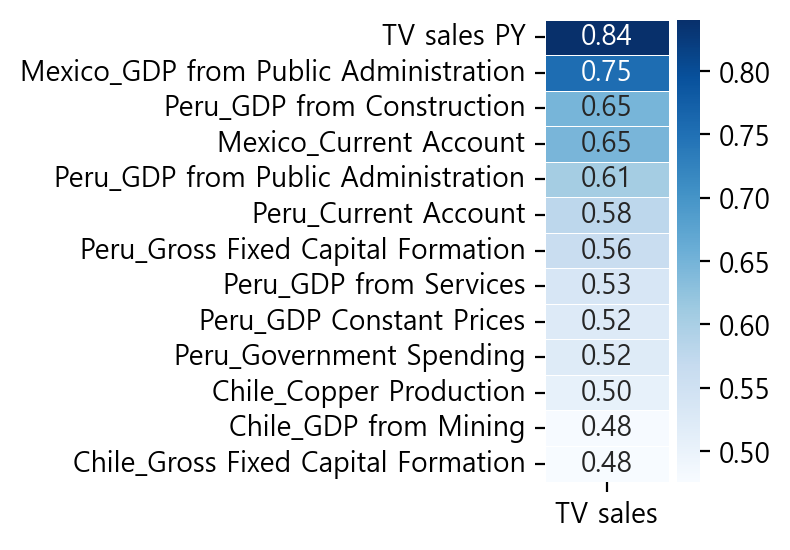

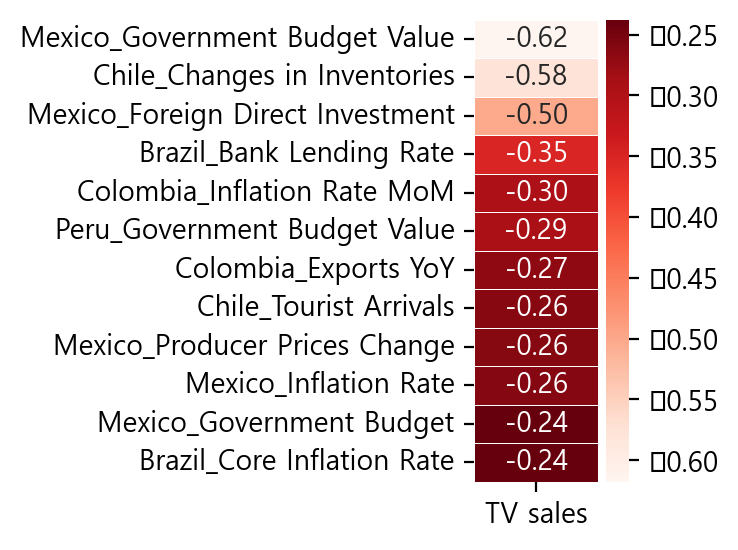

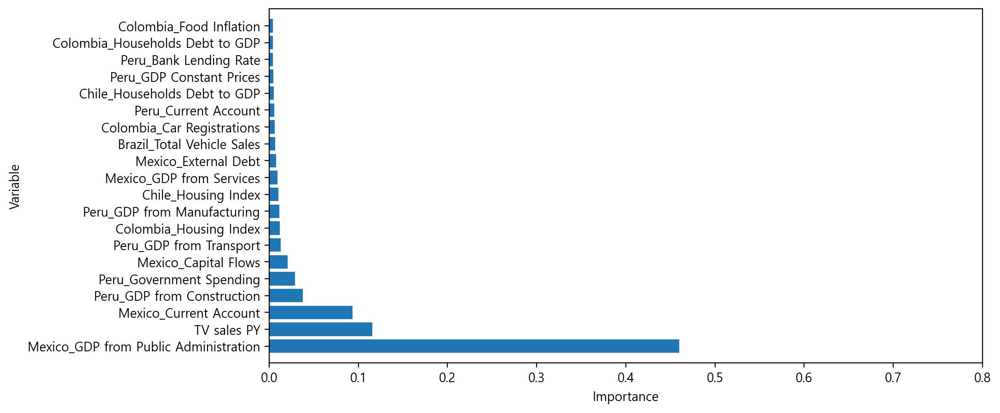

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


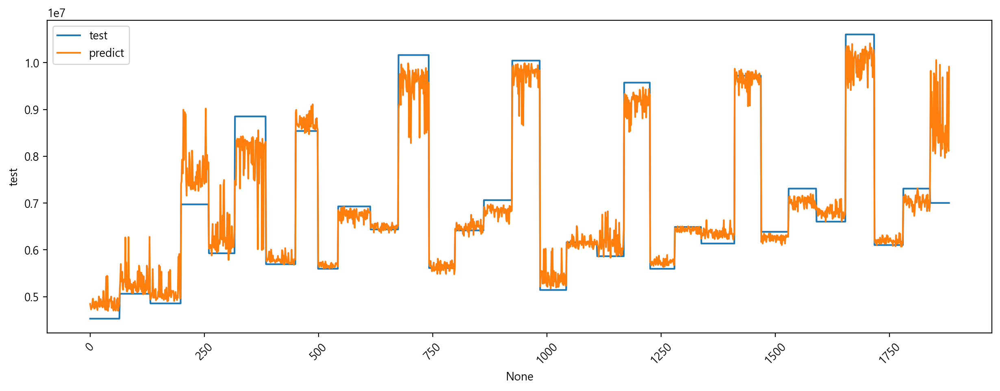

(92, 407)
(19, 2)
19
[2, 11, 30, 39, 41, 107, 122, 132, 180, 194, 212, 264, 281, 284, 297, 310, 337, 362, 405]
max_feature 조정: 1
max_feature 갯수: 13
(92, 19)
랜덤 포레스트 회귀
Train 결정계수: 0.993
Test 결정계수: 0.956


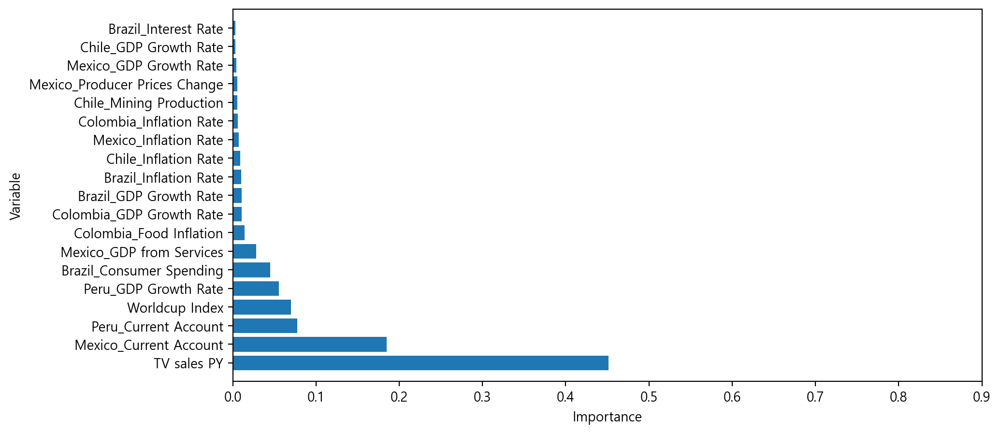

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


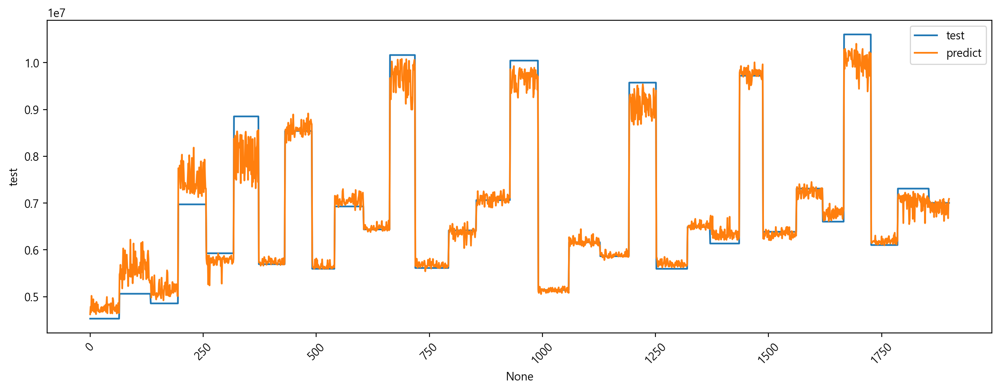

(108, 407)
(19, 2)
19
[2, 11, 30, 39, 41, 107, 122, 132, 180, 194, 212, 264, 281, 284, 297, 310, 337, 362, 405]
(108, 19)
랜덤 포레스트 회귀


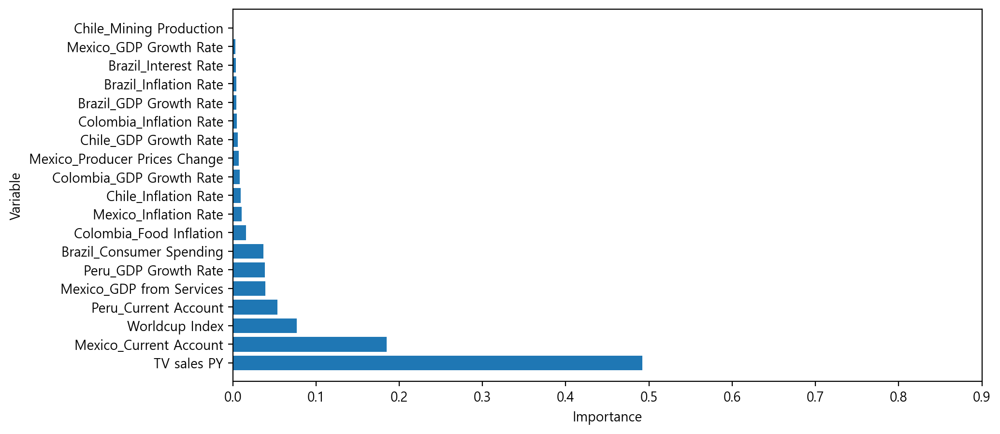

corr: [0.84] / importance: 49.0 %


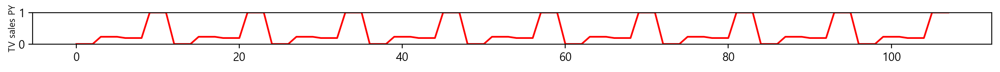

corr: [0.46] / importance: 4.0 %


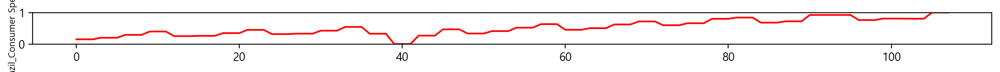

corr: [0.08] / importance: 0.0 %


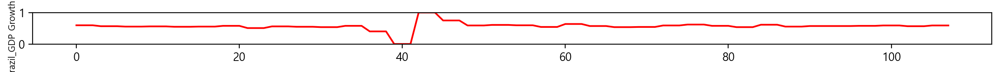

corr: [-0.13] / importance: 0.0 %


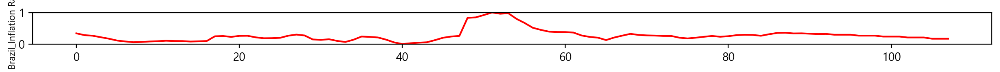

corr: [-0.16] / importance: 0.0 %


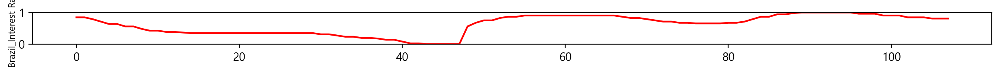

corr: [0.11] / importance: 1.0 %


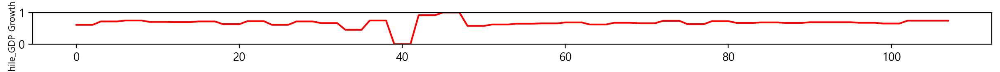

corr: [-0.03] / importance: 1.0 %


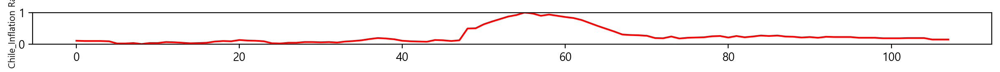

corr: [0.13] / importance: 0.0 %


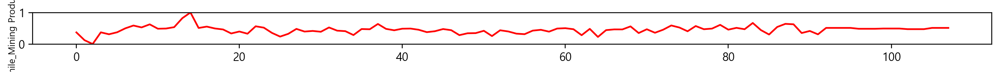

corr: [-0.08] / importance: 2.0 %


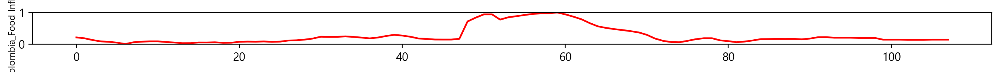

corr: [0.2] / importance: 1.0 %


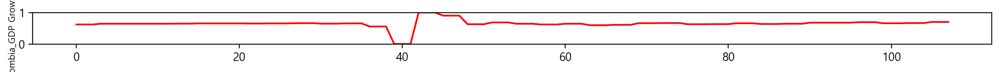

corr: [-0.05] / importance: 1.0 %


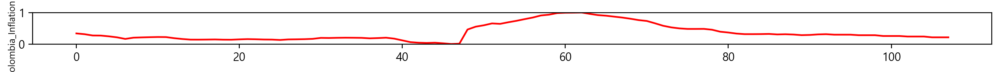

corr: [0.65] / importance: 18.0 %


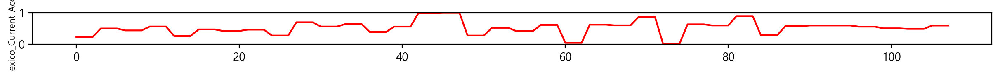

corr: [0.4] / importance: 4.0 %


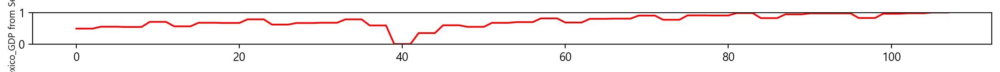

corr: [0.06] / importance: 0.0 %


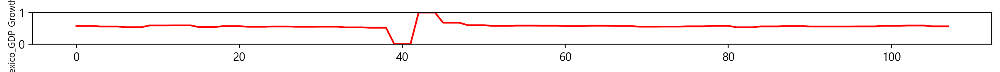

corr: [-0.26] / importance: 1.0 %


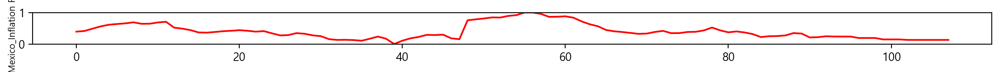

corr: [-0.26] / importance: 1.0 %


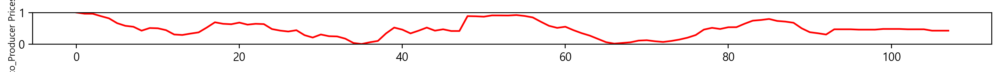

corr: [0.58] / importance: 5.0 %


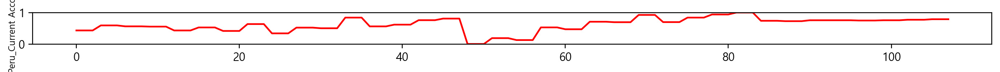

corr: [0.16] / importance: 4.0 %


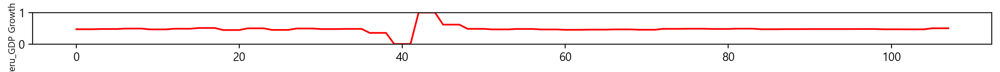

corr: [-0.1] / importance: 8.0 %


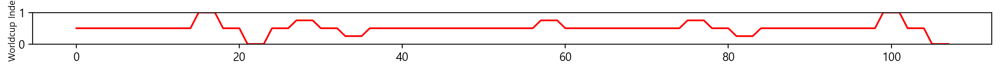

랜덤 포레스트 회귀: 예측 결과


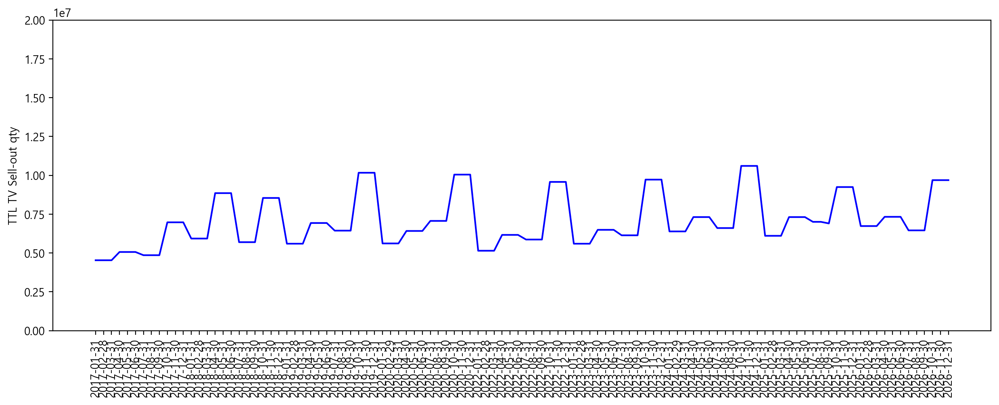

6968626.0 9243233.0 6731432.0 7325888.0 6453125.0 9688262.0
-------
(7, 11)
구글트렌드 적용: N
법인명: 04.MEA
(120, 328)
COVID 구간 제외 여부:  Y
COVID 구간 :  12
max_feature 조정값:(No=0/Yes=1) 1
max_feature 갯수: 12
feature 범위: 0 ~ - 0 개월
(92, 327)
(92, 328)
['TV sales', 'TV sales PY', 'Egypt_Unemployment Rate', 'Egypt_Unemployed Persons', 'Saudi Arabia_Foreign Exchange Reserves', 'Turkey_Consumer Confidence', 'Saudi Arabia_Terrorism Index']
['TV sales', 'Saudi Arabia_Loan Growth', 'Saudi Arabia_Retirement Age Women', 'Saudi Arabia_GDP from Utilities', 'Saudi Arabia_Money Supply M1', 'Egypt_GDP', 'Saudi Arabia_Sales Tax Rate']
(92, 328)
랜덤 포레스트 회귀
Train 결정계수: 0.985
Test 결정계수: 0.878


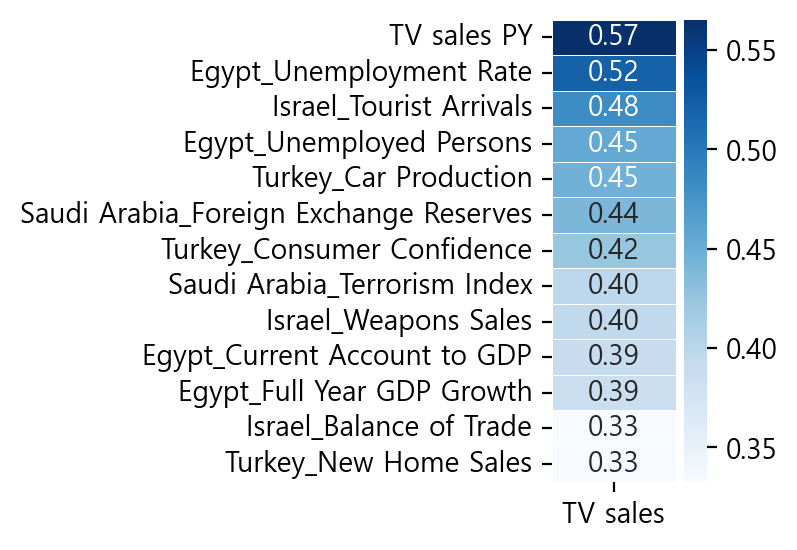

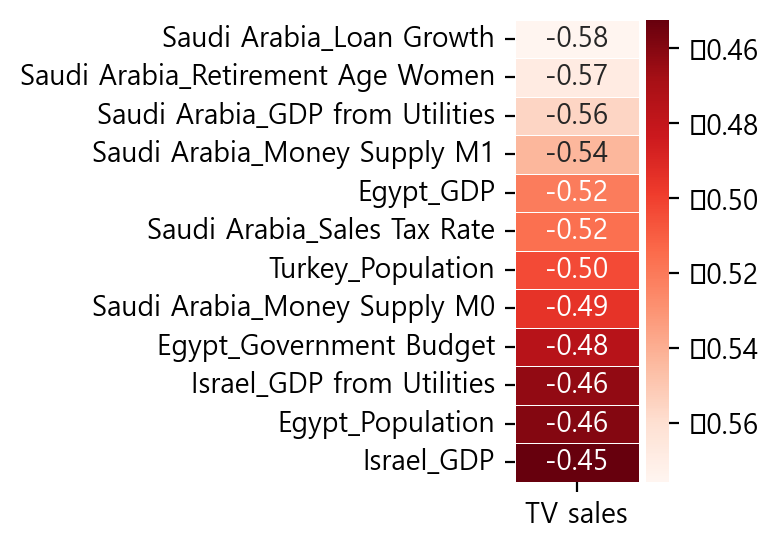

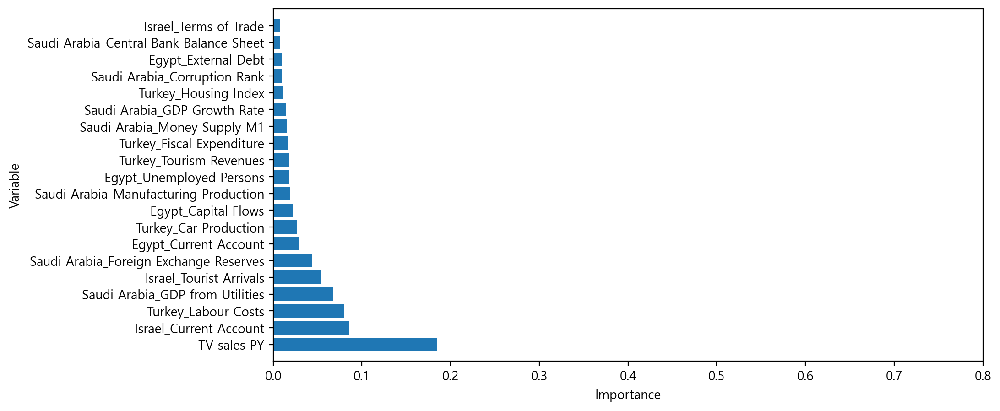

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


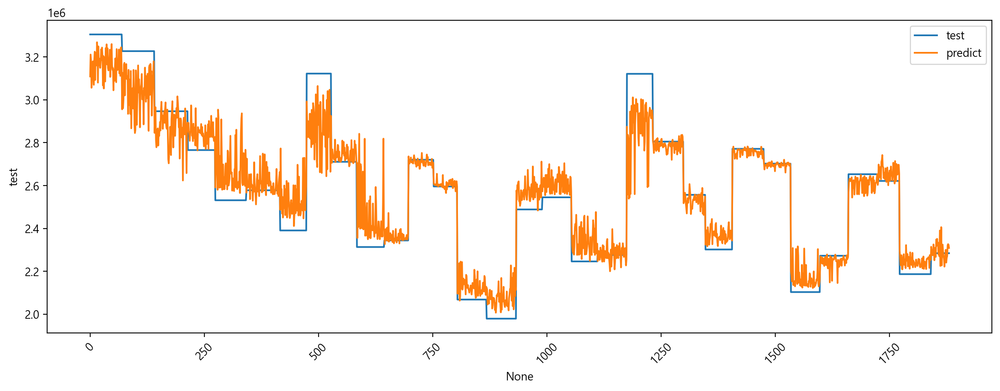

(92, 328)
(15, 2)
15
[2, 19, 33, 55, 119, 136, 166, 186, 194, 205, 269, 279, 281, 303, 305]
max_feature 조정: 1
max_feature 갯수: 12
(92, 15)
랜덤 포레스트 회귀
Train 결정계수: 0.982
Test 결정계수: 0.877


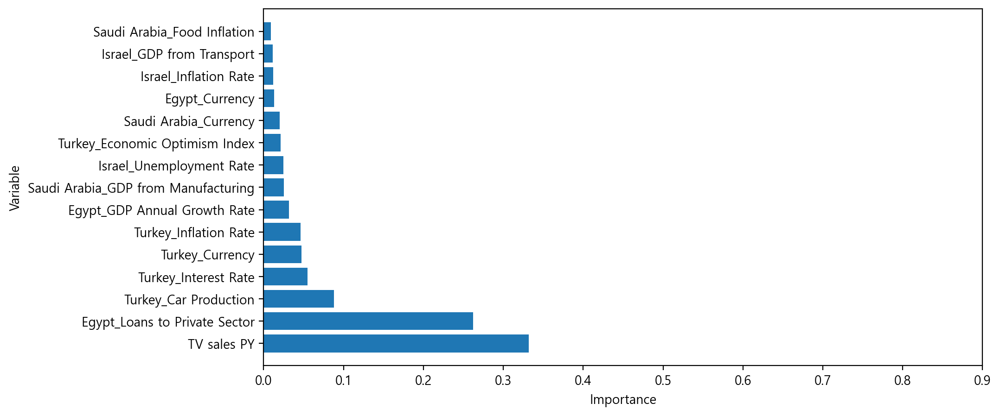

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


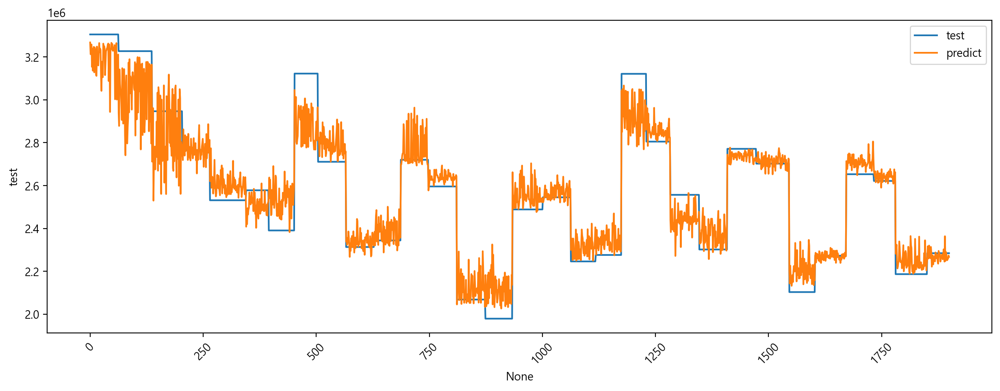

(108, 328)
(15, 2)
15
[2, 19, 33, 55, 119, 136, 166, 186, 194, 205, 269, 279, 281, 303, 305]
(108, 15)
랜덤 포레스트 회귀


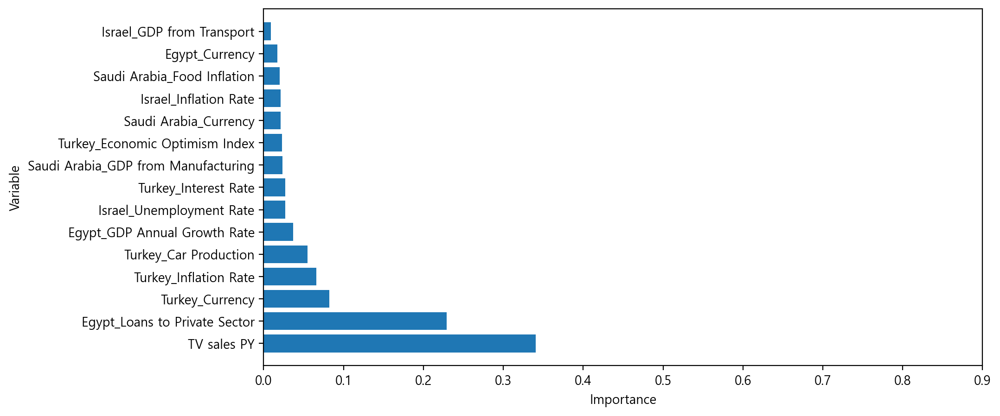

corr: [0.57] / importance: 34.0 %


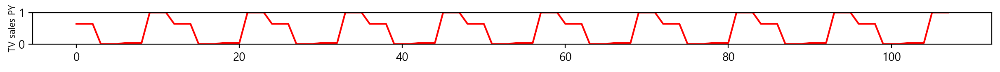

corr: [-0.21] / importance: 2.0 %


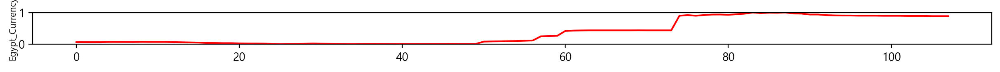

corr: [0.01] / importance: 4.0 %


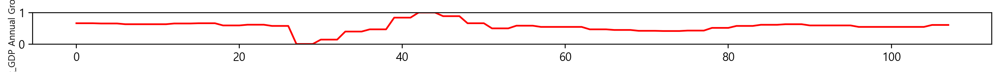

corr: [-0.33] / importance: 23.0 %


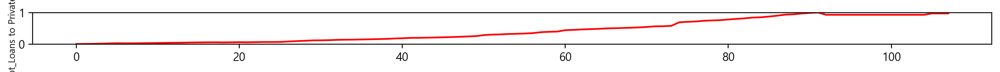

corr: [-0.02] / importance: 1.0 %


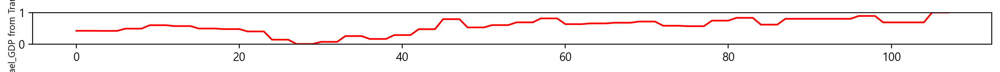

corr: [-0.15] / importance: 2.0 %


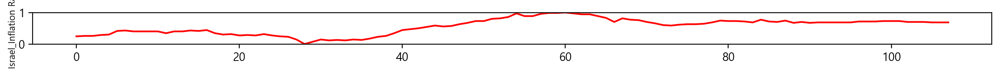

corr: [-0.03] / importance: 3.0 %


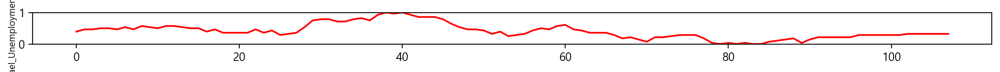

corr: [0.05] / importance: 2.0 %


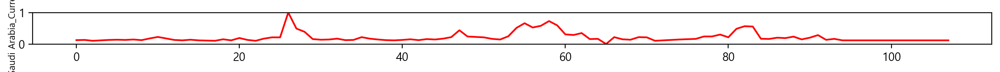

corr: [-0.19] / importance: 2.0 %


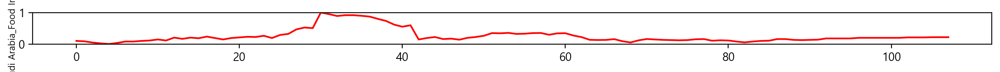

corr: [-0.29] / importance: 2.0 %


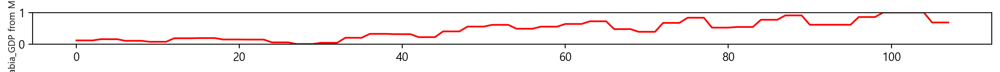

corr: [0.45] / importance: 6.0 %


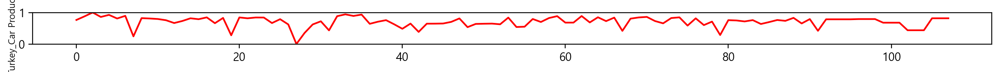

corr: [-0.3] / importance: 8.0 %


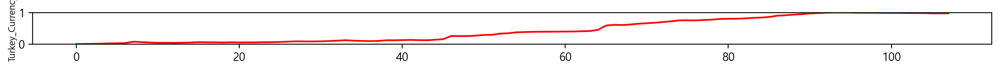

corr: [0.24] / importance: 2.0 %


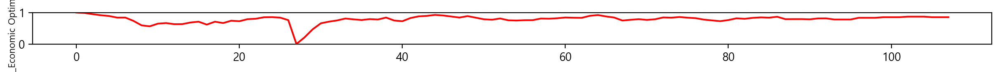

corr: [-0.18] / importance: 7.000000000000001 %


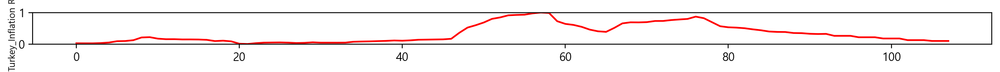

corr: [-0.3] / importance: 3.0 %


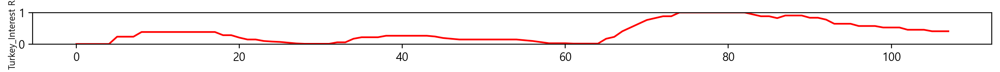

랜덤 포레스트 회귀: 예측 결과


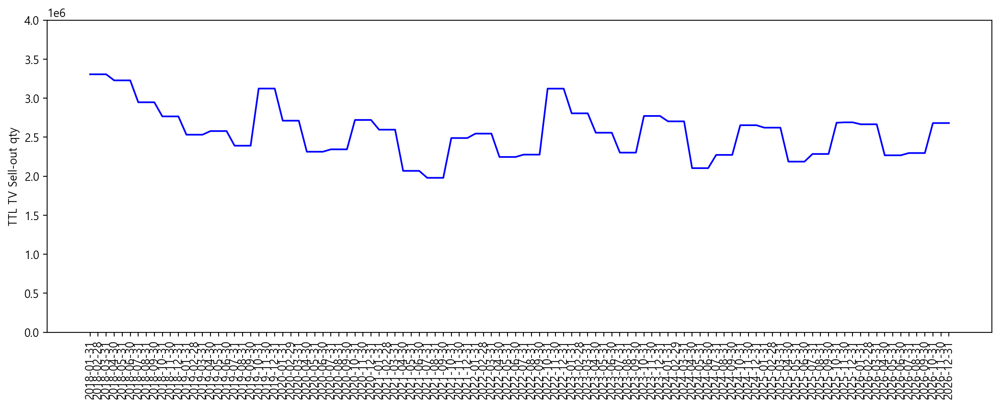

2284285.0 2688042.0 2664849.0 2267262.0 2296357.0 2680471.0
-------
(7, 11)
구글트렌드 적용: N
법인명: 05.SEA
(120, 451)
COVID 구간 제외 여부:  Y
COVID 구간 :  12
max_feature 조정값:(No=0/Yes=1) 0
max_feature 갯수: 0
feature 범위: 0 ~ - 0 개월
(92, 450)
(92, 451)
['TV sales', 'Taiwan_Corporate Tax Rate', 'Taiwan_Cement Production', 'Singapore_Corruption Index', 'Singapore_Social Security Rate For Employees', 'Singapore_Personal Income Tax Rate', 'Singapore_Social Security Rate For Companies']
['TV sales', 'Taiwan_GDP from Public Administration', 'Singapore_Current Account', 'Singapore_Gross National Product', 'Taiwan_GDP from Construction', 'Taiwan_CPI Housing Utilities', 'Singapore_Gasoline Prices']
(92, 451)
랜덤 포레스트 회귀
Train 결정계수: 0.992
Test 결정계수: 0.947


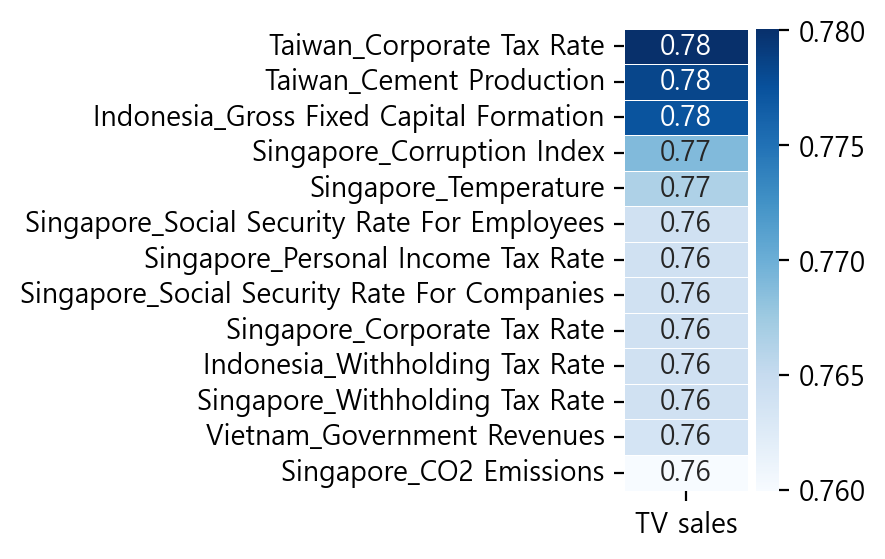

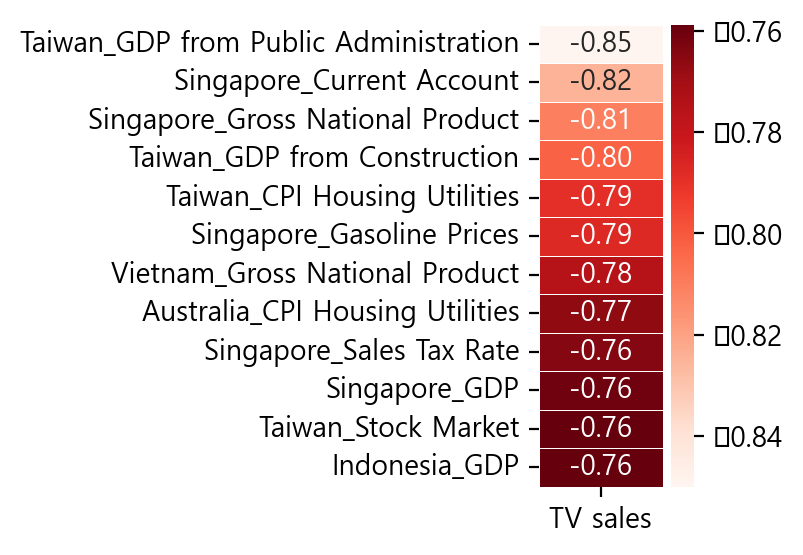

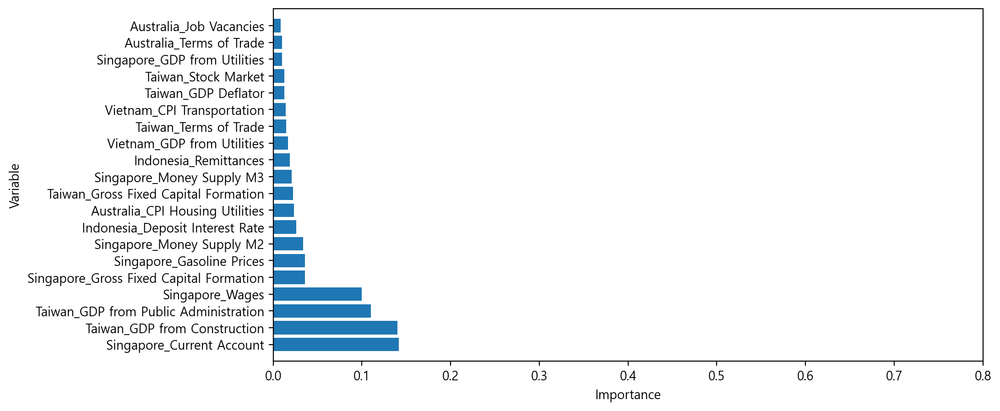

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


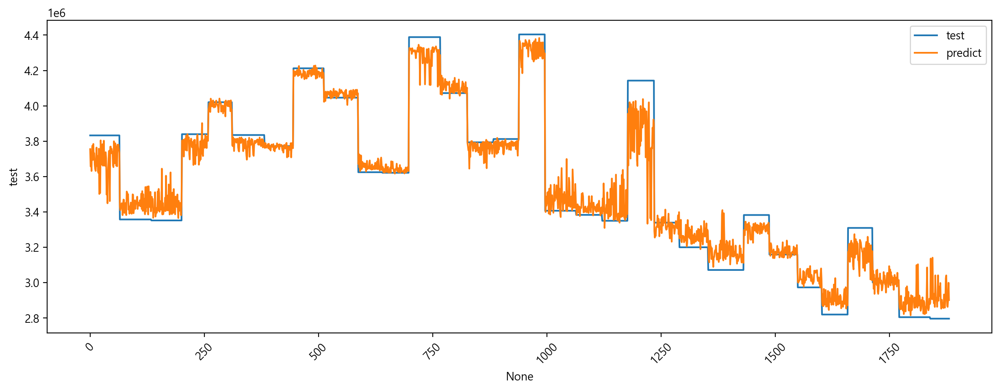

(92, 451)
(15, 2)
15
[2, 13, 21, 72, 75, 103, 147, 166, 180, 251, 304, 398, 399, 405, 447]
max_feature 조정: 0
max_feature 갯수: 0
(92, 15)
랜덤 포레스트 회귀
Train 결정계수: 0.986
Test 결정계수: 0.905


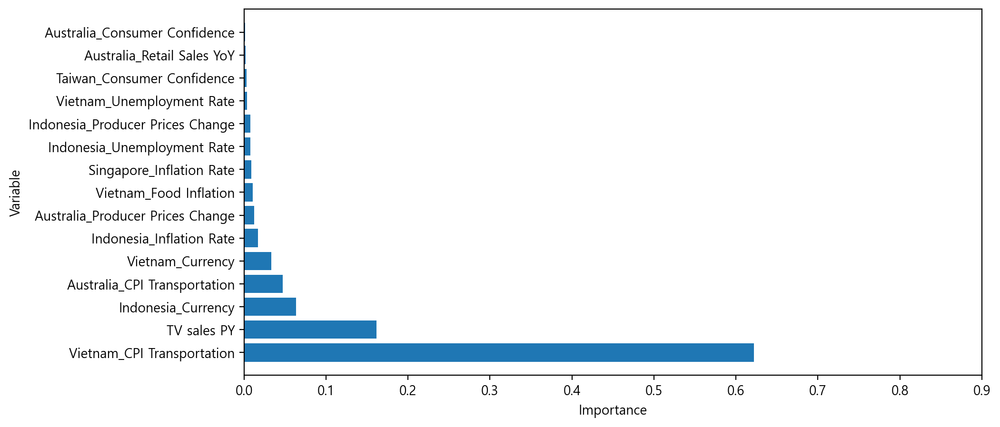

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


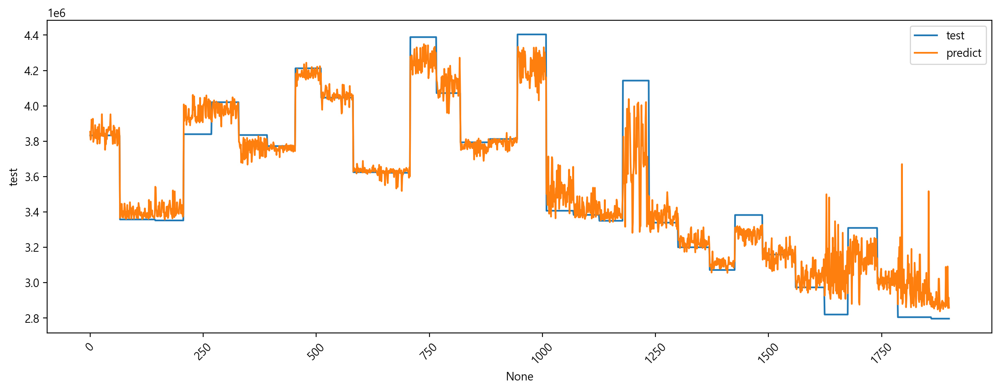

(108, 451)
(15, 2)
15
[2, 13, 21, 72, 75, 103, 147, 166, 180, 251, 304, 398, 399, 405, 447]
(108, 15)
랜덤 포레스트 회귀


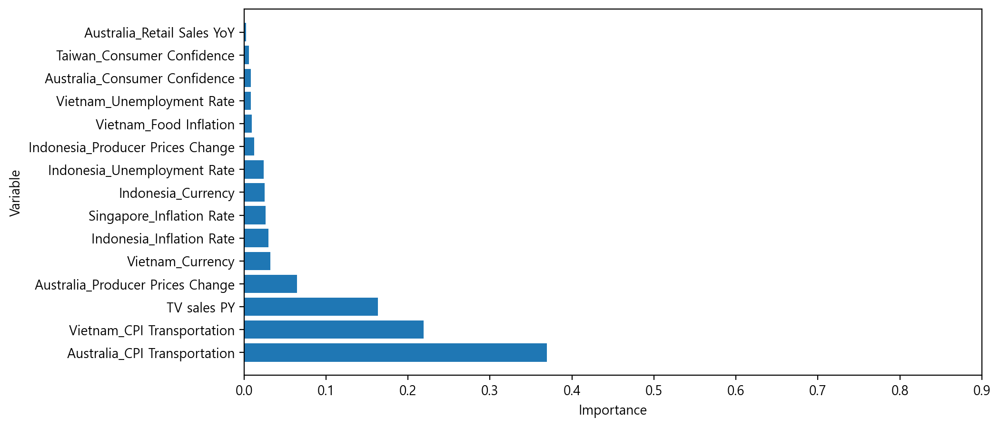

corr: [0.5] / importance: 16.0 %


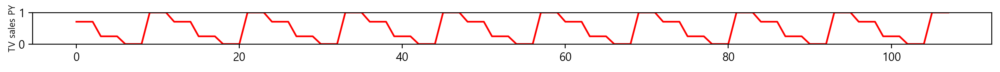

corr: [0.49] / importance: 1.0 %


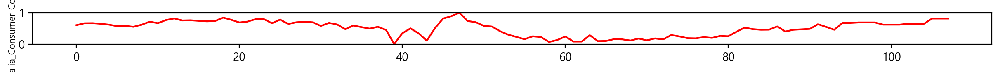

corr: [-0.71] / importance: 37.0 %


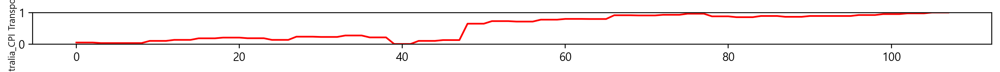

corr: [-0.54] / importance: 6.0 %


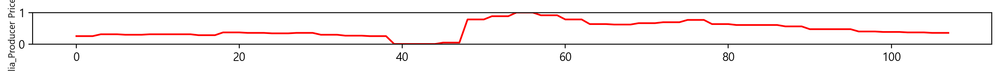

corr: [0.1] / importance: 0.0 %


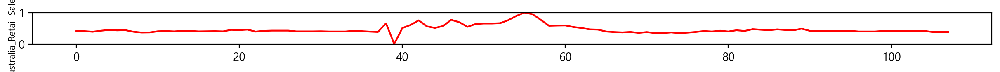

corr: [-0.58] / importance: 2.0 %


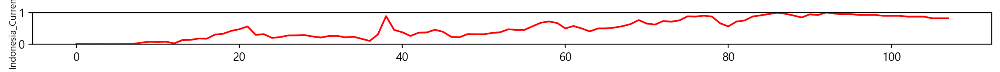

corr: [0.15] / importance: 3.0 %


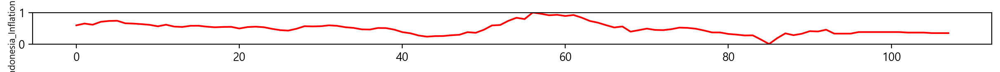

corr: [0.05] / importance: 1.0 %


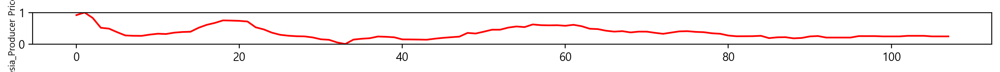

corr: [0.31] / importance: 2.0 %


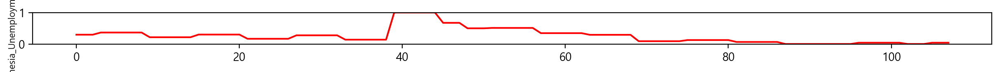

corr: [-0.32] / importance: 3.0 %


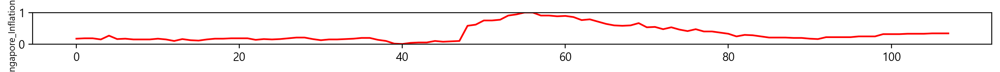

corr: [0.44] / importance: 1.0 %


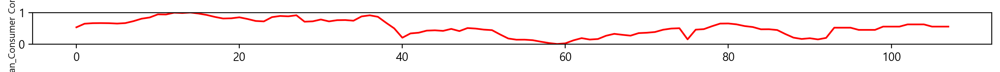

corr: [-0.64] / importance: 22.0 %


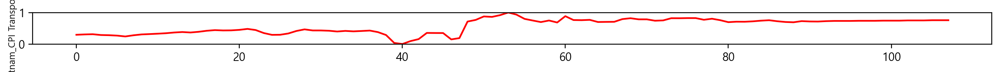

corr: [-0.64] / importance: 3.0 %


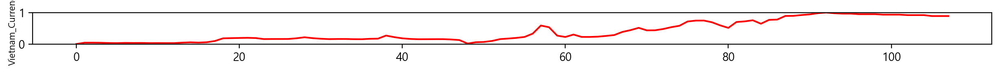

corr: [-0.1] / importance: 1.0 %


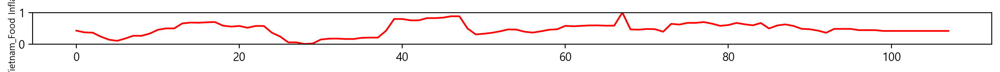

corr: [0.02] / importance: 1.0 %


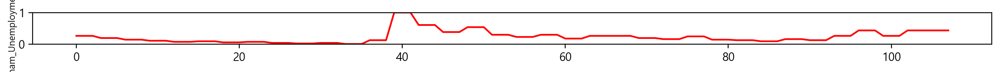

랜덤 포레스트 회귀: 예측 결과


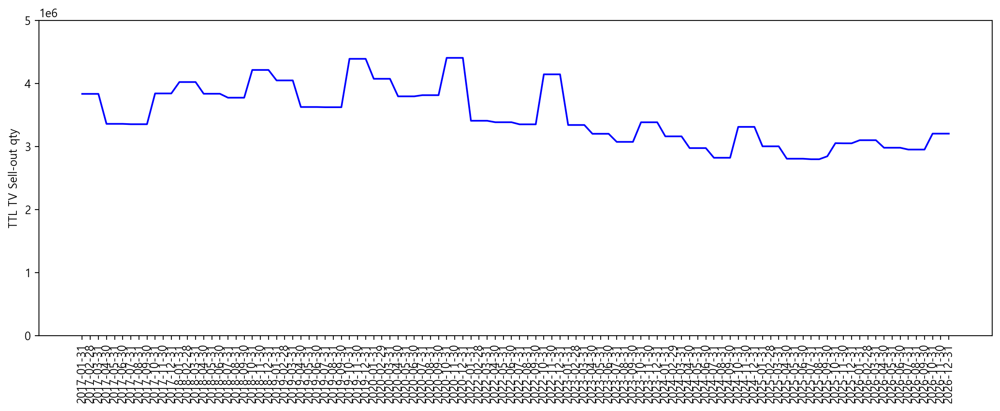

2811453.0 3049272.0 3097869.0 2978488.0 2949467.0 3201973.0


In [8]:
for sub_i in tqdm.tqdm_notebook(range(1,subs_no,1)):
    
##############################################################################################################
### sub_i = EU 2, SCA 3, MEA 4, SEA 5 ###
##############################################################################################################


##### DX Signal 법인만 추출 #####
# dx_signal_sub = [1]
# for sub_i in tqdm.tqdm_notebook(dx_signal_sub):
#################################


    m_rows_init = m_rows_init_org
    m_rows_2_init = m_rows_2_init_org

    file_dir_sub = "D:/05. SCM DX개선/{}/0.ALL/subsidiary_name.csv".format(PG_dir)
    # 법인정보 가져오기 #
    df_subsidiary = pd.DataFrame()
    df_subsidiary = pd.read_csv(file_dir_sub)
    
    exclude_covid_org = exclude_covid
        
    ##### flag 추가 24.09.12 #####
    if df_subsidiary["ml_fcst"][sub_i-1] == "Y":
    
        print("-------")
        print(df_subsidiary.shape)
        df_subsidiary_name = list(df_subsidiary["subsidiary_name"])
        subsidiary_name = df_subsidiary_name[sub_i-1]

        google_trends_yn = df_subsidiary.loc[sub_i-1,"google_trends"]
        if use_google_trends == "Y":
            print("구글트렌드 적용: "+google_trends_yn)

        print("법인명: "+subsidiary_name)

        file_dir = "D:/05. SCM DX개선/{}/{}/Raw/historical_indicator_Q.csv".format(PG_dir, subsidiary_name)
        file_dir2 = "D:/05. SCM DX개선/{}/{}/corr_data.csv".format(PG_dir, subsidiary_name)
        file_dir3 = "D:/05. SCM DX개선/{}/{}/regression_data.csv".format(PG_dir, subsidiary_name)
        file_dir4 = "D:/05. SCM DX개선/{}/{}/regression_pred_data.csv".format(PG_dir, subsidiary_name)
        file_dir5 = "D:/05. SCM DX개선/{}/{}/regression_data_m.csv".format(PG_dir, subsidiary_name)
        file_dir6 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m.csv".format(PG_dir, subsidiary_name)
        file_dir7 = "D:/05. SCM DX개선/{}/{}/regression_data_m_f.csv".format(PG_dir, subsidiary_name)
        file_dir8 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_c.csv".format(PG_dir, subsidiary_name)
        file_dir9 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_fn.csv".format(PG_dir, subsidiary_name)
        file_dir10 = "D:/05. SCM DX개선/{}/{}/Raw/feature_names.csv".format(PG_dir, subsidiary_name)
        file_dir11 = "D:/05. SCM DX개선/{}/{}/regression_data_m_c.csv".format(PG_dir, subsidiary_name)
        file_dir12 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_c_lgbm.csv".format(PG_dir, subsidiary_name)
        file_dir13 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_c_svm.csv".format(PG_dir, subsidiary_name)
        file_dir14 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_lgbm.csv".format(PG_dir, subsidiary_name)
        file_dir15 = "D:/05. SCM DX개선/{}/{}/regression_data_m_c_svm.csv".format(PG_dir, subsidiary_name)
        file_dir16 = "D:/05. SCM DX개선/{}/{}/test_composite.xlsx".format(PG_dir, subsidiary_name)
        file_dir17 = "D:/05. SCM DX개선/{}/{}/regression_data_m_woc.csv".format(PG_dir, subsidiary_name)
        file_dir18 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_woc.csv".format(PG_dir, subsidiary_name)
        file_dir19 = "D:/05. SCM DX개선/{}/{}/corr_data_wo_covid.csv".format(PG_dir, subsidiary_name)
        file_dir20 = "D:/05. SCM DX개선/{}/{}/test.csv".format(PG_dir, subsidiary_name)
        file_dir21 = "D:/05. SCM DX개선/{}/{}/test_composite_Q.csv".format(PG_dir, subsidiary_name)
        file_dir22 = "D:/05. SCM DX개선/{}/{}/regression_data_woc.csv".format(PG_dir, subsidiary_name)
        file_dir23 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_woc.csv".format(PG_dir, subsidiary_name)
        file_dir24 = "D:/05. SCM DX개선/{}/{}/regression_data_m_f_woc.csv".format(PG_dir, subsidiary_name)
        file_dir25 = "D:/05. SCM DX개선/{}/{}/regression_data_m_lgbm.csv".format(PG_dir, subsidiary_name)


        df = pd.read_csv(file_dir)

        covid_start = 0
        covid_end = 0
        covid_range = 0


        if exclude_covid == "Y":
            covid_start = df[df["COVID_YN"]==1].index[0:].min()   # COVID 시작
            covid_end = df[df["COVID_YN"]==1].index[0:].max()+1   # COVID 끝

        # if subsidiary_name == "10.SP" or subsidiary_name == "16.CL": # 브라질 2016년 부터
        #     covid_start = covid_start + 12 
        #     covid_end = covid_end + 12

        covid_range = covid_end - covid_start
        exclude_covid_org = exclude_covid

        if np.isnan(covid_range):
            exclude_covid = "N" # Pent-up 수요기간 없을 경우


        # 23.04.12 제외 
        # if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
        #     df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
        #     df = df.reset_index(drop=True)

        print(df.shape)
        print("COVID 구간 제외 여부: ",exclude_covid)
        print("COVID 구간 : ",covid_range)
        df_org = df.copy()


        # 23.4.12 추가
        if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
            m_rows_init = m_rows_init + 12         # 2020.01
            m_rows_2_init = m_rows_2_init + 12     # 2020.12

        m_rows = m_rows_init    
        m_rows_2 = m_rows_2_init  


        ### m_rows 추가 조정 ###
        if exclude_covid == "Y" :
            m_rows = m_rows-covid_range
            m_rows_2 = m_rows_2-covid_range

        # 23.4.12 제외
        # if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
        #     m_rows = m_rows + 12         # 2020.01
        #     m_rows_2 = m_rows_2 + 12     # 2020.12
        ### m_rows 추가 조정 ###


        t_size = m_rows_2-m_rows     # 예측기간
        q_loc = 0      # Q+1 시작점


        org_feature_no = df.shape[1]-2 # Features
        max_feature_adj = 0 # max_feature 조정시 1 / 아닐경우 0
        max_feature_no = 0 

        # if subsidiary_name == "07.PL" or subsidiary_name == "09.MS": # Seasonality 종속성 완화
        #     max_feature_adj = 1
        #     max_feature_no = 7

        # if subsidiary_name == "01.CI" or subsidiary_name == "14.IL" or subsidiary_name == "06.IS": # Seasonality 종속성 완화
        #     max_feature_adj = 1
        #     max_feature_no = 8

        # if subsidiary_name == "02.US": # Seasonality 종속성 완화
        #     max_feature_adj = 1
        #     max_feature_no = 8

        # if subsidiary_name == "08.UK": # Seasonality 종속성 완화
        #     max_feature_adj = 1
        #     max_feature_no = 12

        max_feature_adj = df_subsidiary["dependency"][sub_i-1]
        max_feature_no = df_subsidiary["max_no"][sub_i-1]
        mov_no = df_subsidiary["mov"][sub_i-1]

        print("max_feature 조정값:(No=0/Yes=1)", max_feature_adj)
        print("max_feature 갯수:", max_feature_no)
        print("feature 범위: 0 ~ -", mov_no,"개월")


        # M0 ~ M+6 TV sales와 인자별 상관계수 분석
        # 상관분석 M+1

        # for mov in range (1,7,1):    # 6개월 선행관계 확인
        for mov in range (0,7,1):    # 6개월 선행관계 확인

            df_TV_sales = pd.DataFrame()
            df_features = pd.DataFrame()
            df_features_mov = pd.DataFrame()

            df_TV_sales = df_org.iloc[covid:m_rows_init,:3]

            df_TV_sales = df_TV_sales.reset_index(drop=True)

            # 24.01.29 변경 mov=0 추가
            if mov == 0:
                ######
                df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+1]
                df = pd.concat([df_TV_sales, df_features], axis=1)
                ######
            else:

                # 23.4.12 변경
                df_features = df_org.iloc[covid:covid+1,3:org_feature_no+1]
                for item in range (1, mov, 1):
                    # df_features = df_features.append(df_org.iloc[covid:covid+1,3:org_feature_no+1], ignore_index=True)
                     df_features = pd.concat([df_features, df_org.iloc[covid:covid+1,3:org_feature_no+1]], ignore_index=True)
                # 변경 완료

                # df_features = df_features.append(df_org.iloc[covid:m_rows_init-mov,3:org_feature_no+2], ignore_index=True)
                df_features = pd.concat([df_features,df_org.iloc[covid:m_rows_init-mov,3:org_feature_no+2]], ignore_index=True)

                df = pd.concat([df_TV_sales, df_features], axis=1)

            # 23.4.12 추가
            if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
                df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
                df = df.reset_index(drop=True)

        #     if mov == 1:
            if mov == 0:
                print(df.shape)

            df_cor = df.drop(columns=['ds']).corr()
            num = df_cor._get_numeric_data()
            num[num < 0] = num*-1

            corr_data_pros = pd.DataFrame()
            corr_data_cons = pd.DataFrame()
            corr_data_pros = df.drop(columns=['ds']).corr().iloc[:,[0]]
            corr_data_cons = df.drop(columns=['ds']).corr().iloc[:,[0]]
            corr_data_pros = corr_data_pros.sort_values(by=prod_type, ascending=False)
            corr_data_cons = corr_data_cons.sort_values(by=prod_type, ascending=True)

            corr_data_pros["mov"] = mov

            if exclude_covid == "Y" :
                if not os.path.exists(file_dir19):
                    corr_data_pros.to_csv(file_dir19, index=True, mode='w', encoding='utf-8-sig')
                else:
        #             if mov==1:
                    if mov==0:
                        corr_data_pros.to_csv(file_dir19, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        corr_data_pros.to_csv(file_dir19, index=True, mode='a', encoding='utf-8-sig', header=False)
            else:            
                # .to_csv 
                # 최초 생성 이후 mode는 append
                if not os.path.exists(file_dir2):
                    corr_data_pros.to_csv(file_dir2, index=True, mode='w', encoding='utf-8-sig')
                else:
        #             if mov==1:
                    if mov==0:
                        corr_data_pros.to_csv(file_dir2, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        corr_data_pros.to_csv(file_dir2, index=True, mode='a', encoding='utf-8-sig', header=False)


        # TV sales vs 지표별 상관계수

        # 파일 열기
        df = pd.read_csv(file_dir)

        df_TV_sales = pd.DataFrame()
        df_features = pd.DataFrame()
        df_features_mov = pd.DataFrame()

        df_TV_sales = df.iloc[covid:m_rows_init,:3]

        df_TV_sales = df_TV_sales.reset_index(drop=True)


        # 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
        df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+2]
        df = pd.concat([df_TV_sales, df_features], axis=1)


        # 23.4.12 변경
        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        # 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
        # for item in range (2, mov_no+1, 1):

        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        for item in range (1, mov_no+1, 1):
            if item == 1:
                df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
                # df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
                df_features_mov = pd.concat([df_features_mov, df.iloc[covid:m_rows_init-1,3:org_feature_no+2]], ignore_index=True)
                df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')

            else:
                df_features_mov = df.iloc[covid:m_rows_init,3:org_feature_no+2].shift(item-1)
                df_features_mov = df_features_mov.fillna(method='bfill')

            new_cols = []
            for col in df_features_mov.columns:
                new_col = str(col + "_" + str(item))
                new_cols.append(new_col)

            df_features_mov.columns = new_cols

            df = pd.concat([df, df_features_mov], axis=1)
        #변경 완료


        # 23.4.12 추가
        if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
            df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
            df = df.reset_index(drop=True)

        print(df.shape)  


        df_cor = df.drop(columns=['ds']).corr()
        num = df_cor._get_numeric_data()
        num[num < 0] = num*-1

        corr_data = pd.DataFrame()
        corr_data_pros = pd.DataFrame()
        corr_data_cons = pd.DataFrame()
        corr_data = df.drop(columns=['ds']).corr().iloc[:,[0]]
        corr_data_pros = df.drop(columns=['ds']).corr().iloc[:,[0]]
        corr_data_cons = df.drop(columns=['ds']).corr().iloc[:,[0]]
        corr_data_pros = corr_data_pros.sort_values(by=prod_type, ascending=False)
        corr_data_cons = corr_data_cons.sort_values(by=prod_type, ascending=True)

        plt.figure(figsize=(1,3))
        sns.heatmap(data = corr_data_pros.iloc[1:14,[0]], annot=True, 
        fmt = '.2f', linewidths=.3, cmap='Blues')
        plt.figure(figsize=(1,3))
        sns.heatmap(data = corr_data_cons.iloc[:12,[0]], annot=True, 
        fmt = '.2f', linewidths=.3, cmap='Reds')

        corr_data_pros_index1 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[1:3].tolist() + corr_data_pros.index[4:5].tolist() + corr_data_pros.index[6:9].tolist()
        corr_data_pros_index2 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[8:14].tolist()
        corr_data_pros_index3 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[14:20].tolist()
        corr_data_cons_index1 = corr_data_pros.index[0:1].tolist() + corr_data_cons.index[0:6].tolist()
        corr_data_cons_index2 = corr_data_pros.index[0:1].tolist() + corr_data_cons.index[6:12].tolist()
        print(corr_data_pros_index1)
        print(corr_data_cons_index1)

        ### 그래프 최대값 ###
        max_sales = (max(df[prod_type]) // 10**(len(str(int(max(df[prod_type])))) - 1) + 1) * 10**(len(str(int(max(df[prod_type])))) - 1)

        #########################################################
        ######## ----- 여기까지 필수로 실행할 것 ----- ##########
        #########################################################

        # 랜덤포레스트를 통한 중요도 분석

        # 파일 열기
        df = pd.read_csv(file_dir)

        df_TV_sales = pd.DataFrame()
        df_features = pd.DataFrame()
        df_features_mov = pd.DataFrame()

        df_TV_sales = df.iloc[covid:m_rows_init,:3]

        df_TV_sales = df_TV_sales.reset_index(drop=True)


        # 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
        df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+2]
        df = pd.concat([df_TV_sales, df_features], axis=1)


        # 23.4.12 변경
        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        # 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
        # for item in range (2, mov_no+1, 1):

        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        for item in range (1, mov_no+1, 1):
            if item == 1:
                df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
                # df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
                df_features_mov = pd.concat([df_features_mov, df.iloc[covid:m_rows_init-1,3:org_feature_no+2]], ignore_index=True)
                df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')

            else:
                df_features_mov = df.iloc[covid:m_rows_init,3:org_feature_no+2].shift(item-1)
                df_features_mov = df_features_mov.fillna(method='bfill')

            new_cols = []
            for col in df_features_mov.columns:
                new_col = str(col + "_" + str(item))
                new_cols.append(new_col)

            df_features_mov.columns = new_cols

            df = pd.concat([df, df_features_mov], axis=1)
        #변경 완료


        # 23.4.12 추가
        if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
            df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
            df = df.reset_index(drop=True)

        print(df.shape)


        # 23.7.5 feature 수 다시 계산함
        feature_no = df.shape[1]-2 # Features
        df_feature_names = df.columns[2:feature_no+2] 
        df_feature_names = list(df_feature_names)

        df_data = np.array(df.iloc[:,2:feature_no+2]) 
        df_target = np.array(df[prod_type])



        rfc_train_score = 0
        rfc_test_score = 0

        ### 100회 실시 ###
        for num in range (1,100,1):

            X_train, X_test, y_train, y_test = train_test_split(df_data, df_target,test_size=0.2)

            # 랜덤 포레스트를 사용한 경우의 중요 특성
            rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
            rfc.fit(X_train, y_train)        

            y_pred = rfc.predict(X_test)
            df2 = pd.DataFrame()
            df2["test"]= pd.Series(y_test)
            df2["predict"] = pd.Series(y_pred)

            # 23.5.11 머신러닝 train test prediction 분석 데이터에 연/월/일 추가하기
            df2.insert(0, 'ds', df2['test'].map(df.set_index(prod_type)['ds'].groupby(level=0).first()))

            #df_importance = pd.DataFrame({'feature':df_feature_names,'importance':rfc.feature_importances_ })
            df_importance = pd.DataFrame({'feature':df_feature_names,'importance':rfc.feature_importances_, 
                                          'corr':np.array(corr_data.iloc[:,[0]].loc[df_feature_names].round(2)[prod_type])})
            df_importance = df_importance.sort_values('importance', ascending=False)

            df_importance.index.name = "index_s"
            df_importance["train accuracy"] = round(rfc.score(X_train, y_train),3)
            df_importance["test accuracy"] = round(rfc.score(X_test, y_test),3)
            df_importance["num"] = num

            rfc_train_score = rfc_train_score + round(rfc.score(X_train, y_train),3)
            rfc_test_score = rfc_test_score + round(rfc.score(X_test, y_test),3)


            if exclude_covid == "N": # COVID 제외 로직 추가           
                # .to_csv 
                # 최초 생성 이후 mode는 append
                if not os.path.exists(file_dir3):
                    df_importance.to_csv(file_dir3, index=True, mode='w', encoding='utf-8-sig')
                else:
                    if num==1:
                        df_importance.to_csv(file_dir3, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        df_importance.to_csv(file_dir3, index=True, mode='a', encoding='utf-8-sig', header=False)

                if not os.path.exists(file_dir4):
                    df2.to_csv(file_dir4, index=True, mode='w', encoding='utf-8-sig')
                else:
                    if num==1:
                        df2.to_csv(file_dir4, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        df2.to_csv(file_dir4, index=True, mode='a', encoding='utf-8-sig', header=False)

            else:                    
                # .to_csv 
                # 최초 생성 이후 mode는 append
                if not os.path.exists(file_dir22):
                    df_importance.to_csv(file_dir22, index=True, mode='w', encoding='utf-8-sig')
                else:
                    if num==1:
                        df_importance.to_csv(file_dir22, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        df_importance.to_csv(file_dir22, index=True, mode='a', encoding='utf-8-sig', header=False)

                if not os.path.exists(file_dir23):
                    df2.to_csv(file_dir23, index=True, mode='w', encoding='utf-8-sig')
                else:
                    if num==1:
                        df2.to_csv(file_dir23, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        df2.to_csv(file_dir23, index=True, mode='a', encoding='utf-8-sig', header=False)


        x = df_importance.feature
        y = df_importance.importance
        ypos = np.arange(len(x)-1)

        print("랜덤 포레스트 회귀")
        print("Train 결정계수:", round((rfc_train_score/num),3))
        print("Test 결정계수:", round((rfc_test_score/num),3))
        plt.figure(figsize=(10,5))
        plt.barh(x.iloc[:20], y.iloc[:20])
        plt.yticks(ypos[:20], x.iloc[:20])
        plt.xlabel('Importance')
        plt.ylabel('Variable')
        plt.xlim(0, 0.8)
        plt.ylim(-1, 20)
        plt.show()



        print("TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과")

        df_pred = pd.DataFrame()

        if exclude_covid == "N": # COVID 제외 로직 추가           
            df_pred = pd.read_csv(file_dir4, index_col=0)
            df_pred = df_pred.sort_values(by='ds')
            df_pred.reset_index(drop=True, inplace=True)
            fig = plt.figure(figsize=(15, 5))
            sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
            sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
            plt.xticks(rotation=45)
            plt.show()

        else:                    
            df_pred = pd.read_csv(file_dir23, index_col=0)
            df_pred = df_pred.sort_values(by='ds')
            df_pred.reset_index(drop=True, inplace=True)
            fig = plt.figure(figsize=(15, 5))
            sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
            sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
            plt.xticks(rotation=45)
            plt.show()


        # [학습] 선행지표 기준 머신러닝 학습
        # 파일 열기
        df = pd.read_csv(file_dir)

        df_TV_sales = pd.DataFrame()
        df_features = pd.DataFrame()
        df_features_mov = pd.DataFrame()

        df_TV_sales = df.iloc[covid:m_rows_init,:3]

        df_TV_sales = df_TV_sales.reset_index(drop=True)


        # 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
        df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+2]
        df = pd.concat([df_TV_sales, df_features], axis=1)


        # 23.4.12 변경
        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        # 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
        # for item in range (2, mov_no+1, 1):

        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        for item in range (1, mov_no+1, 1):
            if item == 1:
                df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
                # df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
                df_features_mov = pd.concat([df_features_mov, df.iloc[covid:m_rows_init-1,3:org_feature_no+2]], ignore_index=True)
                df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')

            else:
                df_features_mov = df.iloc[covid:m_rows_init,3:org_feature_no+2].shift(item-1)
                df_features_mov = df_features_mov.fillna(method='bfill')

            new_cols = []
            for col in df_features_mov.columns:
                new_col = str(col + "_" + str(item))
                new_cols.append(new_col)

            df_features_mov.columns = new_cols

            df = pd.concat([df, df_features_mov], axis=1)
        #변경 완료



        # 23.4.12 추가
        if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
            df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
            df = df.reset_index(drop=True)

        print(df.shape)


        ###################################################
        ### 법인별 선행지표 파일 입력으로 변경 21.11.30 ###
        ###################################################
        df_features = pd.read_csv(file_dir10)

        if use_google_trends == "N":
            df_features = df_features[df_features["feature_names"]!=gt_key]

        print(df_features.shape)
        df_feature_index = list(df_features["index_s"])
        df_feature_names = list(df_features["feature_names"])

        df_feature_names

        m_feature = len(df_feature_names)
        print(m_feature)
        print(df_feature_index)

        # # feature 수 조정 테스트 #
        print("max_feature 조정:", max_feature_adj)
        print("max_feature 갯수:", max_feature_no)


        ############################################
        ### df_data 파일 입력으로 변경 21.11.30  ###
        ############################################
        df_data = np.array(df.iloc[:,2:3])

        for n in range(1,m_feature,1):

            df_data = np.concatenate((df_data, np.array(df.iloc[:,df_feature_index[n]:df_feature_index[n]+1])), axis=1)

        print(df_data.shape)
        df_target = np.array(df[prod_type])

        rfc_train_score = 0
        rfc_test_score = 0
        rfc_test_adj_score = 0
        svm_train_score = 0
        svm_test_score = 0

        ### 100회 실시 ###
        for num in range (1,101,1):

            #X_train, X_test, y_train, y_test = train_test_split(df_data, df_target, shuffle=False, test_size=t_size)
            X_train, X_test, y_train, y_test = train_test_split(df_data, df_target,test_size=0.2)

            # 랜덤 포레스트를 사용한 경우의 중요 특성
            if max_feature_adj == 0 :
                rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
            elif max_feature_adj == 1 :
                ### TV sales PY 중요도 80% 초과시 민감도 위한 max_feature 수 조정
                rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200,max_features=max_feature_no)

            rfc.fit(X_train, y_train)

            y_pred = rfc.predict(X_test)
            df2 = pd.DataFrame()
            df2["test"]= pd.Series(y_test)
            df2["predict"] = pd.Series(y_pred)
            df2["num"] = num
            df2["accuracy"] = 1 - (abs(y_test-y_pred)/y_test)

            # 23.5.11 머신러닝 train test prediction 분석 데이터에 연/월/일 추가하기
            df2.insert(0, 'ds', df2['test'].map(df.set_index(prod_type)['ds'].groupby(level=0).first()))

            df_importance = pd.DataFrame({'feature':df_feature_names,'importance':rfc.feature_importances_, 
                                          'corr':np.array(corr_data.iloc[:,[0]].loc[df_feature_names].round(2)[prod_type])})
            df_importance = df_importance.sort_values('importance', ascending=False)

            df_importance.index.name = "index_s"    

            df_importance["train accuracy"] = round(rfc.score(X_train, y_train),3)
            df_importance["test accuracy"] = round(rfc.score(X_test, y_test),3)

            ### 수정 결정계수 분석을 위해 추가 21.12.13
            X_train2 = sm.add_constant(X_train)
            model2 = sm.OLS(y_train, X_train2)
            result = model2.fit()
            df_importance["test ols accuracy"] = round(result.rsquared,3)
            df_importance["test adj accuracy"] = round(result.rsquared_adj,3)

            df_importance["num"] = num    

            rfc_train_score = rfc_train_score + round(rfc.score(X_train, y_train),3)
            rfc_test_score = rfc_test_score + round(rfc.score(X_test, y_test),3)
            rfc_test_adj_score = rfc_test_adj_score + round(result.rsquared_adj,3)


            ### 구글트렌드 사용시에만 저장 24.06.12 ###
            if use_google_trends == "Y":

                if exclude_covid == "N": # COVID 제외 로직 추가
                    # .to_csv 
                    # 최초 생성 이후 mode는 append
                    if not os.path.exists(file_dir5):
                        df_importance.to_csv(file_dir5, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        if num==1: 
                            df_importance.to_csv(file_dir5, index=True, mode='w', encoding='utf-8-sig')
                        else:
                            df_importance.to_csv(file_dir5, index=True, mode='a', encoding='utf-8-sig', header=False)

                    if not os.path.exists(file_dir6):
                        df2.to_csv(file_dir6, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        if num==1: 
                            df2.to_csv(file_dir6, index=True, mode='w', encoding='utf-8-sig')
                        else:
                            df2.to_csv(file_dir6, index=True, mode='a', encoding='utf-8-sig', header=False)

                else:
                    # .to_csv 
                    # 최초 생성 이후 mode는 append
                    if not os.path.exists(file_dir17):
                        df_importance.to_csv(file_dir17, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        if num==1: 
                            df_importance.to_csv(file_dir17, index=True, mode='w', encoding='utf-8-sig')
                        else:
                            df_importance.to_csv(file_dir17, index=True, mode='a', encoding='utf-8-sig', header=False)

                    if not os.path.exists(file_dir18):
                        df2.to_csv(file_dir18, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        if num==1: 
                            df2.to_csv(file_dir18, index=True, mode='w', encoding='utf-8-sig')
                        else:
                            df2.to_csv(file_dir18, index=True, mode='a', encoding='utf-8-sig', header=False)   



        x = df_importance.feature
        y = df_importance.importance
        ypos = np.arange(len(x))

        print("랜덤 포레스트 회귀")
        print("Train 결정계수:", round((rfc_train_score/num),3))
        print("Test 결정계수:", round((rfc_test_score/num),3))
        plt.figure(figsize=(10,5))
        plt.barh(x.iloc[0:], y.iloc[0:])
        plt.yticks(ypos, x.iloc[0:])
        plt.xlabel('Importance')
        plt.ylabel('Variable')
        plt.xlim(0, 0.9)
        plt.ylim(-1, len(x))
        plt.show()


        print("TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과")


        if exclude_covid == "N": # COVID 제외 로직 추가           
            df_pred = pd.read_csv(file_dir6, index_col=0)
            df_pred = df_pred.sort_values(by='ds')
            df_pred.reset_index(drop=True, inplace=True)
            fig = plt.figure(figsize=(15, 5))
            sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
            sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
            plt.xticks(rotation=45)
            plt.show()

        else:                    
            df_pred = pd.read_csv(file_dir18, index_col=0)
            df_pred = df_pred.sort_values(by='ds')
            df_pred.reset_index(drop=True, inplace=True)
            fig = plt.figure(figsize=(15, 5))
            sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
            sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
            plt.xticks(rotation=45)
            plt.show()



        # [예측] 선행지표 기준 Q+1~Q+2 예측

        # 파일 열기
        df = pd.read_csv(file_dir)

        df_TV_sales = pd.DataFrame()
        df_features = pd.DataFrame()
        df_features_mov = pd.DataFrame()

        df_TV_sales = df.iloc[covid:m_rows_2_init,:3]

        df_TV_sales = df_TV_sales.reset_index(drop=True)


        # 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
        df_features = df_org.iloc[covid:m_rows_2_init,3:org_feature_no+2]
        df = pd.concat([df_TV_sales, df_features], axis=1)


        # 23.4.12 변경
        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        # 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
        # for item in range (2, mov_no+1, 1):

        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        for item in range (1, mov_no+1, 1):
            if item == 1:
                df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
                # df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_2_init-1,3:org_feature_no+2], ignore_index=True)
                df_features_mov = pd.concat([df_features_mov, df.iloc[covid:m_rows_2_init-1,3:org_feature_no+2]], ignore_index=True)
                df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')

            else:
                df_features_mov = df.iloc[covid:m_rows_2_init,3:org_feature_no+2].shift(item-1)
                df_features_mov = df_features_mov.fillna(method='bfill')

            new_cols = []
            for col in df_features_mov.columns:
                new_col = str(col + "_" + str(item))
                new_cols.append(new_col)

            df_features_mov.columns = new_cols

            df = pd.concat([df, df_features_mov], axis=1)
        #변경 완료


        # 23.4.12 추가
        if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
            df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
            df = df.reset_index(drop=True)

        print(df.shape)


        ###################################################
        ### 법인별 선행지표 파일 입력으로 변경 21.11.30 ###
        ###################################################
        df_features = pd.read_csv(file_dir10)

        if use_google_trends == "N":
            df_features = df_features[df_features["feature_names"]!=gt_key]
        print(df_features.shape)
        df_feature_index = list(df_features["index_s"])
        df_feature_names = list(df_features["feature_names"])

        df_feature_names

        m_feature = len(df_feature_names)
        print(m_feature)
        print(df_feature_index)

        ############################################
        ### df_data 파일 입력으로 변경 21.11.30  ###
        ############################################
        df_data = np.array(df.iloc[:,2:3])

        for n in range(1,m_feature,1):

            df_data = np.concatenate((df_data, np.array(df.iloc[:,df_feature_index[n]:df_feature_index[n]+1])), axis=1)

        print(df_data.shape)
        df_target = np.array(df[prod_type])

        #df_norm_feature_names = list(df.columns[1:2]) + list(df_feature_names)  
        df_norm_feature_names = list(df_feature_names)  
        df_norm_data = df_data

        df_norm = pd.DataFrame()
        scaler = MinMaxScaler()
        df_norm = pd.DataFrame(scaler.fit_transform(df_norm_data), columns=df_norm_feature_names)
        df_norm.insert(0, prod_type, df[prod_type])
        df_norm.insert(0, 'ds', df["ds"])
        #df_data_trans = np.array(df_norm.iloc[:,2:])

        ##############################
        ### 스케일링값 저장        ###
        ##############################
        ### 구글트렌드 사용시에만 저장 24.06.12 ###
        if use_google_trends == "Y":
            if exclude_covid == "N": # COVID 제외 로직 추가
                df_norm.to_csv(file_dir20, index=True, mode='w', encoding='utf-8-sig')

        #X_train, X_test, y_train, y_test = train_test_split(df_data_trans, df_target, shuffle=False, test_size=t_size)
        X_train, X_test, y_train, y_test = train_test_split(df_data, df_target, shuffle=False, test_size=t_size)
        #X_train, X_test, y_train, y_test = train_test_split(df_data, df_target,test_size=t_size)

        df_importance = pd.DataFrame()

        # 랜덤 포레스트를 사용한 경우의 중요 특성
        # 랜덤 포레스트를 사용한 경우의 중요 특성
        if max_feature_adj == 0 :
            rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
        elif max_feature_adj == 1 :
            ### TV sales PY 중요도 80% 초과시 민감도 위한 max_feature 수 조정
            rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200,max_features=max_feature_no)

        rfc.fit(X_train, y_train)

        df_importance = pd.DataFrame({'feature':df_feature_names,'importance':rfc.feature_importances_, 
                                      'corr':np.array(corr_data.iloc[:,[0]].loc[df_feature_names].round(2)[prod_type])})


        ### 구글트렌드 사용시에만 저장 24.06.12 ###
        if use_google_trends == "Y":

            if exclude_covid == "N":
                df_importance.to_csv(file_dir7, index=True, mode='w', encoding='utf-8-sig')
            # 23.4.27 COVID 기간 제외기준 추가
            else:
                df_importance.to_csv(file_dir24, index=True, mode='w', encoding='utf-8-sig')

        df_importance = df_importance.sort_values('importance', ascending=False)

        x = df_importance.feature
        y = df_importance.importance
        ypos = np.arange(len(x))



        print("랜덤 포레스트 회귀")
    #     print("Train 결정계수:", rfc.score(X_train, y_train).round(3))
        plt.figure(figsize=(10,5))
        plt.barh(x.iloc[0:], y.iloc[0:])
        plt.yticks(ypos, x.iloc[0:])
        plt.xlabel('Importance')
        plt.ylabel('Variable')
        plt.xlim(0, 0.9)
        plt.ylim(-1, len(x))
        plt.show()

        y_pred = rfc.predict(X_test)
        y_train_pred = np.concatenate((y_train, y_pred))

        for n in range(1,m_feature+1,1):

            tv_sales = np.array(df_norm.iloc[:,1:2])
            x_feature = np.array(df_norm.iloc[:,n+1:n+2])
            x_feature_name = df_norm.columns[n+1:n+2]
            # print("정확도:", rfc.score(tv_sales, x_feature))
            #print(x_feature_name)
            #print("R2 Score:",r2_score(tv_sales, x_feature).round(3))
            plt.figure(figsize=(15, 0.5))
        #     plt.plot(y_train_pred/(2*10**7), c='b')
            plt.plot(x_feature, c='r')
            plt.ylim((0,1))
            plt.ylabel(x_feature_name[0], labelpad=1, fontdict={'size': 8})
            values = range(len(df["ds"]))
            #plt.xticks(values,df["ds"], rotation='vertical')
            print("corr:", corr_data_pros.xs(x_feature_name[0]).values.round(2), "/ importance:", df_importance["importance"].loc[n-1].round(2)*100,"%")
            plt.show()   

        print("랜덤 포레스트 회귀: 예측 결과")

        plt.figure(figsize=(15, 5))
        plt.plot(y_train_pred, c='b')
        plt.ylabel("TTL TV Sell-out qty")
        plt.ylim((0,max_sales))
        values = range(len(df["ds"]))
        plt.xticks(values,df["ds"], rotation='vertical')
        plt.show()

    #     # 미국 coverage 변경 반영
    #     if subsidiary_name == "02.US":
    #         y_pred = y_pred * 0.918

        y_pred

        if pred_iloc == 0:
            ### 23.01.26 추가 - 시점에 따라 iloc 변경 ###
            # Gfk데이터가 분기마감되었을 때
            y_pred_2 = y_pred 
        else:    
            # Gfk데이터가 분기마감+1개월일 때
            y_pred_2 = np.append(np.array(df.iloc[m_rows-pred_iloc:m_rows,1:2]), y_pred)
            # Gfk데이터가 분기마감+2개월일 때
    #     elif pred_iloc == 2:   
    #         y_pred_2 = np.append(np.array(df.iloc[m_rows-pred_iloc+1:m_rows,1:2]), y_pred)

        y_pred_2

        ### 21.11.30 추가 - 시점에 따라 iloc 변경 ###
        ### 24.01.26 추가 - Q+4 (현재기준 Q+3)로 예측구간 확대
        ### 24.10.07 추가 - Q+5 로 예측구간 확대
        y_pred_q1 = y_pred_2[q_loc:q_loc+3].mean().round(0)
        y_pred_q2 = y_pred_2[q_loc+3:q_loc+6].mean().round(0)
        y_pred_q3 = y_pred_2[q_loc+6:q_loc+9].mean().round(0)
        y_pred_q4 = y_pred_2[q_loc+9:q_loc+12].mean().round(0)
        y_pred_q5 = y_pred_2[q_loc+12:q_loc+15].mean().round(0)
        y_pred_q6 = y_pred_2[q_loc+15:q_loc+18].mean().round(0)
        print(y_pred_q1, y_pred_q2, y_pred_q3, y_pred_q4, y_pred_q5, y_pred_q6)

        ### 21.11.30 추가 ###
        ### 24.01.26 추가 - Q+4 (현재기준 Q+3)로 예측구간 확대
        ### 24.10.07 추가 - Q+6 로 예측구간 확대
        df4 = pd.DataFrame()
        df4["predict_Q1"] = pd.Series(y_pred_q1)
        df4["predict_Q2"] = pd.Series(y_pred_q2)
        df4["predict_Q3"] = pd.Series(y_pred_q3)
        df4["predict_Q4"] = pd.Series(y_pred_q4)
        df4["predict_Q5"] = pd.Series(y_pred_q5)
        df4["predict_Q6"] = pd.Series(y_pred_q6)


        ### 구글트렌드 사용/미사용 추가 24.06.12 ###            
        if exclude_covid == "Y":
            if google_trends_yn == "Y":
                if use_google_trends == "Y":
                    df4["predict_method"] = "RandomForest_wo_COVID"
                else:
                    df4["predict_method"] = "RandomForest_wo_COVID_wo_GT"
            else:
                df4["predict_method"] = "RandomForest_wo_COVID"

        else:
            if google_trends_yn == "Y":
                if use_google_trends == "Y":
                    df4["predict_method"] = "RandomForest"  
                else:
                    df4["predict_method"] = "RandomForest_wo_GT"
            else:
                df4["predict_method"] = "RandomForest"


        df4["last update_date"] = time.strftime('%Y-%m-%d %H:%M', time.localtime(time.time()))
        # .to_csv
        if not os.path.exists(file_dir9):
            df4.to_csv(file_dir9, index=True, mode='w', encoding='utf-8-sig')    
        else:
            if first_fcst == "Y":
                df4.to_csv(file_dir9, index=True, mode='w', encoding='utf-8-sig')
            else:
                df4.to_csv(file_dir9, index=True, mode='a', encoding='utf-8-sig', header=False)


        # ML Input 중요도 TV시장지수파일로 변환     
        if exclude_covid == "N" and use_google_trends == "Y":

            df_test = pd.DataFrame()
            df_test_f = pd.DataFrame()

            ###################
            ### 필요시 변경 ###
            ###################
            df_test_f = pd.read_csv(file_dir7)  
            m_rows = 0
            m_cols = 2     
            m_rows_2 = len(df_test_f)+2
            m_cols_2 = len(df_test_f.columns)

            df_test_f = df_test_f.iloc[m_rows:m_rows_2,m_cols:m_cols_2]
            df_test_f = df_test_f.transpose()


            df_test = pd.read_csv(file_dir20)   
            m_rows = 0
            m_cols = 1     
            m_rows_2 = len(df_test)+3
            m_cols_2 = len(df_test.columns)
            print("rows:",m_rows, m_rows_2)
            print("columns:",m_cols, m_cols_2)

            df_test = df_test.iloc[m_rows:m_rows_2,m_cols:m_cols_2]

            wb = load_workbook(file_dir16)
            ws = wb['test_composite']

            try:
                ws1 = wb['test']
                ws1.delete_rows(1,m_rows_2-1)
            except:
                ws1 = wb.create_sheet('test')

            for r in dataframe_to_rows(df_test, index=False, header=True):
                ws1.append(r)


            try:
                ws2 = wb['f']
                ws2.delete_rows(1,3)
            except:
                ws2 = wb.create_sheet('f')

            for r in dataframe_to_rows(df_test_f, index=False, header=True):
                ws2.append(r)


            # 함수 적용
            for j in range(m_cols, m_cols_2, 1):
                for i in range(m_rows+1, m_rows_2-1, 1):
                    #ws.cell(row=i+4, column=j).value = "=test!"+chr(64+j)+str(i+1)+""  
                    # feature name 부터 가져옴 23.12.21
                    ws.cell(row=i+3, column=j).value = ws1.cell(row=i, column=j).value

            # 함수 적용
            for j in range(m_cols, m_cols_2-2, 1):
                for i in range(2, 4, 1):
                    ws.cell(row=i-1, column=j+2).value = "=f!"+chr(64+j)+str(i)+""


            # 함수 적용 추가 23.12.21
            for j in range(m_cols, m_cols_2-2, 1):
                for i in range(4, 5, 1):
                    ws.cell(row=i-1, column=j+2).value = "=IF("+chr(64+j+2)+str(2)+">0,"+chr(64+j+2)+str(1)+",-"+chr(64+j+2)+str(1)+")"


            for j in range(m_cols, m_cols_2-2, 1):
                for i in range(5, 6, 1):
                    ws.cell(row=i-1, column=j+m_cols_2-1).value = "="+chr(64+j+2)+str(4)+""


            #print(chr(65)+chr(65))

            if (m_cols_2-3)*2+3 <= 26:
                ws.cell(row=3, column=(m_cols_2-3)*2+3).value = "=CORREL(B5:B"+str(m_rows_init+4)+","+chr(64+((m_cols_2-3)*2+3))+"5:"+chr(64+((m_cols_2-3)*2+3))+str(m_rows_init+4)+")"
                ws.cell(row=4, column=(m_cols_2-3)*2+3).value = "Composite"
            elif (m_cols_2-3)*2+3 <= 26*2:
                ws.cell(row=3, column=(m_cols_2-3)*2+3).value = "=CORREL(B5:B"+str(m_rows_init+4)+",A"+chr(64-(26)+((m_cols_2-3)*2+3))+"5:A"+chr(64-(26)+((m_cols_2-3)*2+3))+str(m_rows_init+4)+")"
                ws.cell(row=4, column=(m_cols_2-3)*2+3).value = "Composite"
        #     for j in range(m_cols, m_cols_2, 1):
        #         ws.cell(row=4, column=j).value = ws1.cell(row=1, column=j).value     

            ##########################################
            ###    시장지수 수식 추가 23.05.17     ###
            ##########################################
            # 이후로 붙혀넣기 
            # Feature 함수 적용
            for j in range(m_cols_2, m_cols_2+m_cols_2-3, 1):
                for i in range(m_rows+1, m_rows_2-2, 1):
                    ws.cell(row=i+4, column=j).value = "="+chr(64+j-m_cols_2+3)+str(i+4)+"*"+chr(64+j-m_cols_2+3)+"$3"


            # Composite 함수 적용
            for j in range(m_cols_2+m_cols_2-3, m_cols_2+m_cols_2-2, 1):
                for i in range(m_rows+1, m_rows_2-2, 1):
                    if j-1 <= 26:
                        ws.cell(row=i+4, column=j).value = "=AVERAGE("+chr(64+j-m_cols_2+3)+str(i+4)+":"+chr(64+j-1)+str(i+4)+")"
                    elif j-1 <= 26*2:
                        ws.cell(row=i+4, column=j).value = "=AVERAGE("+chr(64+j-m_cols_2+3)+str(i+4)+":A"+chr(64+j-26-1)+str(i+4)+")"


            # 파일 저장
            wb.save(file_dir16)
            wb.close()

            # 데이터프레임으로 변환 후 csv로 저장
            df_region_new = pd.DataFrame()

            app = xw.App(visible=False)
            wbxl= xw.Book(file_dir16)
            sheet = wbxl.sheets['test_composite']
            df_region_new = sheet.range('A4').options(pd.DataFrame, index=False, expand='table').value
            wbxl.close()
            app.kill()

            df_region_new.to_csv(file_dir21, index=False, mode='w', encoding='utf-8-sig')
    
    #COVID_YN 리셋
    exclude_covid = exclude_covid_org

## 특정지역

  0%|          | 0/1 [00:00<?, ?it/s]

-------
(7, 11)
구글트렌드 적용: N
법인명: 03.SCA
(120, 407)
COVID 구간 제외 여부:  Y
COVID 구간 :  12
max_feature 조정값:(No=0/Yes=1) 1
max_feature 갯수: 13
feature 범위: 0 ~ - 0 개월
(92, 406)
(92, 407)
['TV sales', 'TV sales PY', 'Mexico_GDP from Public Administration', 'Mexico_Current Account', 'Peru_Current Account', 'Peru_Gross Fixed Capital Formation', 'Peru_GDP from Services']
['TV sales', 'Mexico_Government Budget Value', 'Chile_Changes in Inventories', 'Mexico_Foreign Direct Investment', 'Brazil_Bank Lending Rate', 'Colombia_Inflation Rate MoM', 'Peru_Government Budget Value']
(92, 407)
랜덤 포레스트 회귀
Train 결정계수: 0.988
Test 결정계수: 0.919


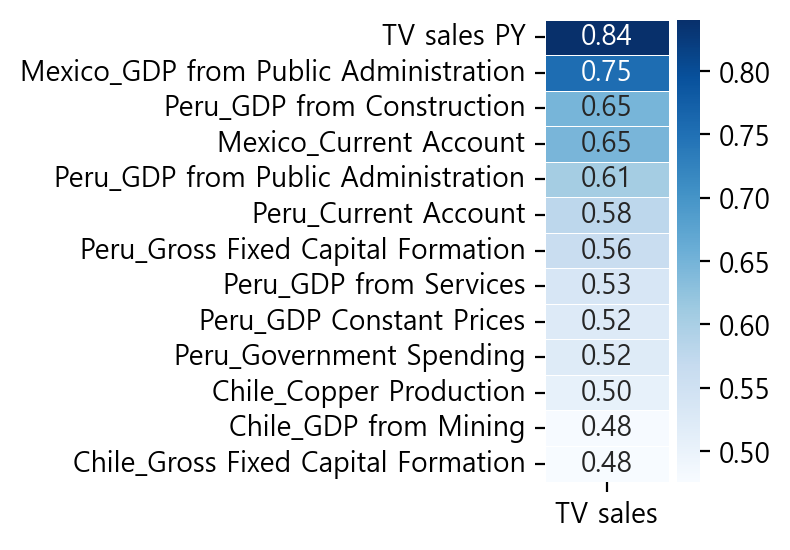

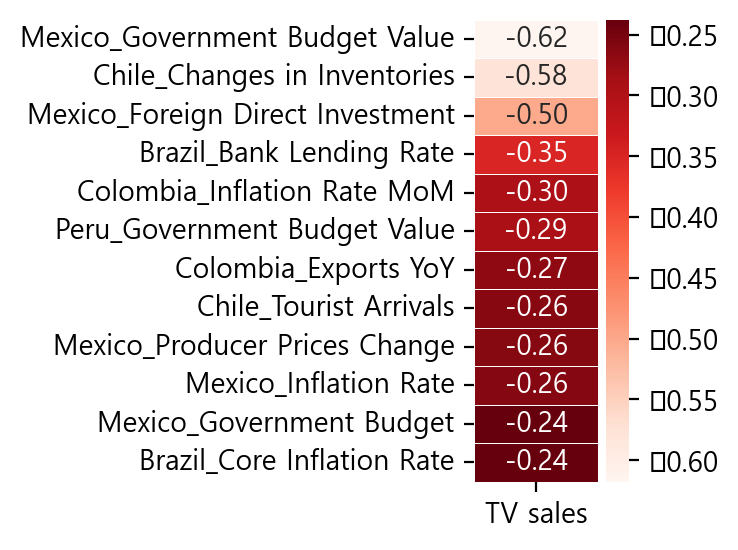

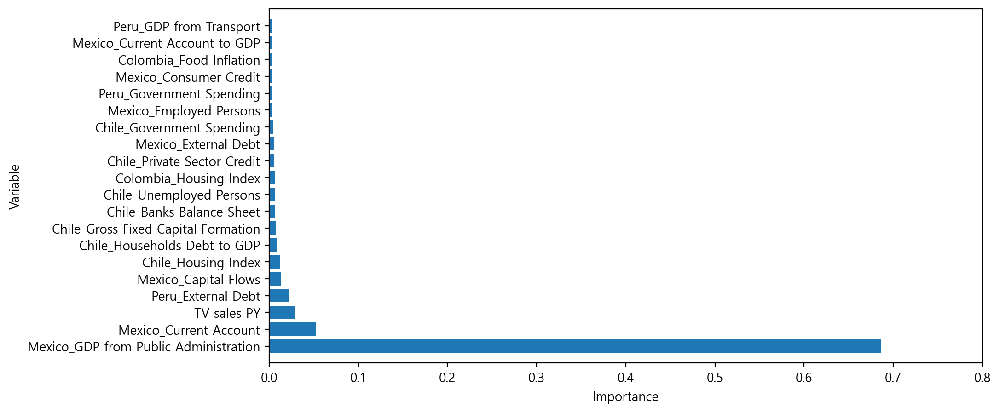

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


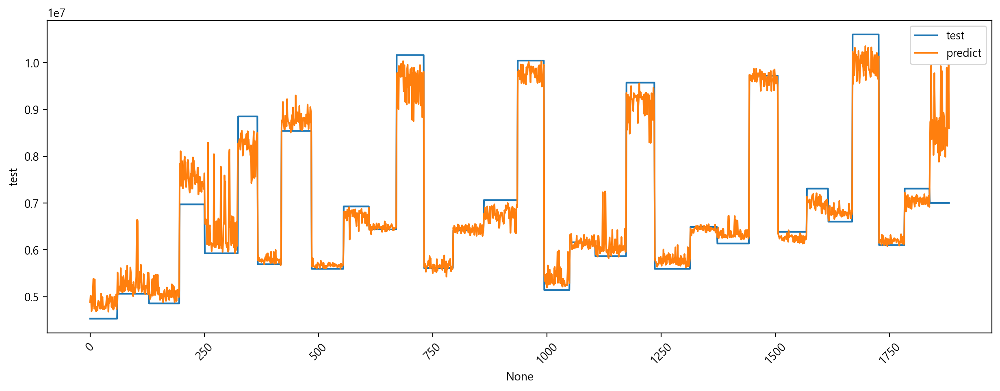

(92, 407)
(20, 2)
20
[2, 4, 11, 30, 39, 41, 107, 122, 132, 180, 194, 212, 264, 281, 284, 297, 310, 359, 362, 405]
max_feature 조정: 1
max_feature 갯수: 13
(92, 20)
랜덤 포레스트 회귀
Train 결정계수: 0.993
Test 결정계수: 0.949


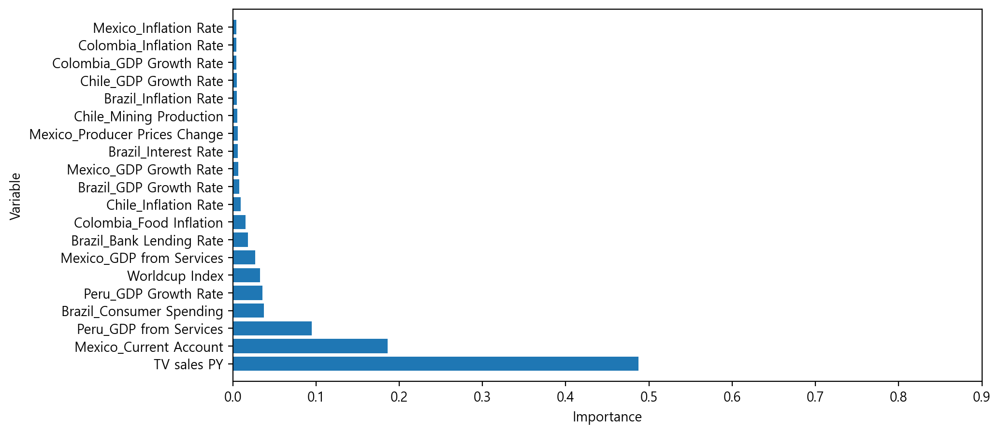

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


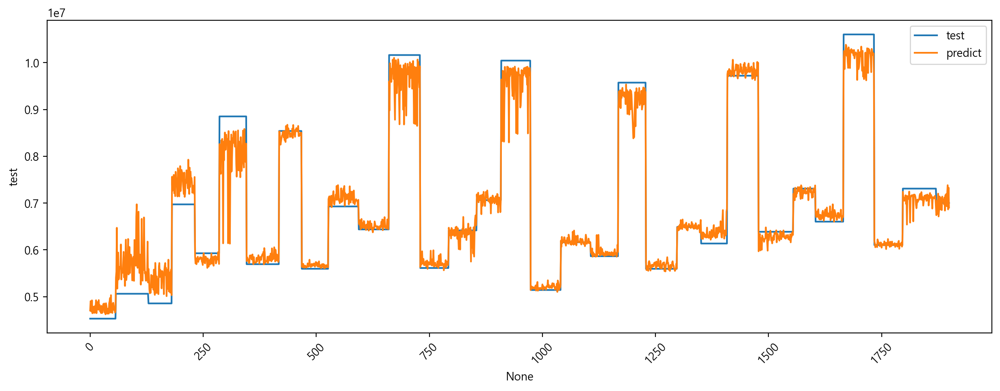

(108, 407)
(20, 2)
20
[2, 4, 11, 30, 39, 41, 107, 122, 132, 180, 194, 212, 264, 281, 284, 297, 310, 359, 362, 405]
(108, 20)
랜덤 포레스트 회귀


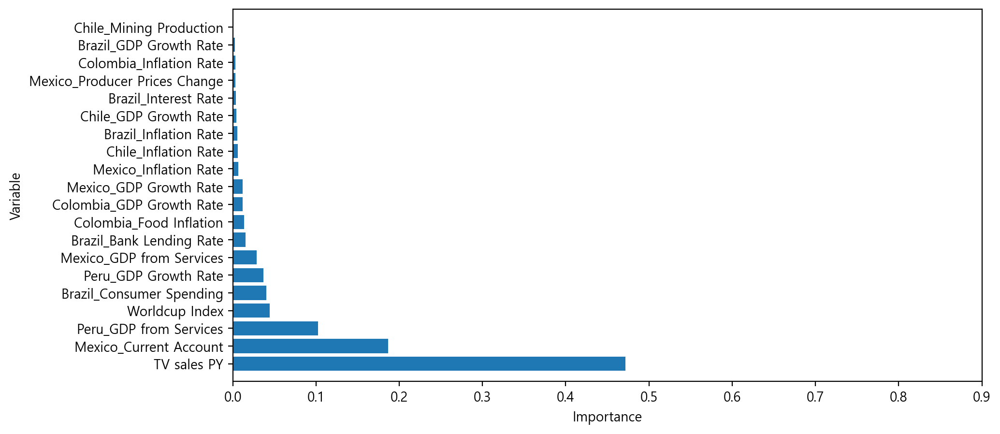

corr: [0.84] / importance: 47.0 %


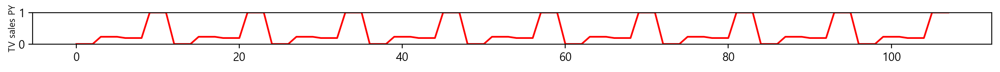

corr: [-0.35] / importance: 2.0 %


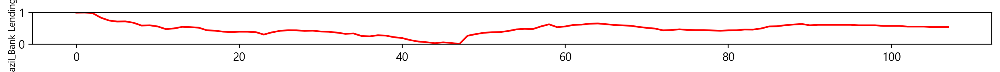

corr: [0.46] / importance: 4.0 %


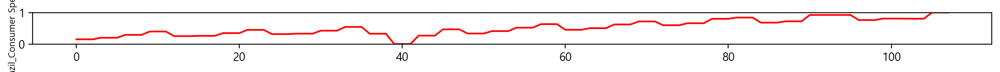

corr: [0.08] / importance: 0.0 %


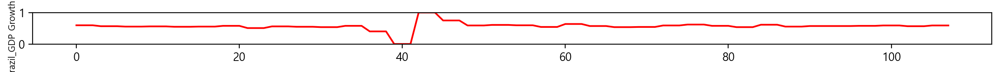

corr: [-0.13] / importance: 1.0 %


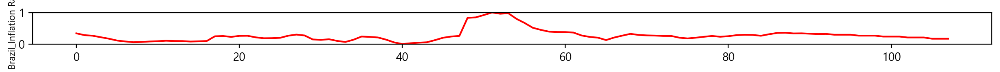

corr: [-0.16] / importance: 0.0 %


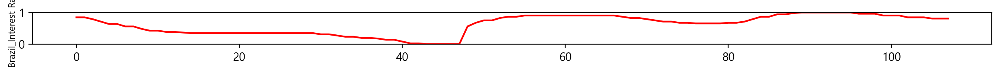

corr: [0.11] / importance: 0.0 %


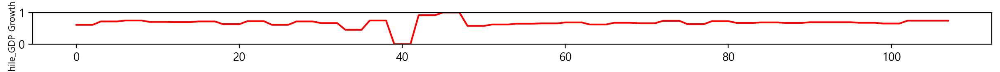

corr: [-0.03] / importance: 1.0 %


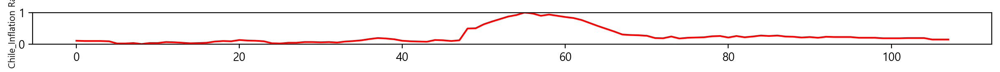

corr: [0.13] / importance: 0.0 %


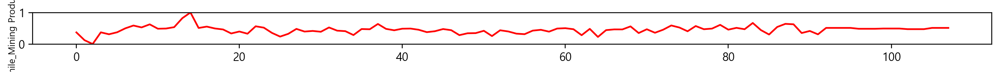

corr: [-0.08] / importance: 1.0 %


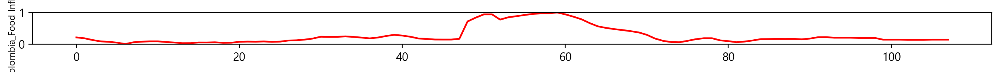

corr: [0.2] / importance: 1.0 %


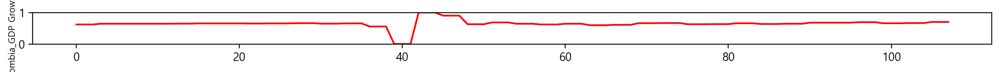

corr: [-0.05] / importance: 0.0 %


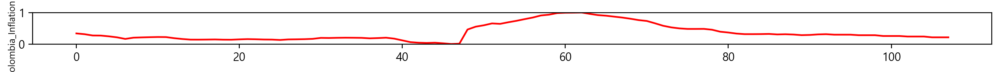

corr: [0.65] / importance: 19.0 %


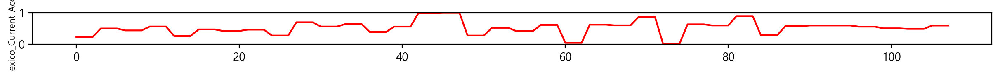

corr: [0.4] / importance: 3.0 %


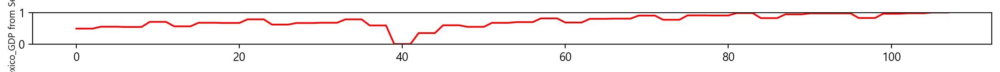

corr: [0.06] / importance: 1.0 %


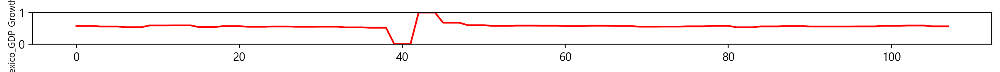

corr: [-0.26] / importance: 1.0 %


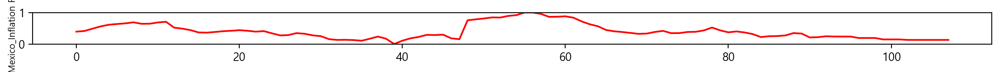

corr: [-0.26] / importance: 0.0 %


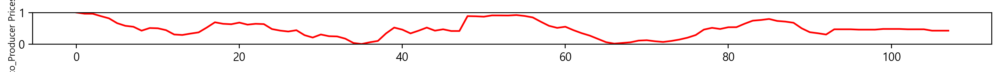

corr: [0.53] / importance: 10.0 %


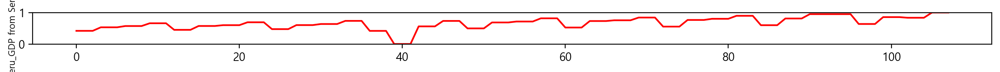

corr: [0.16] / importance: 4.0 %


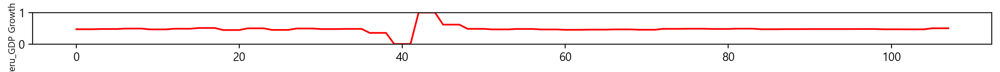

corr: [0.01] / importance: 4.0 %


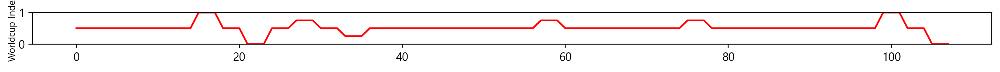

랜덤 포레스트 회귀: 예측 결과


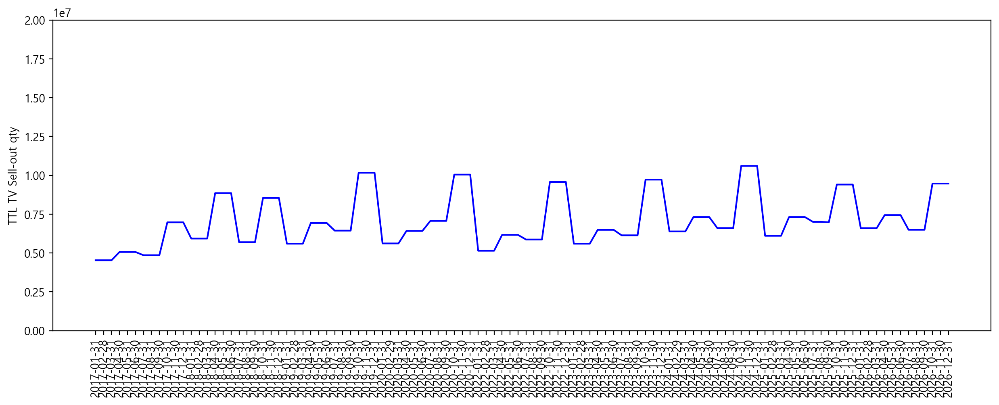

6993894.0 9404254.0 6598618.0 7437245.0 6492314.0 9467233.0


In [29]:
for sub_i in tqdm.tqdm_notebook(range(3,4,1)):
    
##############################################################################################################
### sub_i = EU 2, SCA 3, MEA 4, SEA 5 ###
##############################################################################################################


##### DX Signal 법인만 추출 #####
# dx_signal_sub = [1]
# for sub_i in tqdm.tqdm_notebook(dx_signal_sub):
#################################


    m_rows_init = m_rows_init_org
    m_rows_2_init = m_rows_2_init_org

    file_dir_sub = "D:/05. SCM DX개선/{}/0.ALL/subsidiary_name.csv".format(PG_dir)
    # 법인정보 가져오기 #
    df_subsidiary = pd.DataFrame()
    df_subsidiary = pd.read_csv(file_dir_sub)
    
    exclude_covid_org = exclude_covid
        
    ##### flag 추가 24.09.12 #####
    if df_subsidiary["ml_fcst"][sub_i-1] == "Y":
    
        print("-------")
        print(df_subsidiary.shape)
        df_subsidiary_name = list(df_subsidiary["subsidiary_name"])
        subsidiary_name = df_subsidiary_name[sub_i-1]

        google_trends_yn = df_subsidiary.loc[sub_i-1,"google_trends"]
        if use_google_trends == "Y":
            print("구글트렌드 적용: "+google_trends_yn)

        print("법인명: "+subsidiary_name)

        file_dir = "D:/05. SCM DX개선/{}/{}/Raw/historical_indicator_Q.csv".format(PG_dir, subsidiary_name)
        file_dir2 = "D:/05. SCM DX개선/{}/{}/corr_data.csv".format(PG_dir, subsidiary_name)
        file_dir3 = "D:/05. SCM DX개선/{}/{}/regression_data.csv".format(PG_dir, subsidiary_name)
        file_dir4 = "D:/05. SCM DX개선/{}/{}/regression_pred_data.csv".format(PG_dir, subsidiary_name)
        file_dir5 = "D:/05. SCM DX개선/{}/{}/regression_data_m.csv".format(PG_dir, subsidiary_name)
        file_dir6 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m.csv".format(PG_dir, subsidiary_name)
        file_dir7 = "D:/05. SCM DX개선/{}/{}/regression_data_m_f.csv".format(PG_dir, subsidiary_name)
        file_dir8 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_c.csv".format(PG_dir, subsidiary_name)
        file_dir9 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_fn.csv".format(PG_dir, subsidiary_name)
        file_dir10 = "D:/05. SCM DX개선/{}/{}/Raw/feature_names.csv".format(PG_dir, subsidiary_name)
        file_dir11 = "D:/05. SCM DX개선/{}/{}/regression_data_m_c.csv".format(PG_dir, subsidiary_name)
        file_dir12 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_c_lgbm.csv".format(PG_dir, subsidiary_name)
        file_dir13 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_c_svm.csv".format(PG_dir, subsidiary_name)
        file_dir14 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_lgbm.csv".format(PG_dir, subsidiary_name)
        file_dir15 = "D:/05. SCM DX개선/{}/{}/regression_data_m_c_svm.csv".format(PG_dir, subsidiary_name)
        file_dir16 = "D:/05. SCM DX개선/{}/{}/test_composite.xlsx".format(PG_dir, subsidiary_name)
        file_dir17 = "D:/05. SCM DX개선/{}/{}/regression_data_m_woc.csv".format(PG_dir, subsidiary_name)
        file_dir18 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_woc.csv".format(PG_dir, subsidiary_name)
        file_dir19 = "D:/05. SCM DX개선/{}/{}/corr_data_wo_covid.csv".format(PG_dir, subsidiary_name)
        file_dir20 = "D:/05. SCM DX개선/{}/{}/test.csv".format(PG_dir, subsidiary_name)
        file_dir21 = "D:/05. SCM DX개선/{}/{}/test_composite_Q.csv".format(PG_dir, subsidiary_name)
        file_dir22 = "D:/05. SCM DX개선/{}/{}/regression_data_woc.csv".format(PG_dir, subsidiary_name)
        file_dir23 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_woc.csv".format(PG_dir, subsidiary_name)
        file_dir24 = "D:/05. SCM DX개선/{}/{}/regression_data_m_f_woc.csv".format(PG_dir, subsidiary_name)
        file_dir25 = "D:/05. SCM DX개선/{}/{}/regression_data_m_lgbm.csv".format(PG_dir, subsidiary_name)


        df = pd.read_csv(file_dir)

        covid_start = 0
        covid_end = 0
        covid_range = 0


        if exclude_covid == "Y":
            covid_start = df[df["COVID_YN"]==1].index[0:].min()   # COVID 시작
            covid_end = df[df["COVID_YN"]==1].index[0:].max()+1   # COVID 끝

        # if subsidiary_name == "10.SP" or subsidiary_name == "16.CL": # 브라질 2016년 부터
        #     covid_start = covid_start + 12 
        #     covid_end = covid_end + 12

        covid_range = covid_end - covid_start
        exclude_covid_org = exclude_covid

        if np.isnan(covid_range):
            exclude_covid = "N" # Pent-up 수요기간 없을 경우


        # 23.04.12 제외 
        # if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
        #     df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
        #     df = df.reset_index(drop=True)

        print(df.shape)
        print("COVID 구간 제외 여부: ",exclude_covid)
        print("COVID 구간 : ",covid_range)
        df_org = df.copy()


        # 23.4.12 추가
        if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
            m_rows_init = m_rows_init + 12         # 2020.01
            m_rows_2_init = m_rows_2_init + 12     # 2020.12

        m_rows = m_rows_init    
        m_rows_2 = m_rows_2_init  


        ### m_rows 추가 조정 ###
        if exclude_covid == "Y" :
            m_rows = m_rows-covid_range
            m_rows_2 = m_rows_2-covid_range

        # 23.4.12 제외
        # if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
        #     m_rows = m_rows + 12         # 2020.01
        #     m_rows_2 = m_rows_2 + 12     # 2020.12
        ### m_rows 추가 조정 ###


        t_size = m_rows_2-m_rows     # 예측기간
        q_loc = 0      # Q+1 시작점


        org_feature_no = df.shape[1]-2 # Features
        max_feature_adj = 0 # max_feature 조정시 1 / 아닐경우 0
        max_feature_no = 0 

        # if subsidiary_name == "07.PL" or subsidiary_name == "09.MS": # Seasonality 종속성 완화
        #     max_feature_adj = 1
        #     max_feature_no = 7

        # if subsidiary_name == "01.CI" or subsidiary_name == "14.IL" or subsidiary_name == "06.IS": # Seasonality 종속성 완화
        #     max_feature_adj = 1
        #     max_feature_no = 8

        # if subsidiary_name == "02.US": # Seasonality 종속성 완화
        #     max_feature_adj = 1
        #     max_feature_no = 8

        # if subsidiary_name == "08.UK": # Seasonality 종속성 완화
        #     max_feature_adj = 1
        #     max_feature_no = 12

        max_feature_adj = df_subsidiary["dependency"][sub_i-1]
        max_feature_no = df_subsidiary["max_no"][sub_i-1]
        mov_no = df_subsidiary["mov"][sub_i-1]

        print("max_feature 조정값:(No=0/Yes=1)", max_feature_adj)
        print("max_feature 갯수:", max_feature_no)
        print("feature 범위: 0 ~ -", mov_no,"개월")


        # M0 ~ M+6 TV sales와 인자별 상관계수 분석
        # 상관분석 M+1

        # for mov in range (1,7,1):    # 6개월 선행관계 확인
        for mov in range (0,7,1):    # 6개월 선행관계 확인

            df_TV_sales = pd.DataFrame()
            df_features = pd.DataFrame()
            df_features_mov = pd.DataFrame()

            df_TV_sales = df_org.iloc[covid:m_rows_init,:3]

            df_TV_sales = df_TV_sales.reset_index(drop=True)

            # 24.01.29 변경 mov=0 추가
            if mov == 0:
                ######
                df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+1]
                df = pd.concat([df_TV_sales, df_features], axis=1)
                ######
            else:

                # 23.4.12 변경
                df_features = df_org.iloc[covid:covid+1,3:org_feature_no+1]
                for item in range (1, mov, 1):
                    # df_features = df_features.append(df_org.iloc[covid:covid+1,3:org_feature_no+1], ignore_index=True)
                     df_features = pd.concat([df_features, df_org.iloc[covid:covid+1,3:org_feature_no+1]], ignore_index=True)
                # 변경 완료

                # df_features = df_features.append(df_org.iloc[covid:m_rows_init-mov,3:org_feature_no+2], ignore_index=True)
                df_features = pd.concat([df_features,df_org.iloc[covid:m_rows_init-mov,3:org_feature_no+2]], ignore_index=True)

                df = pd.concat([df_TV_sales, df_features], axis=1)

            # 23.4.12 추가
            if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
                df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
                df = df.reset_index(drop=True)

        #     if mov == 1:
            if mov == 0:
                print(df.shape)

            df_cor = df.drop(columns=['ds']).corr()
            num = df_cor._get_numeric_data()
            num[num < 0] = num*-1

            corr_data_pros = pd.DataFrame()
            corr_data_cons = pd.DataFrame()
            corr_data_pros = df.drop(columns=['ds']).corr().iloc[:,[0]]
            corr_data_cons = df.drop(columns=['ds']).corr().iloc[:,[0]]
            corr_data_pros = corr_data_pros.sort_values(by=prod_type, ascending=False)
            corr_data_cons = corr_data_cons.sort_values(by=prod_type, ascending=True)

            corr_data_pros["mov"] = mov

            if exclude_covid == "Y" :
                if not os.path.exists(file_dir19):
                    corr_data_pros.to_csv(file_dir19, index=True, mode='w', encoding='utf-8-sig')
                else:
        #             if mov==1:
                    if mov==0:
                        corr_data_pros.to_csv(file_dir19, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        corr_data_pros.to_csv(file_dir19, index=True, mode='a', encoding='utf-8-sig', header=False)
            else:            
                # .to_csv 
                # 최초 생성 이후 mode는 append
                if not os.path.exists(file_dir2):
                    corr_data_pros.to_csv(file_dir2, index=True, mode='w', encoding='utf-8-sig')
                else:
        #             if mov==1:
                    if mov==0:
                        corr_data_pros.to_csv(file_dir2, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        corr_data_pros.to_csv(file_dir2, index=True, mode='a', encoding='utf-8-sig', header=False)


        # TV sales vs 지표별 상관계수

        # 파일 열기
        df = pd.read_csv(file_dir)

        df_TV_sales = pd.DataFrame()
        df_features = pd.DataFrame()
        df_features_mov = pd.DataFrame()

        df_TV_sales = df.iloc[covid:m_rows_init,:3]

        df_TV_sales = df_TV_sales.reset_index(drop=True)


        # 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
        df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+2]
        df = pd.concat([df_TV_sales, df_features], axis=1)


        # 23.4.12 변경
        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        # 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
        # for item in range (2, mov_no+1, 1):

        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        for item in range (1, mov_no+1, 1):
            if item == 1:
                df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
                # df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
                df_features_mov = pd.concat([df_features_mov, df.iloc[covid:m_rows_init-1,3:org_feature_no+2]], ignore_index=True)
                df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')

            else:
                df_features_mov = df.iloc[covid:m_rows_init,3:org_feature_no+2].shift(item-1)
                df_features_mov = df_features_mov.fillna(method='bfill')

            new_cols = []
            for col in df_features_mov.columns:
                new_col = str(col + "_" + str(item))
                new_cols.append(new_col)

            df_features_mov.columns = new_cols

            df = pd.concat([df, df_features_mov], axis=1)
        #변경 완료


        # 23.4.12 추가
        if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
            df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
            df = df.reset_index(drop=True)

        print(df.shape)  


        df_cor = df.drop(columns=['ds']).corr()
        num = df_cor._get_numeric_data()
        num[num < 0] = num*-1

        corr_data = pd.DataFrame()
        corr_data_pros = pd.DataFrame()
        corr_data_cons = pd.DataFrame()
        corr_data = df.drop(columns=['ds']).corr().iloc[:,[0]]
        corr_data_pros = df.drop(columns=['ds']).corr().iloc[:,[0]]
        corr_data_cons = df.drop(columns=['ds']).corr().iloc[:,[0]]
        corr_data_pros = corr_data_pros.sort_values(by=prod_type, ascending=False)
        corr_data_cons = corr_data_cons.sort_values(by=prod_type, ascending=True)

        plt.figure(figsize=(1,3))
        sns.heatmap(data = corr_data_pros.iloc[1:14,[0]], annot=True, 
        fmt = '.2f', linewidths=.3, cmap='Blues')
        plt.figure(figsize=(1,3))
        sns.heatmap(data = corr_data_cons.iloc[:12,[0]], annot=True, 
        fmt = '.2f', linewidths=.3, cmap='Reds')

        corr_data_pros_index1 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[1:3].tolist() + corr_data_pros.index[4:5].tolist() + corr_data_pros.index[6:9].tolist()
        corr_data_pros_index2 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[8:14].tolist()
        corr_data_pros_index3 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[14:20].tolist()
        corr_data_cons_index1 = corr_data_pros.index[0:1].tolist() + corr_data_cons.index[0:6].tolist()
        corr_data_cons_index2 = corr_data_pros.index[0:1].tolist() + corr_data_cons.index[6:12].tolist()
        print(corr_data_pros_index1)
        print(corr_data_cons_index1)

        ### 그래프 최대값 ###
        max_sales = (max(df[prod_type]) // 10**(len(str(int(max(df[prod_type])))) - 1) + 1) * 10**(len(str(int(max(df[prod_type])))) - 1)

        #########################################################
        ######## ----- 여기까지 필수로 실행할 것 ----- ##########
        #########################################################

        # 랜덤포레스트를 통한 중요도 분석

        # 파일 열기
        df = pd.read_csv(file_dir)

        df_TV_sales = pd.DataFrame()
        df_features = pd.DataFrame()
        df_features_mov = pd.DataFrame()

        df_TV_sales = df.iloc[covid:m_rows_init,:3]

        df_TV_sales = df_TV_sales.reset_index(drop=True)


        # 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
        df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+2]
        df = pd.concat([df_TV_sales, df_features], axis=1)


        # 23.4.12 변경
        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        # 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
        # for item in range (2, mov_no+1, 1):

        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        for item in range (1, mov_no+1, 1):
            if item == 1:
                df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
                # df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
                df_features_mov = pd.concat([df_features_mov, df.iloc[covid:m_rows_init-1,3:org_feature_no+2]], ignore_index=True)
                df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')

            else:
                df_features_mov = df.iloc[covid:m_rows_init,3:org_feature_no+2].shift(item-1)
                df_features_mov = df_features_mov.fillna(method='bfill')

            new_cols = []
            for col in df_features_mov.columns:
                new_col = str(col + "_" + str(item))
                new_cols.append(new_col)

            df_features_mov.columns = new_cols

            df = pd.concat([df, df_features_mov], axis=1)
        #변경 완료


        # 23.4.12 추가
        if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
            df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
            df = df.reset_index(drop=True)

        print(df.shape)


        # 23.7.5 feature 수 다시 계산함
        feature_no = df.shape[1]-2 # Features
        df_feature_names = df.columns[2:feature_no+2] 
        df_feature_names = list(df_feature_names)

        df_data = np.array(df.iloc[:,2:feature_no+2]) 
        df_target = np.array(df[prod_type])



        rfc_train_score = 0
        rfc_test_score = 0

        ### 100회 실시 ###
        for num in range (1,100,1):

            X_train, X_test, y_train, y_test = train_test_split(df_data, df_target,test_size=0.2)

            # 랜덤 포레스트를 사용한 경우의 중요 특성
            rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
            rfc.fit(X_train, y_train)        

            y_pred = rfc.predict(X_test)
            df2 = pd.DataFrame()
            df2["test"]= pd.Series(y_test)
            df2["predict"] = pd.Series(y_pred)

            # 23.5.11 머신러닝 train test prediction 분석 데이터에 연/월/일 추가하기
            df2.insert(0, 'ds', df2['test'].map(df.set_index(prod_type)['ds'].groupby(level=0).first()))

            #df_importance = pd.DataFrame({'feature':df_feature_names,'importance':rfc.feature_importances_ })
            df_importance = pd.DataFrame({'feature':df_feature_names,'importance':rfc.feature_importances_, 
                                          'corr':np.array(corr_data.iloc[:,[0]].loc[df_feature_names].round(2)[prod_type])})
            df_importance = df_importance.sort_values('importance', ascending=False)

            df_importance.index.name = "index_s"
            df_importance["train accuracy"] = round(rfc.score(X_train, y_train),3)
            df_importance["test accuracy"] = round(rfc.score(X_test, y_test),3)
            df_importance["num"] = num

            rfc_train_score = rfc_train_score + round(rfc.score(X_train, y_train),3)
            rfc_test_score = rfc_test_score + round(rfc.score(X_test, y_test),3)


            if exclude_covid == "N": # COVID 제외 로직 추가           
                # .to_csv 
                # 최초 생성 이후 mode는 append
                if not os.path.exists(file_dir3):
                    df_importance.to_csv(file_dir3, index=True, mode='w', encoding='utf-8-sig')
                else:
                    if num==1:
                        df_importance.to_csv(file_dir3, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        df_importance.to_csv(file_dir3, index=True, mode='a', encoding='utf-8-sig', header=False)

                if not os.path.exists(file_dir4):
                    df2.to_csv(file_dir4, index=True, mode='w', encoding='utf-8-sig')
                else:
                    if num==1:
                        df2.to_csv(file_dir4, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        df2.to_csv(file_dir4, index=True, mode='a', encoding='utf-8-sig', header=False)

            else:                    
                # .to_csv 
                # 최초 생성 이후 mode는 append
                if not os.path.exists(file_dir22):
                    df_importance.to_csv(file_dir22, index=True, mode='w', encoding='utf-8-sig')
                else:
                    if num==1:
                        df_importance.to_csv(file_dir22, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        df_importance.to_csv(file_dir22, index=True, mode='a', encoding='utf-8-sig', header=False)

                if not os.path.exists(file_dir23):
                    df2.to_csv(file_dir23, index=True, mode='w', encoding='utf-8-sig')
                else:
                    if num==1:
                        df2.to_csv(file_dir23, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        df2.to_csv(file_dir23, index=True, mode='a', encoding='utf-8-sig', header=False)


        x = df_importance.feature
        y = df_importance.importance
        ypos = np.arange(len(x)-1)

        print("랜덤 포레스트 회귀")
        print("Train 결정계수:", round((rfc_train_score/num),3))
        print("Test 결정계수:", round((rfc_test_score/num),3))
        plt.figure(figsize=(10,5))
        plt.barh(x.iloc[:20], y.iloc[:20])
        plt.yticks(ypos[:20], x.iloc[:20])
        plt.xlabel('Importance')
        plt.ylabel('Variable')
        plt.xlim(0, 0.8)
        plt.ylim(-1, 20)
        plt.show()



        print("TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과")

        df_pred = pd.DataFrame()

        if exclude_covid == "N": # COVID 제외 로직 추가           
            df_pred = pd.read_csv(file_dir4, index_col=0)
            df_pred = df_pred.sort_values(by='ds')
            df_pred.reset_index(drop=True, inplace=True)
            fig = plt.figure(figsize=(15, 5))
            sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
            sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
            plt.xticks(rotation=45)
            plt.show()

        else:                    
            df_pred = pd.read_csv(file_dir23, index_col=0)
            df_pred = df_pred.sort_values(by='ds')
            df_pred.reset_index(drop=True, inplace=True)
            fig = plt.figure(figsize=(15, 5))
            sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
            sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
            plt.xticks(rotation=45)
            plt.show()


        # [학습] 선행지표 기준 머신러닝 학습
        # 파일 열기
        df = pd.read_csv(file_dir)

        df_TV_sales = pd.DataFrame()
        df_features = pd.DataFrame()
        df_features_mov = pd.DataFrame()

        df_TV_sales = df.iloc[covid:m_rows_init,:3]

        df_TV_sales = df_TV_sales.reset_index(drop=True)


        # 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
        df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+2]
        df = pd.concat([df_TV_sales, df_features], axis=1)


        # 23.4.12 변경
        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        # 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
        # for item in range (2, mov_no+1, 1):

        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        for item in range (1, mov_no+1, 1):
            if item == 1:
                df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
                # df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
                df_features_mov = pd.concat([df_features_mov, df.iloc[covid:m_rows_init-1,3:org_feature_no+2]], ignore_index=True)
                df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')

            else:
                df_features_mov = df.iloc[covid:m_rows_init,3:org_feature_no+2].shift(item-1)
                df_features_mov = df_features_mov.fillna(method='bfill')

            new_cols = []
            for col in df_features_mov.columns:
                new_col = str(col + "_" + str(item))
                new_cols.append(new_col)

            df_features_mov.columns = new_cols

            df = pd.concat([df, df_features_mov], axis=1)
        #변경 완료



        # 23.4.12 추가
        if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
            df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
            df = df.reset_index(drop=True)

        print(df.shape)


        ###################################################
        ### 법인별 선행지표 파일 입력으로 변경 21.11.30 ###
        ###################################################
        df_features = pd.read_csv(file_dir10)

        if use_google_trends == "N":
            df_features = df_features[df_features["feature_names"]!=gt_key]

        print(df_features.shape)
        df_feature_index = list(df_features["index_s"])
        df_feature_names = list(df_features["feature_names"])

        df_feature_names

        m_feature = len(df_feature_names)
        print(m_feature)
        print(df_feature_index)

        # # feature 수 조정 테스트 #
        print("max_feature 조정:", max_feature_adj)
        print("max_feature 갯수:", max_feature_no)


        ############################################
        ### df_data 파일 입력으로 변경 21.11.30  ###
        ############################################
        df_data = np.array(df.iloc[:,2:3])

        for n in range(1,m_feature,1):

            df_data = np.concatenate((df_data, np.array(df.iloc[:,df_feature_index[n]:df_feature_index[n]+1])), axis=1)

        print(df_data.shape)
        df_target = np.array(df[prod_type])

        rfc_train_score = 0
        rfc_test_score = 0
        rfc_test_adj_score = 0
        svm_train_score = 0
        svm_test_score = 0

        ### 100회 실시 ###
        for num in range (1,101,1):

            #X_train, X_test, y_train, y_test = train_test_split(df_data, df_target, shuffle=False, test_size=t_size)
            X_train, X_test, y_train, y_test = train_test_split(df_data, df_target,test_size=0.2)

            # 랜덤 포레스트를 사용한 경우의 중요 특성
            if max_feature_adj == 0 :
                rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
            elif max_feature_adj == 1 :
                ### TV sales PY 중요도 80% 초과시 민감도 위한 max_feature 수 조정
                rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200,max_features=max_feature_no)

            rfc.fit(X_train, y_train)

            y_pred = rfc.predict(X_test)
            df2 = pd.DataFrame()
            df2["test"]= pd.Series(y_test)
            df2["predict"] = pd.Series(y_pred)
            df2["num"] = num
            df2["accuracy"] = 1 - (abs(y_test-y_pred)/y_test)

            # 23.5.11 머신러닝 train test prediction 분석 데이터에 연/월/일 추가하기
            df2.insert(0, 'ds', df2['test'].map(df.set_index(prod_type)['ds'].groupby(level=0).first()))

            df_importance = pd.DataFrame({'feature':df_feature_names,'importance':rfc.feature_importances_, 
                                          'corr':np.array(corr_data.iloc[:,[0]].loc[df_feature_names].round(2)[prod_type])})
            df_importance = df_importance.sort_values('importance', ascending=False)

            df_importance.index.name = "index_s"    

            df_importance["train accuracy"] = round(rfc.score(X_train, y_train),3)
            df_importance["test accuracy"] = round(rfc.score(X_test, y_test),3)

            ### 수정 결정계수 분석을 위해 추가 21.12.13
            X_train2 = sm.add_constant(X_train)
            model2 = sm.OLS(y_train, X_train2)
            result = model2.fit()
            df_importance["test ols accuracy"] = round(result.rsquared,3)
            df_importance["test adj accuracy"] = round(result.rsquared_adj,3)

            df_importance["num"] = num    

            rfc_train_score = rfc_train_score + round(rfc.score(X_train, y_train),3)
            rfc_test_score = rfc_test_score + round(rfc.score(X_test, y_test),3)
            rfc_test_adj_score = rfc_test_adj_score + round(result.rsquared_adj,3)


            ### 구글트렌드 사용시에만 저장 24.06.12 ###
            if use_google_trends == "Y":

                if exclude_covid == "N": # COVID 제외 로직 추가
                    # .to_csv 
                    # 최초 생성 이후 mode는 append
                    if not os.path.exists(file_dir5):
                        df_importance.to_csv(file_dir5, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        if num==1: 
                            df_importance.to_csv(file_dir5, index=True, mode='w', encoding='utf-8-sig')
                        else:
                            df_importance.to_csv(file_dir5, index=True, mode='a', encoding='utf-8-sig', header=False)

                    if not os.path.exists(file_dir6):
                        df2.to_csv(file_dir6, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        if num==1: 
                            df2.to_csv(file_dir6, index=True, mode='w', encoding='utf-8-sig')
                        else:
                            df2.to_csv(file_dir6, index=True, mode='a', encoding='utf-8-sig', header=False)

                else:
                    # .to_csv 
                    # 최초 생성 이후 mode는 append
                    if not os.path.exists(file_dir17):
                        df_importance.to_csv(file_dir17, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        if num==1: 
                            df_importance.to_csv(file_dir17, index=True, mode='w', encoding='utf-8-sig')
                        else:
                            df_importance.to_csv(file_dir17, index=True, mode='a', encoding='utf-8-sig', header=False)

                    if not os.path.exists(file_dir18):
                        df2.to_csv(file_dir18, index=True, mode='w', encoding='utf-8-sig')
                    else:
                        if num==1: 
                            df2.to_csv(file_dir18, index=True, mode='w', encoding='utf-8-sig')
                        else:
                            df2.to_csv(file_dir18, index=True, mode='a', encoding='utf-8-sig', header=False)   



        x = df_importance.feature
        y = df_importance.importance
        ypos = np.arange(len(x))

        print("랜덤 포레스트 회귀")
        print("Train 결정계수:", round((rfc_train_score/num),3))
        print("Test 결정계수:", round((rfc_test_score/num),3))
        plt.figure(figsize=(10,5))
        plt.barh(x.iloc[0:], y.iloc[0:])
        plt.yticks(ypos, x.iloc[0:])
        plt.xlabel('Importance')
        plt.ylabel('Variable')
        plt.xlim(0, 0.9)
        plt.ylim(-1, len(x))
        plt.show()


        print("TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과")


        if exclude_covid == "N": # COVID 제외 로직 추가           
            df_pred = pd.read_csv(file_dir6, index_col=0)
            df_pred = df_pred.sort_values(by='ds')
            df_pred.reset_index(drop=True, inplace=True)
            fig = plt.figure(figsize=(15, 5))
            sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
            sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
            plt.xticks(rotation=45)
            plt.show()

        else:                    
            df_pred = pd.read_csv(file_dir18, index_col=0)
            df_pred = df_pred.sort_values(by='ds')
            df_pred.reset_index(drop=True, inplace=True)
            fig = plt.figure(figsize=(15, 5))
            sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
            sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
            plt.xticks(rotation=45)
            plt.show()



        # [예측] 선행지표 기준 Q+1~Q+2 예측

        # 파일 열기
        df = pd.read_csv(file_dir)

        df_TV_sales = pd.DataFrame()
        df_features = pd.DataFrame()
        df_features_mov = pd.DataFrame()

        df_TV_sales = df.iloc[covid:m_rows_2_init,:3]

        df_TV_sales = df_TV_sales.reset_index(drop=True)


        # 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
        df_features = df_org.iloc[covid:m_rows_2_init,3:org_feature_no+2]
        df = pd.concat([df_TV_sales, df_features], axis=1)


        # 23.4.12 변경
        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        # 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
        # for item in range (2, mov_no+1, 1):

        # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

        # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        # df = pd.concat([df_TV_sales, df_features], axis=1)

        for item in range (1, mov_no+1, 1):
            if item == 1:
                df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
                # df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_2_init-1,3:org_feature_no+2], ignore_index=True)
                df_features_mov = pd.concat([df_features_mov, df.iloc[covid:m_rows_2_init-1,3:org_feature_no+2]], ignore_index=True)
                df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')

            else:
                df_features_mov = df.iloc[covid:m_rows_2_init,3:org_feature_no+2].shift(item-1)
                df_features_mov = df_features_mov.fillna(method='bfill')

            new_cols = []
            for col in df_features_mov.columns:
                new_col = str(col + "_" + str(item))
                new_cols.append(new_col)

            df_features_mov.columns = new_cols

            df = pd.concat([df, df_features_mov], axis=1)
        #변경 완료


        # 23.4.12 추가
        if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
            df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
            df = df.reset_index(drop=True)

        print(df.shape)


        ###################################################
        ### 법인별 선행지표 파일 입력으로 변경 21.11.30 ###
        ###################################################
        df_features = pd.read_csv(file_dir10)

        if use_google_trends == "N":
            df_features = df_features[df_features["feature_names"]!=gt_key]
        print(df_features.shape)
        df_feature_index = list(df_features["index_s"])
        df_feature_names = list(df_features["feature_names"])

        df_feature_names

        m_feature = len(df_feature_names)
        print(m_feature)
        print(df_feature_index)

        ############################################
        ### df_data 파일 입력으로 변경 21.11.30  ###
        ############################################
        df_data = np.array(df.iloc[:,2:3])

        for n in range(1,m_feature,1):

            df_data = np.concatenate((df_data, np.array(df.iloc[:,df_feature_index[n]:df_feature_index[n]+1])), axis=1)

        print(df_data.shape)
        df_target = np.array(df[prod_type])

        #df_norm_feature_names = list(df.columns[1:2]) + list(df_feature_names)  
        df_norm_feature_names = list(df_feature_names)  
        df_norm_data = df_data

        df_norm = pd.DataFrame()
        scaler = MinMaxScaler()
        df_norm = pd.DataFrame(scaler.fit_transform(df_norm_data), columns=df_norm_feature_names)
        df_norm.insert(0, prod_type, df[prod_type])
        df_norm.insert(0, 'ds', df["ds"])
        #df_data_trans = np.array(df_norm.iloc[:,2:])

        ##############################
        ### 스케일링값 저장        ###
        ##############################
        ### 구글트렌드 사용시에만 저장 24.06.12 ###
        if use_google_trends == "Y":
            if exclude_covid == "N": # COVID 제외 로직 추가
                df_norm.to_csv(file_dir20, index=True, mode='w', encoding='utf-8-sig')

        #X_train, X_test, y_train, y_test = train_test_split(df_data_trans, df_target, shuffle=False, test_size=t_size)
        X_train, X_test, y_train, y_test = train_test_split(df_data, df_target, shuffle=False, test_size=t_size)
        #X_train, X_test, y_train, y_test = train_test_split(df_data, df_target,test_size=t_size)

        df_importance = pd.DataFrame()

        # 랜덤 포레스트를 사용한 경우의 중요 특성
        # 랜덤 포레스트를 사용한 경우의 중요 특성
        if max_feature_adj == 0 :
            rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
        elif max_feature_adj == 1 :
            ### TV sales PY 중요도 80% 초과시 민감도 위한 max_feature 수 조정
            rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200,max_features=max_feature_no)

        rfc.fit(X_train, y_train)

        df_importance = pd.DataFrame({'feature':df_feature_names,'importance':rfc.feature_importances_, 
                                      'corr':np.array(corr_data.iloc[:,[0]].loc[df_feature_names].round(2)[prod_type])})


        ### 구글트렌드 사용시에만 저장 24.06.12 ###
        if use_google_trends == "Y":

            if exclude_covid == "N":
                df_importance.to_csv(file_dir7, index=True, mode='w', encoding='utf-8-sig')
            # 23.4.27 COVID 기간 제외기준 추가
            else:
                df_importance.to_csv(file_dir24, index=True, mode='w', encoding='utf-8-sig')

        df_importance = df_importance.sort_values('importance', ascending=False)

        x = df_importance.feature
        y = df_importance.importance
        ypos = np.arange(len(x))



        print("랜덤 포레스트 회귀")
    #     print("Train 결정계수:", rfc.score(X_train, y_train).round(3))
        plt.figure(figsize=(10,5))
        plt.barh(x.iloc[0:], y.iloc[0:])
        plt.yticks(ypos, x.iloc[0:])
        plt.xlabel('Importance')
        plt.ylabel('Variable')
        plt.xlim(0, 0.9)
        plt.ylim(-1, len(x))
        plt.show()

        y_pred = rfc.predict(X_test)
        y_train_pred = np.concatenate((y_train, y_pred))

        for n in range(1,m_feature+1,1):

            tv_sales = np.array(df_norm.iloc[:,1:2])
            x_feature = np.array(df_norm.iloc[:,n+1:n+2])
            x_feature_name = df_norm.columns[n+1:n+2]
            # print("정확도:", rfc.score(tv_sales, x_feature))
            #print(x_feature_name)
            #print("R2 Score:",r2_score(tv_sales, x_feature).round(3))
            plt.figure(figsize=(15, 0.5))
        #     plt.plot(y_train_pred/(2*10**7), c='b')
            plt.plot(x_feature, c='r')
            plt.ylim((0,1))
            plt.ylabel(x_feature_name[0], labelpad=1, fontdict={'size': 8})
            values = range(len(df["ds"]))
            #plt.xticks(values,df["ds"], rotation='vertical')
            print("corr:", corr_data_pros.xs(x_feature_name[0]).values.round(2), "/ importance:", df_importance["importance"].loc[n-1].round(2)*100,"%")
            plt.show()   

        print("랜덤 포레스트 회귀: 예측 결과")

        plt.figure(figsize=(15, 5))
        plt.plot(y_train_pred, c='b')
        plt.ylabel("TTL TV Sell-out qty")
        plt.ylim((0,max_sales))
        values = range(len(df["ds"]))
        plt.xticks(values,df["ds"], rotation='vertical')
        plt.show()

    #     # 미국 coverage 변경 반영
    #     if subsidiary_name == "02.US":
    #         y_pred = y_pred * 0.918

        y_pred

        if pred_iloc == 0:
            ### 23.01.26 추가 - 시점에 따라 iloc 변경 ###
            # Gfk데이터가 분기마감되었을 때
            y_pred_2 = y_pred 
        else:    
            # Gfk데이터가 분기마감+1개월일 때
            y_pred_2 = np.append(np.array(df.iloc[m_rows-pred_iloc:m_rows,1:2]), y_pred)
            # Gfk데이터가 분기마감+2개월일 때
    #     elif pred_iloc == 2:   
    #         y_pred_2 = np.append(np.array(df.iloc[m_rows-pred_iloc+1:m_rows,1:2]), y_pred)

        y_pred_2

        ### 21.11.30 추가 - 시점에 따라 iloc 변경 ###
        ### 24.01.26 추가 - Q+4 (현재기준 Q+3)로 예측구간 확대
        ### 24.10.07 추가 - Q+5 로 예측구간 확대
        y_pred_q1 = y_pred_2[q_loc:q_loc+3].mean().round(0)
        y_pred_q2 = y_pred_2[q_loc+3:q_loc+6].mean().round(0)
        y_pred_q3 = y_pred_2[q_loc+6:q_loc+9].mean().round(0)
        y_pred_q4 = y_pred_2[q_loc+9:q_loc+12].mean().round(0)
        y_pred_q5 = y_pred_2[q_loc+12:q_loc+15].mean().round(0)
        y_pred_q6 = y_pred_2[q_loc+15:q_loc+18].mean().round(0)
        print(y_pred_q1, y_pred_q2, y_pred_q3, y_pred_q4, y_pred_q5, y_pred_q6)

        ### 21.11.30 추가 ###
        ### 24.01.26 추가 - Q+4 (현재기준 Q+3)로 예측구간 확대
        ### 24.10.07 추가 - Q+6 로 예측구간 확대
        df4 = pd.DataFrame()
        df4["predict_Q1"] = pd.Series(y_pred_q1)
        df4["predict_Q2"] = pd.Series(y_pred_q2)
        df4["predict_Q3"] = pd.Series(y_pred_q3)
        df4["predict_Q4"] = pd.Series(y_pred_q4)
        df4["predict_Q5"] = pd.Series(y_pred_q5)
        df4["predict_Q6"] = pd.Series(y_pred_q6)


        ### 구글트렌드 사용/미사용 추가 24.06.12 ###            
        if exclude_covid == "Y":
            if google_trends_yn == "Y":
                if use_google_trends == "Y":
                    df4["predict_method"] = "RandomForest_wo_COVID"
                else:
                    df4["predict_method"] = "RandomForest_wo_COVID_wo_GT"
            else:
                df4["predict_method"] = "RandomForest_wo_COVID"

        else:
            if google_trends_yn == "Y":
                if use_google_trends == "Y":
                    df4["predict_method"] = "RandomForest"  
                else:
                    df4["predict_method"] = "RandomForest_wo_GT"
            else:
                df4["predict_method"] = "RandomForest"


        df4["last update_date"] = time.strftime('%Y-%m-%d %H:%M', time.localtime(time.time()))
        # .to_csv
        if not os.path.exists(file_dir9):
            df4.to_csv(file_dir9, index=True, mode='w', encoding='utf-8-sig')    
        else:
            if first_fcst == "Y":
                df4.to_csv(file_dir9, index=True, mode='w', encoding='utf-8-sig')
            else:
                df4.to_csv(file_dir9, index=True, mode='a', encoding='utf-8-sig', header=False)


        # ML Input 중요도 TV시장지수파일로 변환     
        if exclude_covid == "N" and use_google_trends == "Y":

            df_test = pd.DataFrame()
            df_test_f = pd.DataFrame()

            ###################
            ### 필요시 변경 ###
            ###################
            df_test_f = pd.read_csv(file_dir7)  
            m_rows = 0
            m_cols = 2     
            m_rows_2 = len(df_test_f)+2
            m_cols_2 = len(df_test_f.columns)

            df_test_f = df_test_f.iloc[m_rows:m_rows_2,m_cols:m_cols_2]
            df_test_f = df_test_f.transpose()


            df_test = pd.read_csv(file_dir20)   
            m_rows = 0
            m_cols = 1     
            m_rows_2 = len(df_test)+3
            m_cols_2 = len(df_test.columns)
            print("rows:",m_rows, m_rows_2)
            print("columns:",m_cols, m_cols_2)

            df_test = df_test.iloc[m_rows:m_rows_2,m_cols:m_cols_2]

            wb = load_workbook(file_dir16)
            ws = wb['test_composite']

            try:
                ws1 = wb['test']
                ws1.delete_rows(1,m_rows_2-1)
            except:
                ws1 = wb.create_sheet('test')

            for r in dataframe_to_rows(df_test, index=False, header=True):
                ws1.append(r)


            try:
                ws2 = wb['f']
                ws2.delete_rows(1,3)
            except:
                ws2 = wb.create_sheet('f')

            for r in dataframe_to_rows(df_test_f, index=False, header=True):
                ws2.append(r)


            # 함수 적용
            for j in range(m_cols, m_cols_2, 1):
                for i in range(m_rows+1, m_rows_2-1, 1):
                    #ws.cell(row=i+4, column=j).value = "=test!"+chr(64+j)+str(i+1)+""  
                    # feature name 부터 가져옴 23.12.21
                    ws.cell(row=i+3, column=j).value = ws1.cell(row=i, column=j).value

            # 함수 적용
            for j in range(m_cols, m_cols_2-2, 1):
                for i in range(2, 4, 1):
                    ws.cell(row=i-1, column=j+2).value = "=f!"+chr(64+j)+str(i)+""


            # 함수 적용 추가 23.12.21
            for j in range(m_cols, m_cols_2-2, 1):
                for i in range(4, 5, 1):
                    ws.cell(row=i-1, column=j+2).value = "=IF("+chr(64+j+2)+str(2)+">0,"+chr(64+j+2)+str(1)+",-"+chr(64+j+2)+str(1)+")"


            for j in range(m_cols, m_cols_2-2, 1):
                for i in range(5, 6, 1):
                    ws.cell(row=i-1, column=j+m_cols_2-1).value = "="+chr(64+j+2)+str(4)+""


            #print(chr(65)+chr(65))

            if (m_cols_2-3)*2+3 <= 26:
                ws.cell(row=3, column=(m_cols_2-3)*2+3).value = "=CORREL(B5:B"+str(m_rows_init+4)+","+chr(64+((m_cols_2-3)*2+3))+"5:"+chr(64+((m_cols_2-3)*2+3))+str(m_rows_init+4)+")"
                ws.cell(row=4, column=(m_cols_2-3)*2+3).value = "Composite"
            elif (m_cols_2-3)*2+3 <= 26*2:
                ws.cell(row=3, column=(m_cols_2-3)*2+3).value = "=CORREL(B5:B"+str(m_rows_init+4)+",A"+chr(64-(26)+((m_cols_2-3)*2+3))+"5:A"+chr(64-(26)+((m_cols_2-3)*2+3))+str(m_rows_init+4)+")"
                ws.cell(row=4, column=(m_cols_2-3)*2+3).value = "Composite"
        #     for j in range(m_cols, m_cols_2, 1):
        #         ws.cell(row=4, column=j).value = ws1.cell(row=1, column=j).value     

            ##########################################
            ###    시장지수 수식 추가 23.05.17     ###
            ##########################################
            # 이후로 붙혀넣기 
            # Feature 함수 적용
            for j in range(m_cols_2, m_cols_2+m_cols_2-3, 1):
                for i in range(m_rows+1, m_rows_2-2, 1):
                    ws.cell(row=i+4, column=j).value = "="+chr(64+j-m_cols_2+3)+str(i+4)+"*"+chr(64+j-m_cols_2+3)+"$3"


            # Composite 함수 적용
            for j in range(m_cols_2+m_cols_2-3, m_cols_2+m_cols_2-2, 1):
                for i in range(m_rows+1, m_rows_2-2, 1):
                    if j-1 <= 26:
                        ws.cell(row=i+4, column=j).value = "=AVERAGE("+chr(64+j-m_cols_2+3)+str(i+4)+":"+chr(64+j-1)+str(i+4)+")"
                    elif j-1 <= 26*2:
                        ws.cell(row=i+4, column=j).value = "=AVERAGE("+chr(64+j-m_cols_2+3)+str(i+4)+":A"+chr(64+j-26-1)+str(i+4)+")"


            # 파일 저장
            wb.save(file_dir16)
            wb.close()

            # 데이터프레임으로 변환 후 csv로 저장
            df_region_new = pd.DataFrame()

            app = xw.App(visible=False)
            wbxl= xw.Book(file_dir16)
            sheet = wbxl.sheets['test_composite']
            df_region_new = sheet.range('A4').options(pd.DataFrame, index=False, expand='table').value
            wbxl.close()
            app.kill()

            df_region_new.to_csv(file_dir21, index=False, mode='w', encoding='utf-8-sig')
    
    #COVID_YN 리셋
    exclude_covid = exclude_covid_org

# TV시장지수 기준 예측 한번에 실행하기

  0%|          | 0/7 [00:00<?, ?it/s]

-------
(7, 11)
법인명: 02.EU
(99, 45)
랜덤 포레스트 회귀
Train 결정계수: 0.987
Test 결정계수: 0.898
SVM 서포트 벡터 머신
Train 정확도: 0.885
Test 정확도: 0.883
TV시장 판매수량 시장지수 회귀: 예측 결과


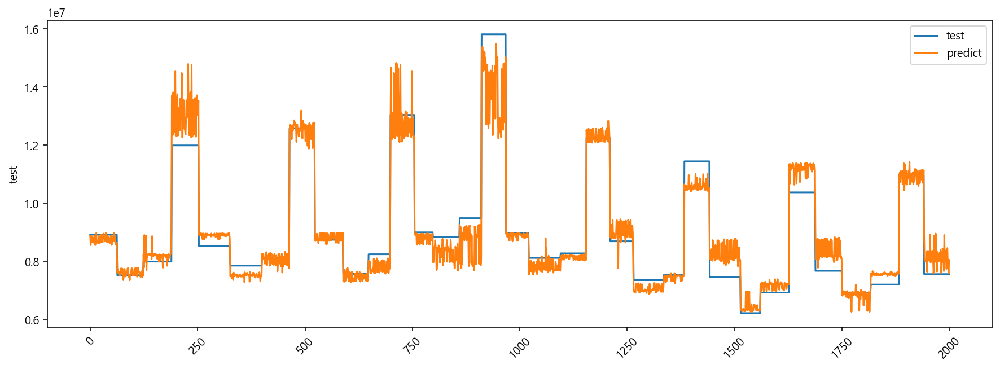

(117, 45)
랜덤 포레스트 회귀
랜덤 포레스트 회귀: 예측 결과


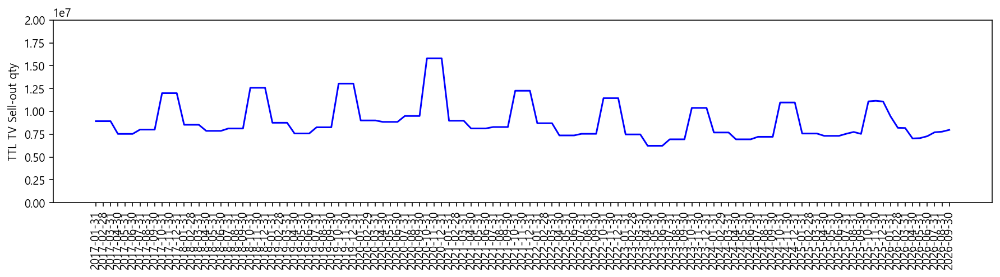

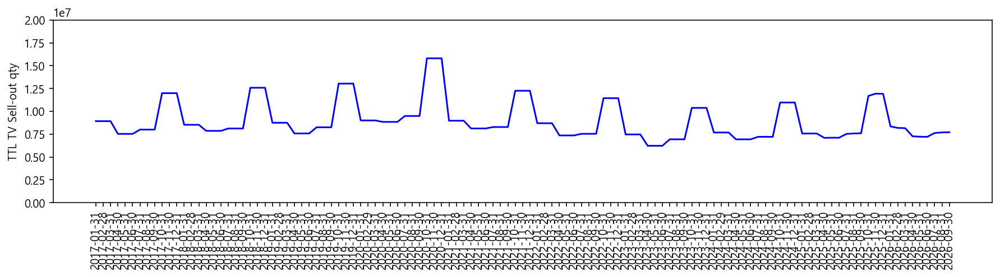

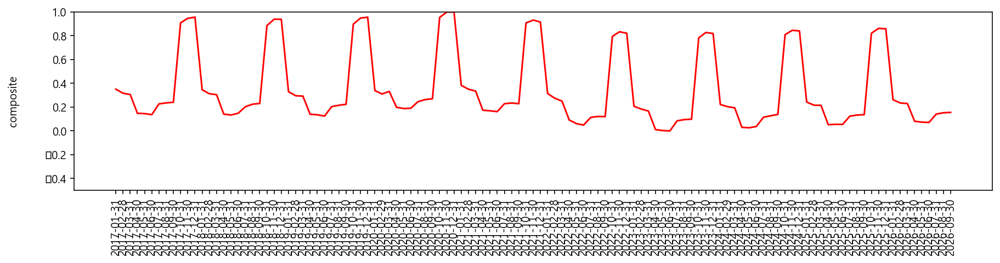

[ 7317257.  7317257.  7317257.  7548275.  7743498.  7533969. 11092262.
 11157215. 11077560.  9463710.  8200062.  8176227.  7031570.  7065697.
  7278996.  7710360.  7774414.  7975376.]
[ 7095672.  7114451.  7110048.  7524420.  7579960.  7600096. 11696023.
 11942240. 11920078.  8351216.  8187701.  8159052.  7268644.  7223643.
  7208643.  7627687.  7694985.  7714579.]
7317257.0 7608581.0 11109012.0 8613333.0 7125421.0 7820050.0
7317257.0 7608581.0 11109012.0 8613333.0 7125421.0 7820050.0
7106724.0 7568159.0 11852780.0 8232656.0 7233643.0 7679084.0
-------
(7, 11)
법인명: 03.SCA
(99, 45)
랜덤 포레스트 회귀
Train 결정계수: 0.97
Test 결정계수: 0.767
SVM 서포트 벡터 머신
Train 정확도: 0.714
Test 정확도: 0.649
TV시장 판매수량 시장지수 회귀: 예측 결과


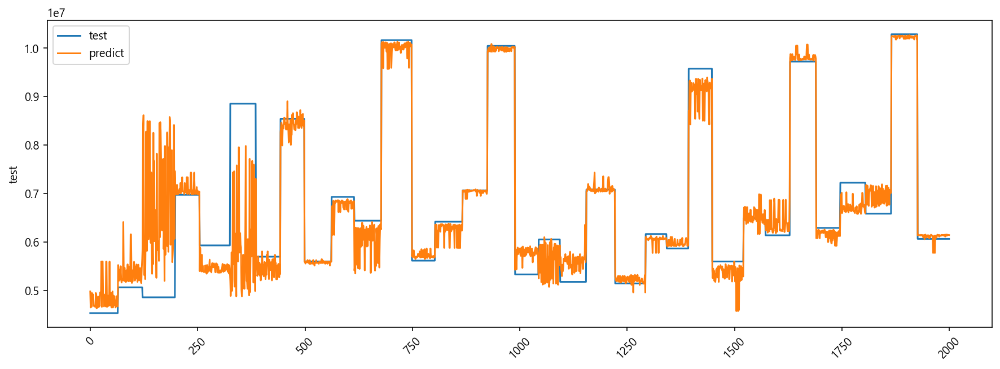

(117, 45)
랜덤 포레스트 회귀
랜덤 포레스트 회귀: 예측 결과


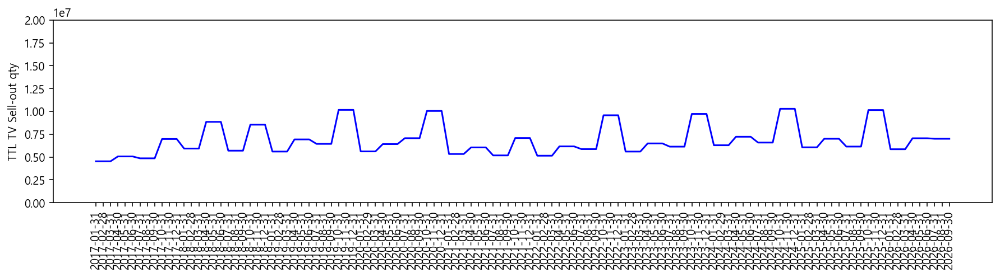

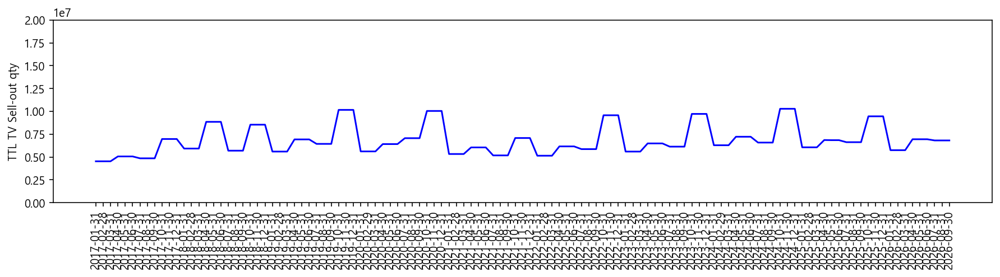

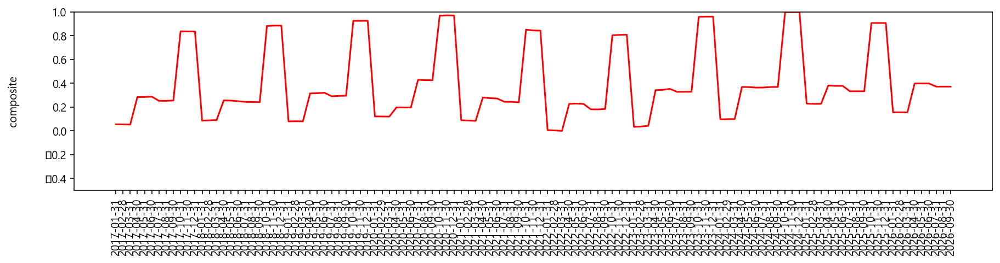

[ 6996845.  6996845.  6996845.  6142680.  6142680.  6142680. 10147162.
 10147162. 10147162.  5852028.  5852028.  5852028.  7054801.  7054801.
  7054801.  6996845.  6996845.  6996845.]
[6859340. 6845399. 6845399. 6624057. 6624057. 6624057. 9457663. 9457663.
 9457663. 5747917. 5747917. 5747917. 6945131. 6945131. 6945131. 6814279.
 6814279. 6814279.]
6996845.0 6142680.0 10147162.0 5852028.0 7054801.0 6996845.0
6996845.0 6142680.0 10147162.0 5852028.0 7054801.0 6996845.0
6850046.0 6624057.0 9457663.0 5747917.0 6945131.0 6814279.0
-------
(7, 11)
법인명: 04.MEA
(99, 45)
랜덤 포레스트 회귀
Train 결정계수: 0.951
Test 결정계수: 0.642
SVM 서포트 벡터 머신
Train 정확도: 0.252
Test 정확도: 0.181
TV시장 판매수량 시장지수 회귀: 예측 결과


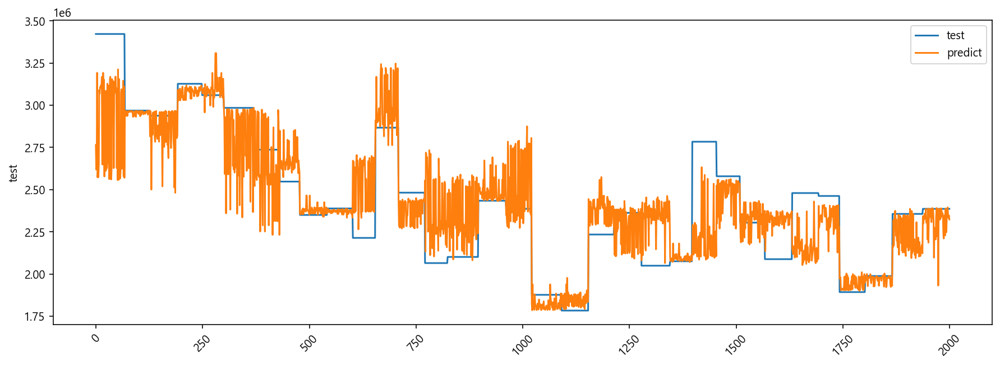

(117, 45)
랜덤 포레스트 회귀
랜덤 포레스트 회귀: 예측 결과


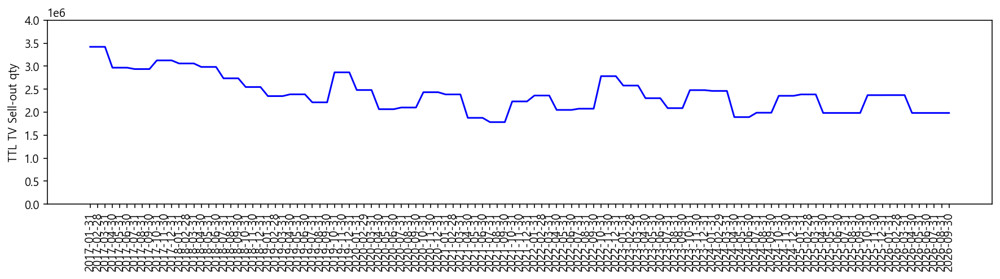

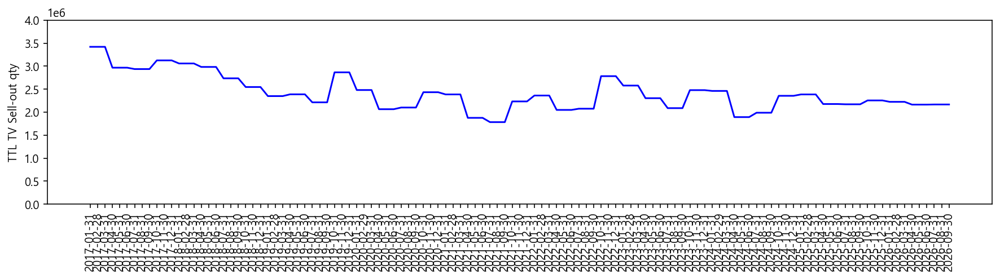

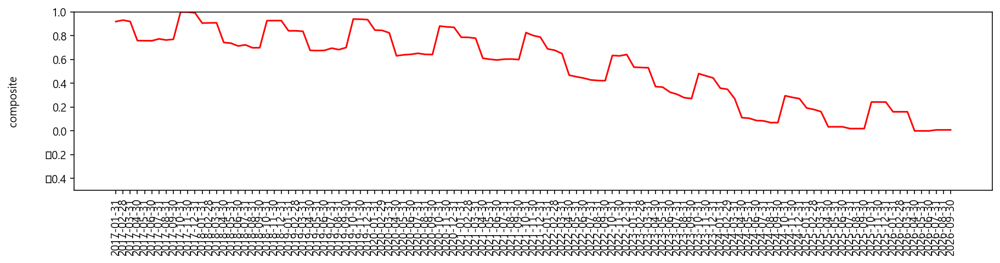

[1983326. 1983326. 1983326. 1983326. 1983326. 1983326. 2370561. 2370561.
 2370561. 2371313. 2371313. 2371313. 1983326. 1983326. 1983326. 1983326.
 1983326. 1983326.]
[2177198. 2177428. 2177345. 2171739. 2171739. 2171739. 2255580. 2255580.
 2255580. 2224807. 2224807. 2224807. 2164462. 2164462. 2164462. 2167551.
 2167551. 2167551.]
1983326.0 1983326.0 2370561.0 2371313.0 1983326.0 1983326.0
1983326.0 1983326.0 2370561.0 2371313.0 1983326.0 1983326.0
2177324.0 2171739.0 2255580.0 2224807.0 2164462.0 2167551.0
-------
(7, 11)
법인명: 05.SEA
(99, 33)
랜덤 포레스트 회귀
Train 결정계수: 0.929
Test 결정계수: 0.438
SVM 서포트 벡터 머신
Train 정확도: 0.601
Test 정확도: 0.529
TV시장 판매수량 시장지수 회귀: 예측 결과


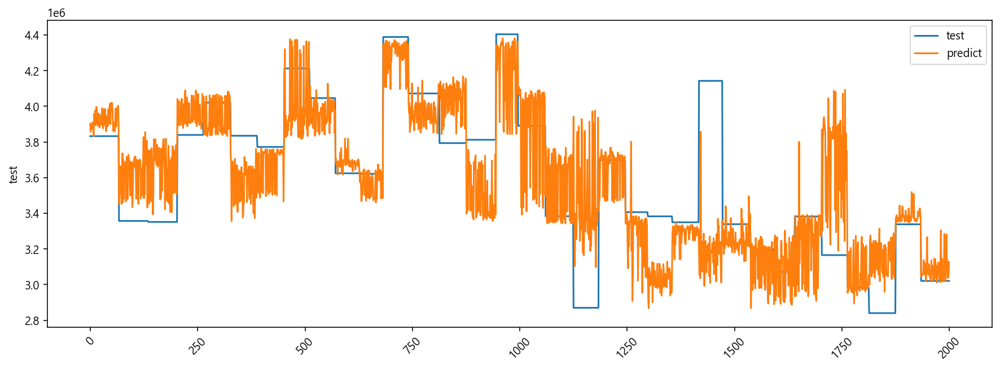

(117, 33)
랜덤 포레스트 회귀
랜덤 포레스트 회귀: 예측 결과


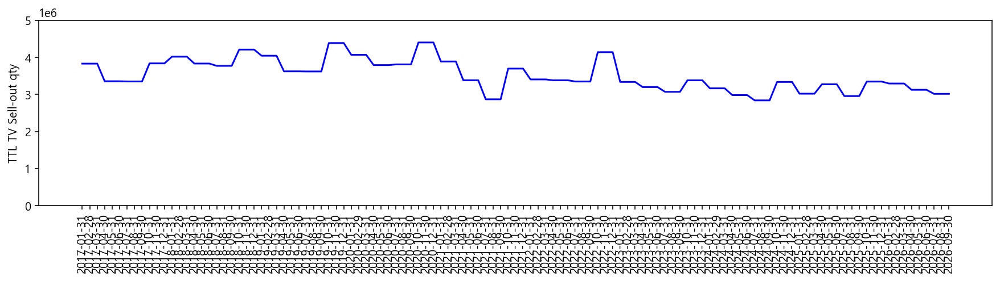

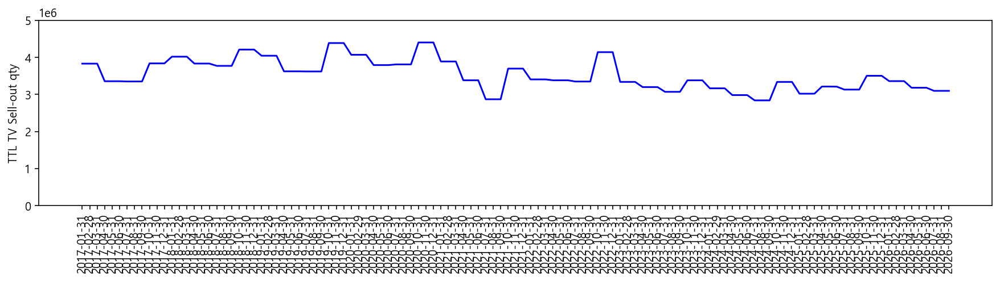

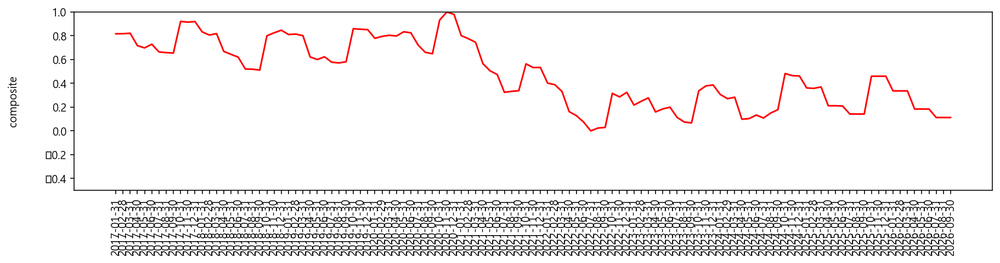

[3274694. 3274694. 3274694. 2956048. 2956048. 2956048. 3347882. 3347882.
 3347882. 3295746. 3295746. 3295746. 3126109. 3126109. 3126109. 3017143.
 3017143. 3017143.]
[3213715. 3214019. 3210269. 3132113. 3132113. 3132113. 3504618. 3504618.
 3504618. 3360140. 3360140. 3360140. 3181450. 3181450. 3181450. 3097815.
 3097815. 3097815.]
3274694.0 2956048.0 3347882.0 3295746.0 3126109.0 3017143.0
3274694.0 2956048.0 3347882.0 3295746.0 3126109.0 3017143.0
3212668.0 3132113.0 3504618.0 3360140.0 3181450.0 3097815.0


In [11]:
for sub_i in tqdm.tqdm_notebook(range(1,subs_no,1)):
# for sub_i in tqdm.tqdm_notebook(range(1,2,1)):
##############################################################################################################
### sub_i = CI 1, US 2, DG 3, ES 4, FS 5, IS 6, PL 7, UK 8, MS 9, SP 10, TK 11, AP 12, VH 13, IL 14, RA 15 ###
##############################################################################################################


##### DX Signal 법인만 추출 #####
# dx_signal_sub = [2,4,8,10,11,12]
# for sub_i in tqdm.tqdm_notebook(dx_signal_sub):
#################################


    file_dir_sub = "D:/05. SCM DX개선/{}/0.ALL/subsidiary_name.csv".format(PG_dir)
    # 법인정보 가져오기 #
    df_subsidiary = pd.DataFrame()
    df_subsidiary = pd.read_csv(file_dir_sub)
    
    ##### flag 추가 24.09.12 #####
    if df_subsidiary["ml_fcst"][sub_i-1] == "Y":
        
        print("-------")
        print(df_subsidiary.shape)
        df_subsidiary_name = list(df_subsidiary["subsidiary_name"])
        subsidiary_name = df_subsidiary_name[sub_i-1]
        print("법인명: "+subsidiary_name)

        file_dir = "D:/05. SCM DX개선/{}/{}/Raw/historical_indicator_Q.csv".format(PG_dir, subsidiary_name)
        file_dir2 = "D:/05. SCM DX개선/{}/{}/corr_data.csv".format(PG_dir, subsidiary_name)
        file_dir3 = "D:/05. SCM DX개선/{}/{}/regression_data.csv".format(PG_dir, subsidiary_name)
        file_dir4 = "D:/05. SCM DX개선/{}/{}/regression_pred_data.csv".format(PG_dir, subsidiary_name)
        file_dir5 = "D:/05. SCM DX개선/{}/{}/regression_data_m.csv".format(PG_dir, subsidiary_name)
        file_dir6 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m.csv".format(PG_dir, subsidiary_name)
        file_dir7 = "D:/05. SCM DX개선/{}/{}/regression_data_m_f.csv".format(PG_dir, subsidiary_name)
        file_dir8 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_c.csv".format(PG_dir, subsidiary_name)
        file_dir9 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_fn.csv".format(PG_dir, subsidiary_name)
        file_dir10 = "D:/05. SCM DX개선/{}/{}/Raw/feature_names.csv".format(PG_dir, subsidiary_name)
        file_dir11 = "D:/05. SCM DX개선/{}/{}/regression_data_m_c.csv".format(PG_dir, subsidiary_name)
        file_dir12 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_c_lgbm.csv".format(PG_dir, subsidiary_name)
        file_dir13 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_c_svm.csv".format(PG_dir, subsidiary_name)
        file_dir14 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_lgbm.csv".format(PG_dir, subsidiary_name)
        file_dir15 = "D:/05. SCM DX개선/{}/{}/regression_data_m_c_svm.csv".format(PG_dir, subsidiary_name)
        file_dir16 = "D:/05. SCM DX개선/{}/{}/test_composite.xlsx".format(PG_dir, subsidiary_name)
        file_dir17 = "D:/05. SCM DX개선/{}/{}/regression_data_m_woc.csv".format(PG_dir, subsidiary_name)
        file_dir18 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_woc.csv".format(PG_dir, subsidiary_name)
        file_dir19 = "D:/05. SCM DX개선/{}/{}/corr_data_wo_covid.csv".format(PG_dir, subsidiary_name)
        file_dir20 = "D:/05. SCM DX개선/{}/{}/test.csv".format(PG_dir, subsidiary_name)
        file_dir21 = "D:/05. SCM DX개선/{}/{}/test_composite_Q.csv".format(PG_dir, subsidiary_name)
        file_dir22 = "D:/05. SCM DX개선/{}/{}/regression_data_woc.csv".format(PG_dir, subsidiary_name)
        file_dir23 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_woc.csv".format(PG_dir, subsidiary_name)
        file_dir24 = "D:/05. SCM DX개선/{}/{}/regression_data_m_f_woc.csv".format(PG_dir, subsidiary_name)
        file_dir25 = "D:/05. SCM DX개선/{}/{}/regression_data_m_lgbm.csv".format(PG_dir, subsidiary_name)


        ##############################
        ### item parcelling 테스트 ###
        ##############################

        df = pd.read_csv(file_dir21)

        m_rows = m_rows_init_org    
        m_rows_2 = m_rows_2_init_org 

    #     if subsidiary_name == "12.AP":
    #         m_rows = m_rows - 12         
    #         m_rows_2 = m_rows_2 - 12     

    #     if subsidiary_name == "10.SP" or subsidiary_name == "16.CL": # 브라질
    #         covid_start = covid_start + 12 
    #         covid_end = covid_end + 12

        if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
            m_rows = m_rows + 12         # 2020.01
            m_rows_2 = m_rows_2 + 12     # 2020.12

        ### 그래프 최대값 ###
        max_sales = (max(df[prod_type]) // 10**(len(str(int(max(df[prod_type])))) - 1) + 1) * 10**(len(str(int(max(df[prod_type])))) - 1)

        df = df.iloc[:m_rows,:] # 월에 따라 변경
        print(df.shape)
        ############################################
        ### df_data 파일 입력으로 변경 21.11.30  ###
        ############################################
        df_data = np.array(pd.DataFrame(df["Composite"]))
        df_target = np.array(df[prod_type])

        scaler = MinMaxScaler()
        df_norm = pd.DataFrame(scaler.fit_transform(df_data))
        df_norm.insert(0, 'ds', df["ds"])
        df_data_trans = np.array(df_norm.iloc[:,1:])
        (62, 29)
        rfc_train_score = 0
        rfc_test_score = 0
        rfc_test_adj_score = 0
        svm_train_score = 0
        svm_test_score = 0

        ### 100회 실시 ###
        for num in range (1,101,1):

            #X_train, X_test, y_train, y_test = train_test_split(df_data, df_target, shuffle=False, test_size=t_size)
            X_train, X_test, y_train, y_test = train_test_split(df_data_trans, df_target,test_size=0.2)

            # 랜덤 포레스트를 사용한 경우의 중요 특성
            rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
            rfc.fit(X_train, y_train)

            y_pred = rfc.predict(X_test)
            df2 = pd.DataFrame()
            df2["test"]= pd.Series(y_test)
            df2["predict"] = pd.Series(y_pred)
            df2["num"] = num
            df2["accuracy"] = 1 - (abs(y_test-y_pred)/y_test)

            # 23.5.11 머신러닝 train test prediction 분석 데이터에 연/월/일 추가하기
            df2.insert(0, 'ds', df2['test'].map(df.set_index(prod_type)['ds'].groupby(level=0).first()))

            df_importance = pd.DataFrame({'feature':'composite','importance':rfc.feature_importances_})
            df_importance = df_importance.sort_values('importance', ascending=False)

            df_importance.index.name = "index_s"


            df_importance["train accuracy"] = round(rfc.score(X_train, y_train),3)
            df_importance["test accuracy"] = round(rfc.score(X_test, y_test),3)

            ### 수정 결정계수 분석을 위해 추가 21.12.13
            X_train2 = sm.add_constant(X_train)
            model2 = sm.OLS(y_train, X_train2)
            result = model2.fit()
            df_importance["test ols accuracy"] = round(result.rsquared,3)
            df_importance["test adj accuracy"] = round(result.rsquared_adj,3)

            df_importance["num"] = num


            rfc_train_score = rfc_train_score + round(rfc.score(X_train, y_train),3)
            rfc_test_score = rfc_test_score + round(rfc.score(X_test, y_test),3)
            rfc_test_adj_score = rfc_test_adj_score + round(result.rsquared_adj,3)

            # .to_csv 
            # 최초 생성 이후 mode는 append      
            if not os.path.exists(file_dir11):
                df_importance.to_csv(file_dir11, index=True, mode='w', encoding='utf-8-sig')
            else:
                if num==1: 
                    df_importance.to_csv(file_dir11, index=True, mode='w', encoding='utf-8-sig')
                else:
                    df_importance.to_csv(file_dir11, index=True, mode='a', encoding='utf-8-sig', header=False)

            # .to_csv 
            # 최초 생성 이후 mode는 append      
            if not os.path.exists(file_dir8):
                df2.to_csv(file_dir8, index=True, mode='w', encoding='utf-8-sig')
            else:
                if num==1: 
                    df2.to_csv(file_dir8, index=True, mode='w', encoding='utf-8-sig')
                else:
                    df2.to_csv(file_dir8, index=True, mode='a', encoding='utf-8-sig', header=False)



            ###################################################
            ##################   light GBM   ##################
            ###################################################    

        #     lgbm = LGBMRegressor()

        #     lgbm.fit(X_train, y_train)
        #     y_pred = lgbm.predict(X_test)


        #     df3 = pd.DataFrame()
        #     df3["test"]= pd.Series(y_test)
        #     df3["predict"] = pd.Series(y_pred)
        #     df3["num"] = num
        #     df3["accuracy"] = 1 - (abs(y_test-y_pred)/y_test)

        #     lgbm_test_score = r2_score(y_test, y_pred)


        #     if not os.path.exists(file_dir12):
        #         df3.to_csv(file_dir12, index=True, mode='w', encoding='utf-8-sig')
        #     else:
        #         if num==1: 
        #             df3.to_csv(file_dir12, index=True, mode='w', encoding='utf-8-sig')        
        #         else:
        #             df3.to_csv(file_dir12, index=True, mode='a', encoding='utf-8-sig', header=False)



            ###################################################
            ##########     SVM (서포트 벡터 머신)    ##########
            ###################################################

        #     sc = StandardScaler()
        #     X_train_2 = sc.fit_transform(X_train)
        #     X_test_2 = sc.transform(X_test)    



            svm_parameters = [{'kernel': ['linear'], 'gamma': [0.001, 0.01, 0.1, 1], 
                              'C': [100000, 1000000, 10000000]}]
            svm = GridSearchCV(SVR(), svm_parameters)
            svm.fit(X_train, y_train)
        #     print(svm.best_score_.round(3))     # 최고 점수
        #     print(svm.best_params_)    # 최고 점수를 낸 파라미터


            svm_reg = SVR(kernel=svm.best_params_['kernel'], C=svm.best_params_['C'], gamma=svm.best_params_['gamma']) #linear추가
            svm_reg.fit(X_train,y_train)
            y_pred_svr = svm_reg.predict(X_test)

            df5 = pd.DataFrame()
            df5["test"]= pd.Series(y_test)
            df5["predict"] = pd.Series(y_pred_svr)
            df5["num"] = num
            df5["accuracy"] = 1 - (abs(y_test-y_pred_svr)/y_test)


            # 23.5.11 머신러닝 train test prediction 분석 데이터에 연/월/일 추가하기
            df5.insert(0, 'ds', df2['test'].map(df.set_index(prod_type)['ds'].groupby(level=0).first()))

            coef = abs(svm_reg.coef_.ravel())


            df_importance_2 = pd.DataFrame({'feature':'composite','importance':coef })
            df_importance_2 = df_importance_2.sort_values('importance', ascending=False)


            df_importance_2["train accuracy"] = round(svm_reg.score(X_train, y_train),3)
            df_importance_2["test accuracy"] = round(svm_reg.score(X_test, y_test),3)
            df_importance_2["num"] = num

            svm_train_score = svm_train_score + round(svm_reg.score(X_train, y_train),3)
            svm_test_score = svm_test_score + round(svm_reg.score(X_test, y_test),3)

            # .to_csv 
            # 최초 생성 이후 mode는 append
            if not os.path.exists(file_dir15):
                df_importance_2.to_csv(file_dir15, index=True, mode='w', encoding='utf-8-sig')
            else:
                if num==1: 
                    df_importance_2.to_csv(file_dir15, index=True, mode='w', encoding='utf-8-sig')
                else:
                    df_importance_2.to_csv(file_dir15, index=True, mode='a', encoding='utf-8-sig', header=False)

            if not os.path.exists(file_dir13):
                df5.to_csv(file_dir13, index=True, mode='w', encoding='utf-8-sig')
            else:
                if num==1: 
                    df5.to_csv(file_dir13, index=True, mode='w', encoding='utf-8-sig')        
                else:
                    df5.to_csv(file_dir13, index=True, mode='a', encoding='utf-8-sig', header=False)



        print("랜덤 포레스트 회귀")
        print("Train 결정계수:", round((rfc_train_score/num),3))
        print("Test 결정계수:", round((rfc_test_score/num),3))

        print("SVM 서포트 벡터 머신")
        print("Train 정확도:", round((svm_train_score/num),3))
        print("Test 정확도:", round((svm_test_score/num),3))


        print("TV시장 판매수량 시장지수 회귀: 예측 결과")

        df_pred = pd.DataFrame()

        if exclude_covid == "N": # COVID 제외 로직 추가           
            df_pred = pd.read_csv(file_dir8, index_col=0)
            df_pred = df_pred.sort_values(by='ds')
            df_pred.reset_index(drop=True, inplace=True)
            fig = plt.figure(figsize=(15, 5))
            sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
            sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
            plt.xticks(rotation=45)
            plt.show()



        ##############################
        ### item parcelling 테스트 ###
        ##############################

        df = pd.read_csv(file_dir21)

        m_rows = m_rows_init    
        m_rows_2 = m_rows_2_init 

    #     if subsidiary_name == "12.AP":
    #         m_rows = m_rows - 12         
    #         m_rows_2 = m_rows_2 - 12   

        if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
            m_rows = m_rows + 12         
            m_rows_2 = m_rows_2 + 12     

        df = df.iloc[:m_rows_2,:]
        print(df.shape)

        ############################################
        ### df_data 파일 입력으로 변경 21.11.30  ###
        ############################################
        df_data = np.array(pd.DataFrame(df["Composite"]))
        df_target = np.array(df[prod_type])

        scaler = MinMaxScaler()
        df_norm = pd.DataFrame(scaler.fit_transform(df_data))
        df_norm.insert(0, 'ds', 1)
        df_data_trans = np.array(df_norm.iloc[:,1:])

        t_size = m_rows_2 - m_rows
        q_loc = 0      # Q+1 시작점

        #X_train, X_test, y_train, y_test = train_test_split(df_data_trans, df_target, test_size=t_size)
        X_train, X_test, y_train, y_test = train_test_split(df_data_trans, df_target, shuffle=False, test_size=t_size)
        #X_train, X_test, y_train, y_test = train_test_split(df_data, df_target, shuffle=False, test_size=t_size)
        #X_train, X_test, y_train, y_test = train_test_split(df_data, df_target,test_size=t_size)

        # 랜덤 포레스트를 사용한 경우의 중요 특성
        rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
        rfc.fit(X_train, y_train)

        df_importance = pd.DataFrame({'feature':"composite",'importance':rfc.feature_importances_ })
        df_importance = df_importance.sort_values('importance', ascending=False)
        x = df_importance.feature
        y = df_importance.importance
        ypos = np.arange(len(x))

        print("랜덤 포레스트 회귀")
        #print("Test 결정계수:", (rfc_test_score/num).round(3))
        #print("Train 정확도:", rfc.score(X_train, y_train).round(3))
        #print("Test 정확도:", rfc.score(X_test, y_test).round(3))
        # plt.figure(figsize=(10,1))
        # plt.barh(x.iloc[0:], y.iloc[0:])
        # plt.yticks(ypos, x.iloc[0:])
        # plt.xlabel('Importance')
        # plt.ylabel('Variable')
        # plt.xlim(0, 1)
        # plt.ylim(-1, len(x))
        # plt.show()

        y_pred = rfc.predict(X_test)
        y_train_pred = np.concatenate((y_train, y_pred))


        ###################################################
        ##########     SVM (서포트 벡터 머신)    ##########
        ###################################################


        svm_parameters = [{'kernel': ['linear'], 'gamma': [0.001, 0.01, 0.1, 1], 
                          'C': [100000, 1000000, 10000000]}]
        svm = GridSearchCV(SVR(), svm_parameters)
        svm.fit(X_train, y_train)
        #print(svm.best_score_.round(3))     # 최고 점수
        #print(svm.best_params_)    # 최고 점수를 낸 파라미터


        svm_reg = SVR(kernel=svm.best_params_['kernel'], C=svm.best_params_['C'], gamma=svm.best_params_['gamma']) #linear추가
        svm_reg.fit(X_train,y_train)
        y_pred_svr = svm_reg.predict(X_test)
        y_train_pred_svr = np.concatenate((y_train, y_pred_svr))


        print("랜덤 포레스트 회귀: 예측 결과")

        plt.figure(figsize=(15, 3))
        plt.plot(y_train_pred, c='b')
        plt.ylabel("TTL TV Sell-out qty")
        plt.ylim((0,max_sales))
        values = range(len(df["ds"]))
        plt.xticks(values,df["ds"], rotation='vertical')
        plt.show()

        plt.figure(figsize=(15, 3))
        plt.plot(y_train_pred_svr, c='b')
        plt.ylabel("TTL TV Sell-out qty")
        plt.ylim((0,max_sales))
        values = range(len(df["ds"]))
        plt.xticks(values,df["ds"], rotation='vertical')
        plt.show()

        plt.figure(figsize=(15, 3))
        plt.plot(df_data_trans, c='r')
        plt.ylim((-0.5,1))
        plt.ylabel("composite", labelpad=23)
        values = range(len(df["ds"]))
        plt.xticks(values,df["ds"], rotation='vertical')
        plt.show() 

    #     # 미국 coverage 변경 반영
    #     if subsidiary_name == "02.US":
    #         y_pred = y_pred * 0.918
    #         y_pred_svr = y_pred_svr * 0.918

        print(y_pred.round(0))
        print(y_pred_svr.round(0))

        if pred_iloc == 0:
            ### 23.01.26 추가 - 시점에 따라 iloc 변경 ###
            # Gfk데이터가 분기마감되었을 때
            y_pred_2 = y_pred 
        else:
            # Gfk데이터가 분기마감+1개월일 때
            y_pred_2 = np.append(np.array(df.iloc[m_rows-pred_iloc:m_rows,1:2]), y_pred)
    #     elif pred_iloc == 2:
    #         # Gfk데이터가 분기마감+2개월일 때
    #         y_pred_2 = np.append(np.array(df.iloc[m_rows-pred_iloc+1:m_rows,1:2]), y_pred)


        ### 21.11.30 추가 - 시점에 따라 iloc 변경 ###
        ### 24.01.26 추가 - Q+4 (현재기준 Q+3)로 예측구간 확대 
        ### 24.10.07 추가 - Q+5 로 예측구간 확대
        y_pred_q1 = y_pred_2[q_loc:q_loc+3].mean().round(0)
        y_pred_q2 = y_pred_2[q_loc+3:q_loc+6].mean().round(0)
        y_pred_q3 = y_pred_2[q_loc+6:q_loc+9].mean().round(0)
        y_pred_q4 = y_pred_2[q_loc+9:q_loc+12].mean().round(0)
        y_pred_q5 = y_pred_2[q_loc+12:q_loc+15].mean().round(0)
        y_pred_q6 = y_pred_2[q_loc+15:q_loc+18].mean().round(0)
        print(y_pred_q1, y_pred_q2, y_pred_q3, y_pred_q4, y_pred_q5, y_pred_q6)

        if pred_iloc == 0:   
            ### 23.01.26 추가 - 시점에 따라 iloc 변경 ###
            # Gfk데이터가 분기마감되었을 때
            y_pred_svr_2 = y_pred_svr
        else:
            # Gfk데이터가 분기마감+1개월일 때
            y_pred_svr_2 = np.append(np.array(df.iloc[m_rows-pred_iloc:m_rows,1:2]), y_pred_svr)
    #     elif pred_iloc == 2:
    #         # Gfk데이터가 분기마감+2개월일 때
    #         y_pred_svr_2 = np.append(np.array(df.iloc[m_rows-pred_iloc+1:m_rows,1:2]), y_pred_svr)
        y_pred_svr_2

        y_pred_svr_q1 = y_pred_svr_2[q_loc:q_loc+3].mean().round(0)
        y_pred_svr_q2 = y_pred_svr_2[q_loc+3:q_loc+6].mean().round(0)
        y_pred_svr_q3 = y_pred_svr_2[q_loc+6:q_loc+9].mean().round(0)
        y_pred_svr_q4 = y_pred_svr_2[q_loc+9:q_loc+12].mean().round(0)
        y_pred_svr_q5 = y_pred_svr_2[q_loc+12:q_loc+15].mean().round(0)
        y_pred_svr_q6 = y_pred_svr_2[q_loc+15:q_loc+18].mean().round(0)

        print(y_pred_q1, y_pred_q2, y_pred_q3, y_pred_q4, y_pred_q5, y_pred_q6)
        print(y_pred_svr_q1, y_pred_svr_q2, y_pred_svr_q3, y_pred_svr_q4, y_pred_svr_q5, y_pred_svr_q6)

        ### 21.11.30 추가 ###
        ### 24.01.26 추가 - Q+4 (현재기준 Q+3)로 예측구간 확대
        ### 24.10.07 추가 - Q+5 로 예측구간 확대
        df4 = pd.DataFrame()
        df4["predict_Q1"] = pd.Series(y_pred_q1)
        df4["predict_Q2"] = pd.Series(y_pred_q2)
        df4["predict_Q3"] = pd.Series(y_pred_q3)
        df4["predict_Q4"] = pd.Series(y_pred_q4)
        df4["predict_Q5"] = pd.Series(y_pred_q5)
        df4["predict_Q6"] = pd.Series(y_pred_q6)

        df4["predict_method"] = "RandomForest_composite"
        df4["last update_date"] = time.strftime('%Y-%m-%d %H:%M', time.localtime(time.time()))
        # .to_csv
        if not os.path.exists(file_dir9):
            df4.to_csv(file_dir9, index=True, mode='w', encoding='utf-8-sig')    
        else:
            if first_fcst == "Y":
                df4.to_csv(file_dir9, index=True, mode='w', encoding='utf-8-sig')
            else:
                df4.to_csv(file_dir9, index=True, mode='a', encoding='utf-8-sig', header=False)

        df4["predict_Q1"] = pd.Series(y_pred_svr_q1)
        df4["predict_Q2"] = pd.Series(y_pred_svr_q2)
        df4["predict_Q3"] = pd.Series(y_pred_svr_q3)
        df4["predict_Q4"] = pd.Series(y_pred_svr_q4)
        df4["predict_Q5"] = pd.Series(y_pred_svr_q5)
        df4["predict_Q6"] = pd.Series(y_pred_svr_q6)

        df4["predict_method"] = "RandomForest_composite_SVM"
        df4["last update_date"] = time.strftime('%Y-%m-%d %H:%M', time.localtime(time.time()))
        # .to_csv
        if not os.path.exists(file_dir9):
            df4.to_csv(file_dir9, index=True, mode='w', encoding='utf-8-sig')
        else:
            df4.to_csv(file_dir9, index=True, mode='a', encoding='utf-8-sig', header=False)


# 국가별 분석

In [22]:
#####################################################################################################################
### sub_i = CI 1, US 2, DG 3, ES 4, FS 5, IS 6, PL 7, UK 8, MS 9, SP 10, TK 11, AP 12, VH 13, IL 14, CL 15, SL 23 ###
#####################################################################################################################
sub_i = 22

m_rows_init = m_rows_init_org
m_rows_2_init = m_rows_2_init_org
    
file_dir_sub = r"D:\05. SCM DX개선\{}\0.ALL\subsidiary_name.csv".format(PG_dir)
# 법인정보 가져오기 #
df_subsidiary = pd.DataFrame()
df_subsidiary = pd.read_csv(file_dir_sub)
print(df_subsidiary.shape)
df_subsidiary_name = list(df_subsidiary["subsidiary_name"])
subsidiary_name = df_subsidiary_name[sub_i-1]

print("법인명: "+subsidiary_name)

(28, 11)
법인명: 28.JP


In [23]:
file_dir = "D:/05. SCM DX개선/{}/{}/Raw/historical_indicator_Q.csv".format(PG_dir, subsidiary_name)
file_dir2 = "D:/05. SCM DX개선/{}/{}/corr_data.csv".format(PG_dir, subsidiary_name)
file_dir3 = "D:/05. SCM DX개선/{}/{}/regression_data.csv".format(PG_dir, subsidiary_name)
file_dir4 = "D:/05. SCM DX개선/{}/{}/regression_pred_data.csv".format(PG_dir, subsidiary_name)
file_dir5 = "D:/05. SCM DX개선/{}/{}/regression_data_m.csv".format(PG_dir, subsidiary_name)
file_dir6 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m.csv".format(PG_dir, subsidiary_name)
file_dir7 = "D:/05. SCM DX개선/{}/{}/regression_data_m_f.csv".format(PG_dir, subsidiary_name)
file_dir8 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_c.csv".format(PG_dir, subsidiary_name)
file_dir9 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_fn.csv".format(PG_dir, subsidiary_name)
file_dir10 = "D:/05. SCM DX개선/{}/{}/Raw/feature_names.csv".format(PG_dir, subsidiary_name)
file_dir11 = "D:/05. SCM DX개선/{}/{}/regression_data_m_c.csv".format(PG_dir, subsidiary_name)
file_dir12 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_c_lgbm.csv".format(PG_dir, subsidiary_name)
file_dir13 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_c_svm.csv".format(PG_dir, subsidiary_name)
file_dir14 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_lgbm.csv".format(PG_dir, subsidiary_name)
file_dir15 = "D:/05. SCM DX개선/{}/{}/regression_data_m_c_svm.csv".format(PG_dir, subsidiary_name)
file_dir16 = "D:/05. SCM DX개선/{}/{}/test_composite.xlsx".format(PG_dir, subsidiary_name)
file_dir17 = "D:/05. SCM DX개선/{}/{}/regression_data_m_woc.csv".format(PG_dir, subsidiary_name)
file_dir18 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_woc.csv".format(PG_dir, subsidiary_name)
file_dir19 = "D:/05. SCM DX개선/{}/{}/corr_data_wo_covid.csv".format(PG_dir, subsidiary_name)
file_dir20 = "D:/05. SCM DX개선/{}/{}/test.csv".format(PG_dir, subsidiary_name)
file_dir21 = "D:/05. SCM DX개선/{}/{}/test_composite_Q.csv".format(PG_dir, subsidiary_name)
file_dir22 = "D:/05. SCM DX개선/{}/{}/regression_data_woc.csv".format(PG_dir, subsidiary_name)
file_dir23 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_woc.csv".format(PG_dir, subsidiary_name)
file_dir24 = "D:/05. SCM DX개선/{}/{}/regression_data_m_f_woc.csv".format(PG_dir, subsidiary_name)
file_dir25 = "D:/05. SCM DX개선/{}/{}/regression_data_m_lgbm.csv".format(PG_dir, subsidiary_name)

In [24]:
df = pd.read_csv(file_dir)

covid_start = 0
covid_end = 0
covid_range = 0


if exclude_covid == "Y":
    covid_start = df[df["COVID_YN"]==1].index[0:].min()   # COVID 시작
    covid_end = df[df["COVID_YN"]==1].index[0:].max()+1   # COVID 끝

# if subsidiary_name == "10.SP" or subsidiary_name == "16.CL": # 브라질 2016년 부터
#     covid_start = covid_start + 12 
#     covid_end = covid_end + 12

covid_range = covid_end - covid_start
exclude_covid_org = exclude_covid

if np.isnan(covid_range):
    exclude_covid = "N" # Pent-up 수요기간 없을 경우


# 23.04.12 제외 
# if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
#     df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
#     df = df.reset_index(drop=True)
    
print(df.shape)
print("COVID 구간 제외 여부: ",exclude_covid)
print("COVID 구간 : ",covid_range)
df_org = df.copy()

(120, 102)
COVID 구간 제외 여부:  Y
COVID 구간 :  24


In [25]:
# 23.4.12 추가
if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
    m_rows_init = m_rows_init + 12         # 2020.01
    m_rows_2_init = m_rows_2_init + 12     # 2020.12
    
m_rows = m_rows_init    
m_rows_2 = m_rows_2_init  


### m_rows 추가 조정 ###
if exclude_covid == "Y" :
    m_rows = m_rows-covid_range
    m_rows_2 = m_rows_2-covid_range

# 23.4.12 제외
# if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
#     m_rows = m_rows + 12         # 2020.01
#     m_rows_2 = m_rows_2 + 12     # 2020.12
### m_rows 추가 조정 ###


t_size = m_rows_2-m_rows     # 예측기간
q_loc = 0      # Q+1 시작점


org_feature_no = df.shape[1]-2 # Features
max_feature_adj = 0 # max_feature 조정시 1 / 아닐경우 0
max_feature_no = 0 

# if subsidiary_name == "07.PL" or subsidiary_name == "09.MS": # Seasonality 종속성 완화
#     max_feature_adj = 1
#     max_feature_no = 7
    
# if subsidiary_name == "01.CI" or subsidiary_name == "14.IL" or subsidiary_name == "06.IS": # Seasonality 종속성 완화
#     max_feature_adj = 1
#     max_feature_no = 8
    
# if subsidiary_name == "02.US": # Seasonality 종속성 완화
#     max_feature_adj = 1
#     max_feature_no = 8
    
# if subsidiary_name == "08.UK": # Seasonality 종속성 완화
#     max_feature_adj = 1
#     max_feature_no = 12

max_feature_adj = df_subsidiary["dependency"][sub_i-1]
max_feature_no = df_subsidiary["max_no"][sub_i-1]
mov_no = df_subsidiary["mov"][sub_i-1]
    
print("max_feature 조정값:(No=0/Yes=1)", max_feature_adj)
print("max_feature 갯수:", max_feature_no)
print("feature 범위: 0 ~ -", mov_no,"개월")
# print("feature 범위: - 1 ~ -", mov_no,"개월")

max_feature 조정값:(No=0/Yes=1) 0
max_feature 갯수: 0
feature 범위: 0 ~ - 0 개월


# M0 ~ M+6 TV sales와 인자별 상관계수 분석

In [26]:
# 상관분석 M+1

# for mov in range (1,7,1):    # 6개월 선행관계 확인
for mov in range (0,7,1):    # 6개월 선행관계 확인

    df_TV_sales = pd.DataFrame()
    df_features = pd.DataFrame()
    df_features_mov = pd.DataFrame()

    df_TV_sales = df_org.iloc[covid:m_rows_init,:3]
    
    df_TV_sales = df_TV_sales.reset_index(drop=True)
    
    # 24.01.29 변경 mov=0 추가
    if mov == 0:
        ######
        df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+1]
        df = pd.concat([df_TV_sales, df_features], axis=1)
        ######
    else:

        # 23.4.12 변경
        df_features = df_org.iloc[covid:covid+1,3:org_feature_no+1]
        for item in range (1, mov, 1):
            df_features = df_features.append(df_org.iloc[covid:covid+1,3:org_feature_no+1], ignore_index=True)
        # 변경 완료

        df_features = df_features.append(df_org.iloc[covid:m_rows_init-mov,3:org_feature_no+2], ignore_index=True)

        df = pd.concat([df_TV_sales, df_features], axis=1)

    # 23.4.12 추가
    if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
        df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
        df = df.reset_index(drop=True)
    
#     if mov == 1:
    if mov == 0:
        print(df.shape)

    df_cor = df.corr()
    num = df_cor._get_numeric_data()
    num[num < 0] = num*-1

    corr_data_pros = pd.DataFrame()
    corr_data_cons = pd.DataFrame()
    corr_data_pros = df.corr().iloc[:,[0]]
    corr_data_cons = df.corr().iloc[:,[0]]
    corr_data_pros = corr_data_pros.sort_values(by=prod_type, ascending=False)
    corr_data_cons = corr_data_cons.sort_values(by=prod_type, ascending=True)

    corr_data_pros["mov"] = mov
    
    if exclude_covid == "Y" :
        if not os.path.exists(file_dir19):
            corr_data_pros.to_csv(file_dir19, index=True, mode='w', encoding='utf-8-sig')
        else:
#             if mov==1:
            if mov==0:
                corr_data_pros.to_csv(file_dir19, index=True, mode='w', encoding='utf-8-sig')
            else:
                corr_data_pros.to_csv(file_dir19, index=True, mode='a', encoding='utf-8-sig', header=False)
    else:            
        # .to_csv 
        # 최초 생성 이후 mode는 append
        if not os.path.exists(file_dir2):
            corr_data_pros.to_csv(file_dir2, index=True, mode='w', encoding='utf-8-sig')
        else:
#             if mov==1:
            if mov==0:
                corr_data_pros.to_csv(file_dir2, index=True, mode='w', encoding='utf-8-sig')
            else:
                corr_data_pros.to_csv(file_dir2, index=True, mode='a', encoding='utf-8-sig', header=False)

(69, 101)


# TV sales vs 지표별 상관계수 (동일 월 기준)

In [27]:
# 파일 열기
df = pd.read_csv(file_dir)

df_TV_sales = pd.DataFrame()
df_features = pd.DataFrame()
df_features_mov = pd.DataFrame()

df_TV_sales = df.iloc[covid:m_rows_init,:3]
    
df_TV_sales = df_TV_sales.reset_index(drop=True)


# 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+2]
df = pd.concat([df_TV_sales, df_features], axis=1)
        
        
# 23.4.12 변경
# df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

# df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
# df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
# df = pd.concat([df_TV_sales, df_features], axis=1)

# 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
# for item in range (2, mov_no+1, 1):

# df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

# df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
# df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
# df = pd.concat([df_TV_sales, df_features], axis=1)

for item in range (1, mov_no+1, 1):
    if item == 1:
        df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
        df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        
    else:
        df_features_mov = df.iloc[covid:m_rows_init,3:org_feature_no+2].shift(item-1)
        df_features_mov = df_features_mov.fillna(method='bfill')

    new_cols = []
    for col in df_features_mov.columns:
        new_col = str(col + "_" + str(item))
        new_cols.append(new_col)

    df_features_mov.columns = new_cols
    
    df = pd.concat([df, df_features_mov], axis=1)
#변경 완료


# 23.4.12 추가
if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
    df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
    df = df.reset_index(drop=True)
        
print(df.shape)

(69, 102)


In [28]:
df_cor = df.corr()
num = df_cor._get_numeric_data()
num[num < 0] = num*-1

corr_data = pd.DataFrame()
corr_data_pros = pd.DataFrame()
corr_data_cons = pd.DataFrame()
corr_data = df.corr().iloc[:,[0]]
corr_data_pros = df.corr().iloc[:,[0]]
corr_data_cons = df.corr().iloc[:,[0]]
corr_data_pros = corr_data_pros.sort_values(by=prod_type, ascending=False)
corr_data_cons = corr_data_cons.sort_values(by=prod_type, ascending=True)

<AxesSubplot:>

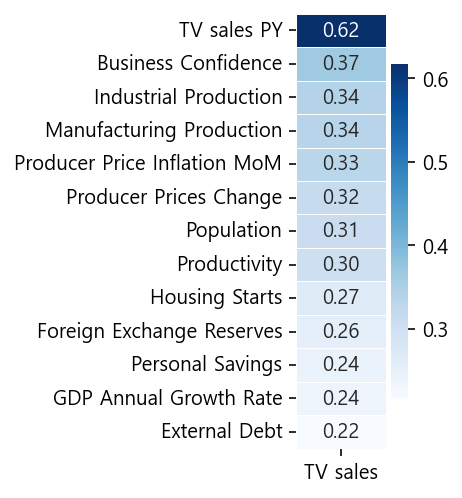

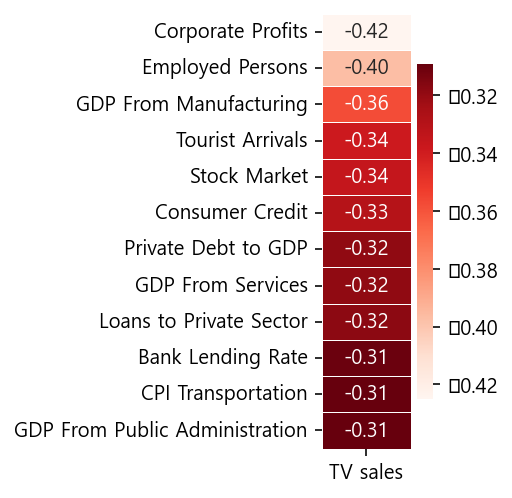

In [29]:
plt.figure(figsize=(1,4))
sns.heatmap(data = corr_data_pros.iloc[1:14,[0]], annot=True, 
fmt = '.2f', linewidths=.3, cmap='Blues')
plt.figure(figsize=(1,4))
sns.heatmap(data = corr_data_cons.iloc[:12,[0]], annot=True, 
fmt = '.2f', linewidths=.3, cmap='Reds')

In [30]:
corr_data_pros_index1 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[1:3].tolist() + corr_data_pros.index[4:5].tolist() + corr_data_pros.index[6:9].tolist()
corr_data_pros_index2 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[8:14].tolist()
corr_data_pros_index3 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[14:20].tolist()
corr_data_cons_index1 = corr_data_pros.index[0:1].tolist() + corr_data_cons.index[0:6].tolist()
corr_data_cons_index2 = corr_data_pros.index[0:1].tolist() + corr_data_cons.index[6:12].tolist()
print(corr_data_pros_index1)
print(corr_data_cons_index1)

['TV sales', 'TV sales PY', 'Business Confidence', 'Manufacturing Production', 'Producer Prices Change', 'Population', 'Productivity']
['TV sales', 'Corporate Profits', 'Employed Persons', 'GDP From Manufacturing', 'Tourist Arrivals', 'Stock Market', 'Consumer Credit']


In [32]:
#########################################################
######## ----- 여기까지 필수로 실행할 것 ----- ##########
#########################################################

# Prophet(시계열기반) TV sales 예측

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


(114, 1)
Prophet model forecast


Text(0.5, 1.0, 'TV sales Forecast: TV by Prophet')

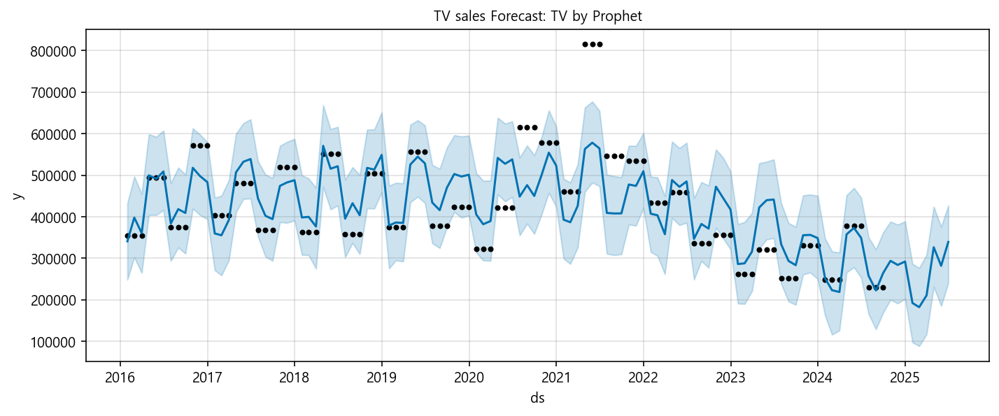

In [31]:
df_tv = df[["ds", prod_type]]
df_tv['ds']= pd.to_datetime(df_tv['ds'])
df_tv.columns = ['ds', 'y']
df_tv.shape

m_tv = Prophet(weekly_seasonality=True)
m_tv.fit(df_tv)

# 미래 9개월 예측
future_tv = m_tv.make_future_dataframe(freq='M', periods=9)
print(future_tv.shape)
forecast_tv = m_tv.predict(future_tv)
# forecast_tv[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

plot_tv = m_tv.plot(forecast_tv, figsize=(10,4))

print("Prophet model forecast")
ax_tv = plot_tv.gca()
ax_tv.set_title("TV sales Forecast: TV by Prophet", size=10)

# 상관관계 탐색적 분석 (코로나 기준 비교)

In [32]:
# df['ds'] = pd.to_datetime(df['ds'])
# df['QT'] = df['ds'].dt.quarter
# df

In [ ]:
### 선행지표 상관관계
# corr_feature_names1 = corr_data_pros.index[0:1].tolist() + df_feature_names[1:6]
# corr_feature_names2 = corr_data_pros.index[0:1].tolist() + df_feature_names[6:]
# sns.pairplot(df, size=2, kind='reg', vars=corr_feature_names2)

In [ ]:
#분석용#
category = [prod_type, "Industrial Production", "GDP Annual Growth Rate", "GDP Growth Rate"]
# print(corr_data_pros.xs(category).round(2))
sns.pairplot(df, size=1.7, hue="QT", kind='reg', vars=category)

In [ ]:
#분석용#
category = [prod_type, 'Business Confidence', "Consumer Confidence", "GDP Annual Growth Rate", "Leading Economic Index", "Retail Sales YoY"]
# print(corr_data_pros.xs(category).round(2))
sns.pairplot(df, size=1.7, hue="COVID_YN", kind='reg', vars=category)

In [ ]:
#분석용#
category = [prod_type, 'Bank Lending Rate', "Unemployment Rate", "Currency", "Inflation Rate", "Loans to Private Sector"]
# print(corr_data_pros.xs(category).round(2))
sns.pairplot(df, size=1.7, hue="COVID_YN", kind='reg', vars=category)

In [ ]:
### 양의 상관관계
sns.pairplot(df, size=1.5, hue="COVID_YN", kind='reg',
             vars=corr_data_pros_index1)

In [ ]:
sns.pairplot(df, size=1.5, hue="COVID_YN", kind='reg',
             vars=corr_data_pros_index2)

In [ ]:
sns.pairplot(df, size=1.5, hue="COVID_YN", kind='reg',
             vars=corr_data_pros_index3)

In [ ]:
### 음의 상관관계
sns.pairplot(df, size=1.5, hue="COVID_YN", kind='reg',
             vars=corr_data_cons_index1)

In [ ]:
sns.pairplot(df, size=1.5, hue="COVID_YN", kind='reg',
             vars=corr_data_cons_index2)

# 랜덤포레스트를 통한 중요도 분석

In [33]:
# 파일 열기
df = pd.read_csv(file_dir)

df_TV_sales = pd.DataFrame()
df_features = pd.DataFrame()
df_features_mov = pd.DataFrame()

df_TV_sales = df.iloc[covid:m_rows_init,:3]
    
df_TV_sales = df_TV_sales.reset_index(drop=True)


# 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+2]
df = pd.concat([df_TV_sales, df_features], axis=1)
        
        
# 23.4.12 변경
# df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

# df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
# df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
# df = pd.concat([df_TV_sales, df_features], axis=1)

# 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
# for item in range (2, mov_no+1, 1):

# df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

# df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
# df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
# df = pd.concat([df_TV_sales, df_features], axis=1)

for item in range (1, mov_no+1, 1):
    if item == 1:
        df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
        df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        
    else:
        df_features_mov = df.iloc[covid:m_rows_init,3:org_feature_no+2].shift(item-1)
        df_features_mov = df_features_mov.fillna(method='bfill')

    new_cols = []
    for col in df_features_mov.columns:
        new_col = str(col + "_" + str(item))
        new_cols.append(new_col)

    df_features_mov.columns = new_cols
    
    df = pd.concat([df, df_features_mov], axis=1)
#변경 완료


# 23.4.12 추가
if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
    df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
    df = df.reset_index(drop=True)
        
print(df.shape)

(69, 102)


In [34]:
# 23.7.5 feature 수 다시 계산함
feature_no = df.shape[1]-2 # Features
df_feature_names = df.columns[2:feature_no+2] 
df_feature_names = list(df_feature_names)

In [35]:
df_data = np.array(df.iloc[:,2:feature_no+2]) 
df_target = np.array(df[prod_type])

랜덤 포레스트 회귀
Train 결정계수: 0.91
Test 결정계수: 0.756


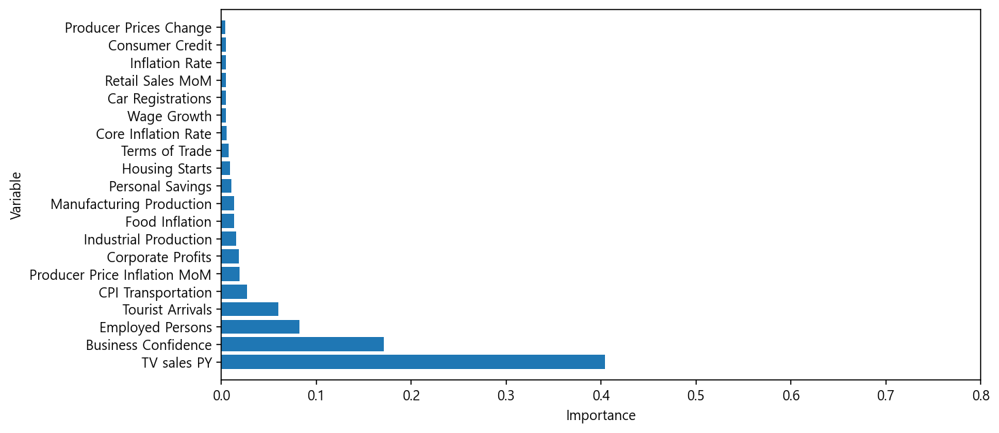

In [36]:
rfc_train_score = 0
rfc_test_score = 0

### 100회 실시 ###
for num in range (1,100,1):
    
    X_train, X_test, y_train, y_test = train_test_split(df_data, df_target,test_size=0.2)

    # 랜덤 포레스트를 사용한 경우의 중요 특성
    rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
    rfc.fit(X_train, y_train)        
    
    y_pred = rfc.predict(X_test)
    df2 = pd.DataFrame()
    df2["test"]= pd.Series(y_test)
    df2["predict"] = pd.Series(y_pred)
    
    # 23.5.11 머신러닝 train test prediction 분석 데이터에 연/월/일 추가하기
    df2.insert(0, 'ds', df2['test'].map(df.set_index(prod_type)['ds'].groupby(level=0).first()))

    #df_importance = pd.DataFrame({'feature':df_feature_names,'importance':rfc.feature_importances_ })
    df_importance = pd.DataFrame({'feature':df_feature_names,'importance':rfc.feature_importances_, 
                                  'corr':np.array(corr_data.iloc[:,[0]].loc[df_feature_names].round(2)[prod_type])})
    df_importance = df_importance.sort_values('importance', ascending=False)
    
    df_importance.index.name = "index_s"
    df_importance["train accuracy"] = rfc.score(X_train, y_train).round(3)
    df_importance["test accuracy"] = rfc.score(X_test, y_test).round(3)
    df_importance["num"] = num
    
    rfc_train_score = rfc_train_score + rfc.score(X_train, y_train).round(3)
    rfc_test_score = rfc_test_score + rfc.score(X_test, y_test).round(3)
  
    
    if exclude_covid == "N": # COVID 제외 로직 추가           
        # .to_csv 
        # 최초 생성 이후 mode는 append
        if not os.path.exists(file_dir3):
            df_importance.to_csv(file_dir3, index=True, mode='w', encoding='utf-8-sig')
        else:
            if num==1:
                df_importance.to_csv(file_dir3, index=True, mode='w', encoding='utf-8-sig')
            else:
                df_importance.to_csv(file_dir3, index=True, mode='a', encoding='utf-8-sig', header=False)

        if not os.path.exists(file_dir4):
            df2.to_csv(file_dir4, index=True, mode='w', encoding='utf-8-sig')
        else:
            if num==1:
                df2.to_csv(file_dir4, index=True, mode='w', encoding='utf-8-sig')
            else:
                df2.to_csv(file_dir4, index=True, mode='a', encoding='utf-8-sig', header=False)

    else:                    
        # .to_csv 
        # 최초 생성 이후 mode는 append
        if not os.path.exists(file_dir22):
            df_importance.to_csv(file_dir22, index=True, mode='w', encoding='utf-8-sig')
        else:
            if num==1:
                df_importance.to_csv(file_dir22, index=True, mode='w', encoding='utf-8-sig')
            else:
                df_importance.to_csv(file_dir22, index=True, mode='a', encoding='utf-8-sig', header=False)

        if not os.path.exists(file_dir23):
            df2.to_csv(file_dir23, index=True, mode='w', encoding='utf-8-sig')
        else:
            if num==1:
                df2.to_csv(file_dir23, index=True, mode='w', encoding='utf-8-sig')
            else:
                df2.to_csv(file_dir23, index=True, mode='a', encoding='utf-8-sig', header=False)
    
    
x = df_importance.feature
y = df_importance.importance
ypos = np.arange(len(x)-1)

print("랜덤 포레스트 회귀")
print("Train 결정계수:", (rfc_train_score/num).round(3))
print("Test 결정계수:", (rfc_test_score/num).round(3))
plt.figure(figsize=(10,5))
plt.barh(x.iloc[:20], y.iloc[:20])
plt.yticks(ypos[:20], x.iloc[:20])
plt.xlabel('Importance')
plt.ylabel('Variable')
plt.xlim(0, 0.8)
plt.ylim(-1, 20)
plt.show()

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


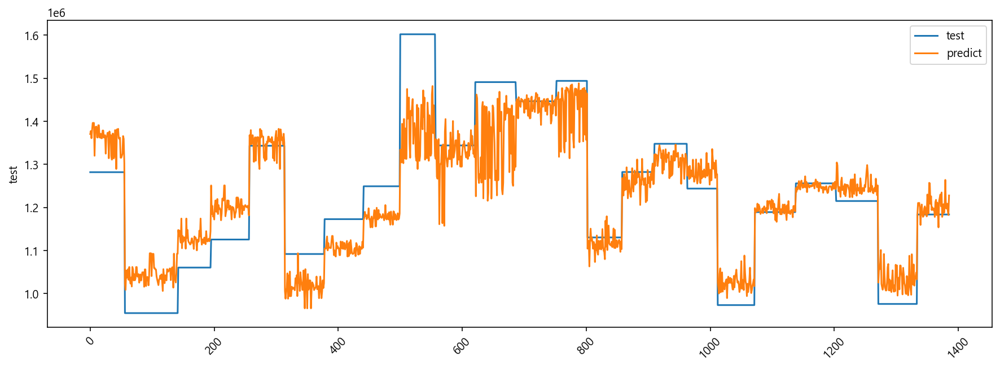

In [37]:
print("TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과")

df_pred = pd.DataFrame()

if exclude_covid == "N": # COVID 제외 로직 추가           
    df_pred = pd.read_csv(file_dir4, index_col=0)
    df_pred = df_pred.sort_values(by='ds')
    df_pred.reset_index(drop=True, inplace=True)
    fig = plt.figure(figsize=(15, 5))
    sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
    sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
    plt.xticks(rotation=45)
    plt.show()

else:                    
    df_pred = pd.read_csv(file_dir23, index_col=0)
    df_pred = df_pred.sort_values(by='ds')
    df_pred.reset_index(drop=True, inplace=True)
    fig = plt.figure(figsize=(15, 5))
    sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
    sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
    plt.xticks(rotation=45)
    plt.show()

# [학습] 선행지표 기준 머신러닝 학습

In [45]:
for item in range (1, mov_no+1, 1):
    if item == 1:
        df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
        df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        
    else:
        df_features_mov = df.iloc[covid:m_rows_init,3:org_feature_no+2].shift(item-1)
        df_features_mov = df_features_mov.fillna(method='bfill')

    new_cols = []
    for col in df_features_mov.columns:
        new_col = str(col + "_" + str(item))
        new_cols.append(new_col)

    df_features_mov.columns = new_cols
    
    df = pd.concat([df, df_features_mov], axis=1)
#변경 완료

In [46]:
# 파일 열기
df = pd.read_csv(file_dir)

df_TV_sales = pd.DataFrame()
df_features = pd.DataFrame()
df_features_mov = pd.DataFrame()

df_TV_sales = df.iloc[covid:m_rows_init,:3]
    
df_TV_sales = df_TV_sales.reset_index(drop=True)


# 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+2]
df = pd.concat([df_TV_sales, df_features], axis=1)
        
        
# 23.4.12 변경
# df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

# df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
# df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
# df = pd.concat([df_TV_sales, df_features], axis=1)

# 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
# for item in range (2, mov_no+1, 1):

# df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

# df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
# df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
# df = pd.concat([df_TV_sales, df_features], axis=1)

for item in range (1, mov_no+1, 1):
    if item == 1:
        df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
        df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
        df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        
    else:
        df_features_mov = df.iloc[covid:m_rows_init,3:org_feature_no+2].shift(item-1)
        df_features_mov = df_features_mov.fillna(method='bfill')

    new_cols = []
    for col in df_features_mov.columns:
        new_col = str(col + "_" + str(item))
        new_cols.append(new_col)

    df_features_mov.columns = new_cols
    
    df = pd.concat([df, df_features_mov], axis=1)
#변경 완료



# 23.4.12 추가
if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
    df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
    df = df.reset_index(drop=True)
        
print(df.shape)

(92, 103)


In [47]:
###################################################
### 법인별 선행지표 파일 입력으로 변경 21.11.30 ###
###################################################
df_features = pd.read_csv(file_dir10)

if use_google_trends == "N":
    df_features = df_features[df_features["feature_names"]!=gt_key]

print(df_features.shape)

df_feature_index = list(df_features["index_s"])
df_feature_names = list(df_features["feature_names"])

(6, 2)


In [48]:
df_feature_names

['TV sales PY',
 'CPI Transportation',
 'Currency',
 'GDP Annual Growth Rate',
 'Inflation Rate',
 'Unemployment Rate']

In [49]:
m_feature = len(df_feature_names)
print(m_feature)
print(df_feature_index)

6
[2, 17, 18, 35, 66, 99]


In [50]:
# max_feature_adj = 1
# max_feature_no = 7

In [51]:
# # feature 수 조정 테스트 #
print("max_feature 조정:", max_feature_adj)
print("max_feature 갯수:", max_feature_no)

max_feature 조정: 0
max_feature 갯수: 0


In [52]:
############################################
### df_data 파일 입력으로 변경 21.11.30  ###
############################################
df_data = np.array(df.iloc[:,2:3])

for n in range(1,m_feature,1):
    
    df_data = np.concatenate((df_data, np.array(df.iloc[:,df_feature_index[n]:df_feature_index[n]+1])), axis=1)
    
print(df_data.shape)
df_target = np.array(df[prod_type])

(92, 6)


랜덤 포레스트 회귀
Train 결정계수: 0.99
Test 결정계수: 0.93


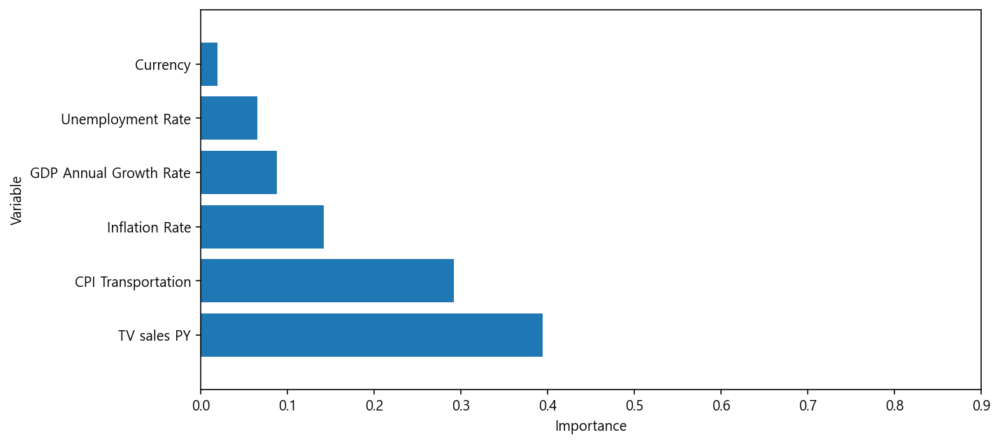

In [53]:
rfc_train_score = 0
rfc_test_score = 0
rfc_test_adj_score = 0
lgbm_train_score = 0
lgbm_test_score = 0

### 100회 실시 ###
for num in range (1,101,1):

    #X_train, X_test, y_train, y_test = train_test_split(df_data, df_target, shuffle=False, test_size=t_size)
    X_train, X_test, y_train, y_test = train_test_split(df_data, df_target,test_size=0.2)

    # 랜덤 포레스트를 사용한 경우의 중요 특성
    if max_feature_adj == 0 :
        rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
    elif max_feature_adj == 1 :
        ### TV sales PY 중요도 80% 초과시 민감도 위한 max_feature 수 조정
        rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200,max_features=max_feature_no)
    
    rfc.fit(X_train, y_train)

    y_pred = rfc.predict(X_test)
    df2 = pd.DataFrame()
    df2["test"]= pd.Series(y_test)
    df2["predict"] = pd.Series(y_pred)
    df2["num"] = num
    df2["accuracy"] = 1 - (abs(y_test-y_pred)/y_test)
    
    # 23.5.11 머신러닝 train test prediction 분석 데이터에 연/월/일 추가하기
    df2.insert(0, 'ds', df2['test'].map(df.set_index(prod_type)['ds'].groupby(level=0).first()))

    df_importance = pd.DataFrame({'feature':df_feature_names,'importance':rfc.feature_importances_, 
                                  'corr':np.array(corr_data.iloc[:,[0]].loc[df_feature_names].round(2)[prod_type])})
    df_importance = df_importance.sort_values('importance', ascending=False)
    
    df_importance.index.name = "index_s"    
        
    df_importance["train accuracy"] = rfc.score(X_train, y_train).round(3)
    df_importance["test accuracy"] = rfc.score(X_test, y_test).round(3)
    
    ### 수정 결정계수 분석을 위해 추가 21.12.13
    X_train2 = sm.add_constant(X_train)
    model2 = sm.OLS(y_train, X_train2)
    result = model2.fit()
    df_importance["test ols accuracy"] = result.rsquared.round(3)
    df_importance["test adj accuracy"] = result.rsquared_adj.round(3)
          
    df_importance["num"] = num    
    
    rfc_train_score = rfc_train_score + rfc.score(X_train, y_train).round(3)
    rfc_test_score = rfc_test_score + rfc.score(X_test, y_test).round(3)
    rfc_test_adj_score = rfc_test_adj_score + result.rsquared_adj.round(3)

    
    ### 구글트렌드 사용시에만 저장 24.06.12 ###
    if use_google_trends == "Y":
            
        if exclude_covid == "N": # COVID 제외 로직 추가
            # .to_csv 
            # 최초 생성 이후 mode는 append
            if not os.path.exists(file_dir5):
                df_importance.to_csv(file_dir5, index=True, mode='w', encoding='utf-8-sig')
            else:
                if num==1: 
                    df_importance.to_csv(file_dir5, index=True, mode='w', encoding='utf-8-sig')
                else:
                    df_importance.to_csv(file_dir5, index=True, mode='a', encoding='utf-8-sig', header=False)

            if not os.path.exists(file_dir6):
                df2.to_csv(file_dir6, index=True, mode='w', encoding='utf-8-sig')
            else:
                if num==1: 
                    df2.to_csv(file_dir6, index=True, mode='w', encoding='utf-8-sig')
                else:
                    df2.to_csv(file_dir6, index=True, mode='a', encoding='utf-8-sig', header=False)

        else:
            # .to_csv 
            # 최초 생성 이후 mode는 append
            if not os.path.exists(file_dir17):
                df_importance.to_csv(file_dir17, index=True, mode='w', encoding='utf-8-sig')
            else:
                if num==1: 
                    df_importance.to_csv(file_dir17, index=True, mode='w', encoding='utf-8-sig')
                else:
                    df_importance.to_csv(file_dir17, index=True, mode='a', encoding='utf-8-sig', header=False)

            if not os.path.exists(file_dir18):
                df2.to_csv(file_dir18, index=True, mode='w', encoding='utf-8-sig')
            else:
                if num==1: 
                    df2.to_csv(file_dir18, index=True, mode='w', encoding='utf-8-sig')
                else:
                    df2.to_csv(file_dir18, index=True, mode='a', encoding='utf-8-sig', header=False)     

                
    ###################################################
    ##################   light GBM   ##################
    ###################################################    
    
#     lgbm = LGBMRegressor()

#     lgbm.fit(X_train, y_train)
#     y_pred = lgbm.predict(X_test)
    
    
#     df3 = pd.DataFrame()
#     df3["test"]= pd.Series(y_test)
#     df3["predict"] = pd.Series(y_pred)
#     df3["num"] = num
#     df3["accuracy"] = 1 - (abs(y_test-y_pred)/y_test)

    
    
#     df_importance_2 = pd.DataFrame({'feature':df_feature_names,'importance':lgbm.feature_importances_})
#     df_importance_2 = df_importance_2.sort_values('importance', ascending=False)
        
#     df_importance_2.index.name = "index_s"
        
#     df_importance_2["train accuracy"] = lgbm.score(X_train, y_train).round(3)
#     df_importance_2["test accuracy"] = lgbm.score(X_test, y_test).round(3)
#     df_importance_2["num"] = num

    
#     lgbm_train_score = lgbm_train_score + lgbm.score(X_train, y_train).round(3)
#     lgbm_test_score = lgbm_test_score + lgbm.score(X_test, y_test).round(3)
    
#     # .to_csv 
#     # 최초 생성 이후 mode는 append
#     if not os.path.exists(file_dir25):
#         df_importance_2.to_csv(file_dir25, index=True, mode='w', encoding='utf-8-sig')
#     else:
#         if num==1: 
#             df_importance_2.to_csv(file_dir25, index=True, mode='w', encoding='utf-8-sig')
#         else:
#             df_importance_2.to_csv(file_dir25, index=True, mode='a', encoding='utf-8-sig', header=False)

#     if not os.path.exists(file_dir14):
#         df3.to_csv(file_dir14, index=True, mode='w', encoding='utf-8-sig')
#     else:
#         if num==1: 
#             df3.to_csv(file_dir14, index=True, mode='w', encoding='utf-8-sig')        
#         else:
#             df3.to_csv(file_dir14, index=True, mode='a', encoding='utf-8-sig', header=False)

            
    ###################################################
    ##########     SVM (서포트 벡터 머신)    ##########
    ###################################################

#     sc = StandardScaler()
#     X_train_2 = sc.fit_transform(X_train)
#     X_test_2 = sc.transform(X_test) 
    

#     svm_parameters = [{'kernel': ['linear'], 'gamma': [1], 
#                       'C': [100000, 10000000]}]
#     svm = GridSearchCV(SVR(), svm_parameters)
#     svm.fit(X_train_2, y_train)
#     #print(svm.best_score_.round(3))     # 최고 점수
#     #print(svm.best_params_)    # 최고 점수를 낸 파라미터


#     svm_reg = SVR(kernel=svm.best_params_['kernel'], C=svm.best_params_['C'], gamma=svm.best_params_['gamma']) #linear추가
#     svm_reg.fit(X_train_2,y_train)
#     y_pred_svr = svm_reg.predict(X_test_2)
    
#     df3 = pd.DataFrame()
#     df3["test"]= pd.Series(y_test)
#     df3["predict"] = pd.Series(y_pred_svr)
#     df3["num"] = num
#     df3["accuracy"] = 1 - (abs(y_test-y_pred)/y_test)
      
#     coef = abs(svm_reg.coef_.ravel())

  
#     df_importance_2 = pd.DataFrame({'feature':df_feature_names,'importance':coef })
#     df_importance_2 = df_importance_2.sort_values('importance', ascending=False)
  
        
#     df_importance_2["train accuracy"] = svm_reg.score(X_train_2, y_train).round(3)
#     df_importance_2["test accuracy"] = svm_reg.score(X_test_2, y_test).round(3)
#     df_importance_2["num"] = num
    
#     svm_train_score = svm_train_score + svm_reg.score(X_train_2, y_train).round(3)
#     svm_test_score = svm_test_score + svm_reg.score(X_test_2, y_test).round(3)
    
    # .to_csv 
    # 최초 생성 이후 mode는 append
#     if not os.path.exists(file_dir13):
#         df_importance_2.to_csv(file_dir7, index=True, mode='w', encoding='utf-8-sig')
#     else:
#         if num==1: 
#             df_importance_2.to_csv(file_dir7, index=True, mode='w', encoding='utf-8-sig')
#         else:
#             df_importance_2.to_csv(file_dir7, index=True, mode='a', encoding='utf-8-sig', header=False)
        
#     if not os.path.exists(file_dir14):
#         df3.to_csv(file_dir14, index=True, mode='w', encoding='utf-8-sig')
#     else:
#         if num==1: 
#             df3.to_csv(file_dir14, index=True, mode='w', encoding='utf-8-sig')        
#         else:
#             df3.to_csv(file_dir14, index=True, mode='a', encoding='utf-8-sig', header=False)
    
        
        
x = df_importance.feature
y = df_importance.importance
ypos = np.arange(len(x))

print("랜덤 포레스트 회귀")
print("Train 결정계수:", (rfc_train_score/num).round(3))
print("Test 결정계수:", (rfc_test_score/num).round(3))
plt.figure(figsize=(10,5))
plt.barh(x.iloc[0:], y.iloc[0:])
plt.yticks(ypos, x.iloc[0:])
plt.xlabel('Importance')
plt.ylabel('Variable')
plt.xlim(0, 0.9)
plt.ylim(-1, len(x))
plt.show()

# print("LGBM 회귀")
# print("Train 정확도:", (lgbm_train_score/num).round(3))
# print("Test 정확도:", (lgbm_test_score/num).round(3))

TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과


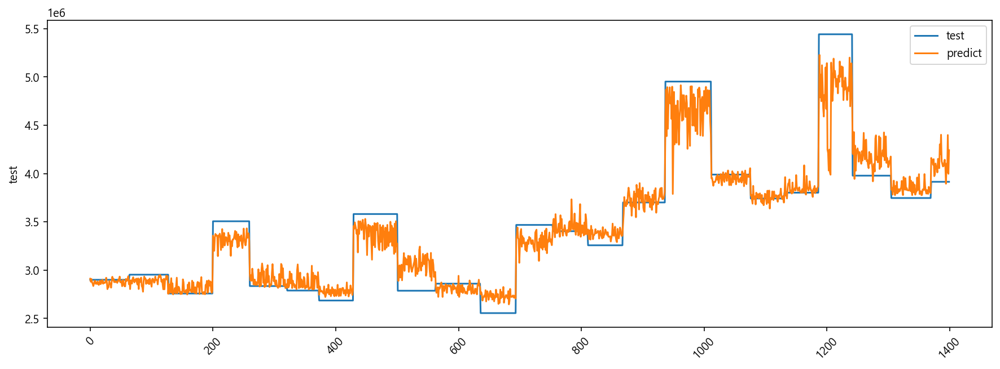

In [54]:
print("TV시장 판매수량 랜덤 포레스트 회귀: 예측 결과")

df_pred = pd.DataFrame()

if exclude_covid == "N": # COVID 제외 로직 추가           
    df_pred = pd.read_csv(file_dir6, index_col=0)
    df_pred = df_pred.sort_values(by='ds')
    df_pred.reset_index(drop=True, inplace=True)
    fig = plt.figure(figsize=(15, 5))
    sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
    sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
    plt.xticks(rotation=45)
    plt.show()

else:                    
    df_pred = pd.read_csv(file_dir18, index_col=0)
    df_pred = df_pred.sort_values(by='ds')
    df_pred.reset_index(drop=True, inplace=True)
    fig = plt.figure(figsize=(15, 5))
    sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
    sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
    plt.xticks(rotation=45)
    plt.show()

# [예측] 선행지표 기준 Q+1~Q+2 예측

In [29]:
# 파일 열기
df = pd.read_csv(file_dir)

df_TV_sales = pd.DataFrame()
df_features = pd.DataFrame()
df_features_mov = pd.DataFrame()

df_TV_sales = df.iloc[covid:m_rows_2_init,:3]
    
df_TV_sales = df_TV_sales.reset_index(drop=True)


# 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
df_features = df_org.iloc[covid:m_rows_2_init,3:org_feature_no+2]
df = pd.concat([df_TV_sales, df_features], axis=1)
        
        
# 23.4.12 변경
# df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

# df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
# df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
# df = pd.concat([df_TV_sales, df_features], axis=1)

# 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
# for item in range (2, mov_no+1, 1):

# df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

# df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
# df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
# df = pd.concat([df_TV_sales, df_features], axis=1)

for item in range (1, mov_no+1, 1):
    if item == 1:
        df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
        df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_2_init-1,3:org_feature_no+2], ignore_index=True)
        df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
        
    else:
        df_features_mov = df.iloc[covid:m_rows_2_init,3:org_feature_no+2].shift(item-1)
        df_features_mov = df_features_mov.fillna(method='bfill')

    new_cols = []
    for col in df_features_mov.columns:
        new_col = str(col + "_" + str(item))
        new_cols.append(new_col)

    df_features_mov.columns = new_cols
    
    df = pd.concat([df, df_features_mov], axis=1)
#변경 완료


# 23.4.12 추가
if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
    df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
    df = df.reset_index(drop=True)
        
print(df.shape)

(102, 66)


In [30]:
###################################################
### 법인별 선행지표 파일 입력으로 변경 21.11.30 ###
###################################################
df_features = pd.read_csv(file_dir10)

if use_google_trends == "N":
    df_features = df_features[df_features["feature_names"]!=gt_key]
    
print(df_features.shape)
df_feature_index = list(df_features["index_s"])
df_feature_names = list(df_features["feature_names"])

(10, 2)


In [31]:
df_feature_names

['TV sales PY',
 'Car Registrations',
 'Core Inflation Rate',
 'Crude Oil Production',
 'Economic Optimism Index',
 'Inflation Rate',
 'Interest Rate',
 'Producer Prices Change',
 'Wages In Manufacturing',
 'Worldcup Index']

In [32]:
m_feature = len(df_feature_names)
print(m_feature)
print(df_feature_index)

10
[2, 9, 12, 17, 20, 40, 42, 54, 63, 64]


In [33]:
############################################
### df_data 파일 입력으로 변경 21.11.30  ###
############################################
df_data = np.array(df.iloc[:,2:3])

for n in range(1,m_feature,1):
    
    df_data = np.concatenate((df_data, np.array(df.iloc[:,df_feature_index[n]:df_feature_index[n]+1])), axis=1)

print(df_data.shape)
df_target = np.array(df[prod_type])

(102, 10)


In [34]:
#df_norm_feature_names = list(df.columns[1:2]) + list(df_feature_names)  
df_norm_feature_names = list(df_feature_names)  
df_norm_data = df_data

In [35]:
df_norm = pd.DataFrame()
scaler = MinMaxScaler()
df_norm = pd.DataFrame(scaler.fit_transform(df_norm_data), columns=df_norm_feature_names)
df_norm.insert(0, prod_type, df[prod_type])
df_norm.insert(0, 'ds', df["ds"])
#df_data_trans = np.array(df_norm.iloc[:,2:])


##############################
### 스케일링값 저장        ###
##############################
### 구글트렌드 사용시에만 저장 24.06.12 ###
if use_google_trends == "Y":
    if exclude_covid == "N": # COVID 제외 로직 추가
        df_norm.to_csv(file_dir20, index=True, mode='w', encoding='utf-8-sig')

In [36]:
#X_train, X_test, y_train, y_test = train_test_split(df_data_trans, df_target, shuffle=False, test_size=t_size)
X_train, X_test, y_train, y_test = train_test_split(df_data, df_target, shuffle=False, test_size=t_size)
#X_train, X_test, y_train, y_test = train_test_split(df_data, df_target,test_size=t_size)

In [37]:
# # feature 수 조정 테스트 #
print("max_feature 조정:", max_feature_adj)
print("max_feature 갯수:", max_feature_no)

max_feature 조정: 0
max_feature 갯수: 0


랜덤 포레스트 회귀


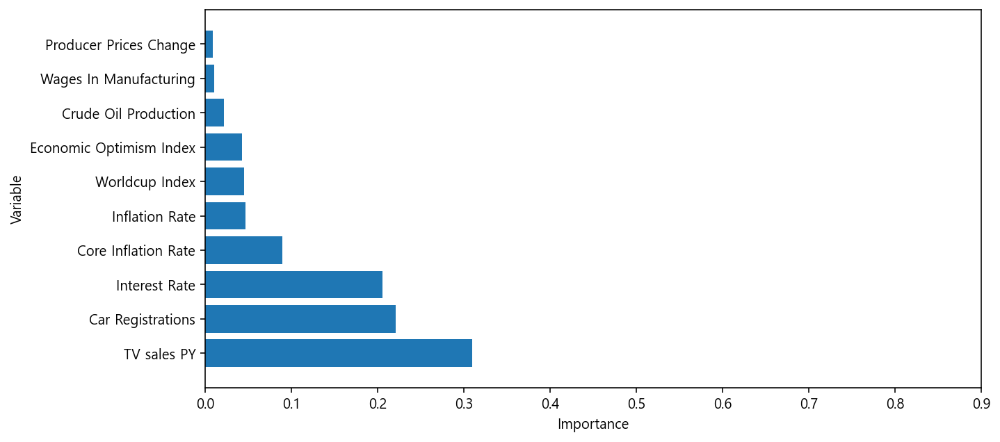

In [38]:
df_importance = pd.DataFrame()

# 랜덤 포레스트를 사용한 경우의 중요 특성
# 랜덤 포레스트를 사용한 경우의 중요 특성
if max_feature_adj == 0 :
    rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
elif max_feature_adj == 1 :
    ### TV sales PY 중요도 80% 초과시 민감도 위한 max_feature 수 조정
    rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200,max_features=max_feature_no)
        
rfc.fit(X_train, y_train)

df_importance = pd.DataFrame({'feature':df_feature_names,'importance':rfc.feature_importances_, 
                              'corr':np.array(corr_data.iloc[:,[0]].loc[df_feature_names].round(2)[prod_type])})

if exclude_covid == "N":
    df_importance.to_csv(file_dir7, index=True, mode='w', encoding='utf-8-sig')
# 23.4.27 COVID 기간 제외기준 추가
else:
    df_importance.to_csv(file_dir24, index=True, mode='w', encoding='utf-8-sig')

df_importance = df_importance.sort_values('importance', ascending=False)

x = df_importance.feature
y = df_importance.importance
ypos = np.arange(len(x))



print("랜덤 포레스트 회귀")
# print("Train 결정계수:", rfc.score(X_train, y_train).round(3))
plt.figure(figsize=(10,5))
plt.barh(x.iloc[0:], y.iloc[0:])
plt.yticks(ypos, x.iloc[0:])
plt.xlabel('Importance')
plt.ylabel('Variable')
plt.xlim(0, 0.9)
plt.ylim(-1, len(x))
plt.show()

In [39]:
y_pred = rfc.predict(X_test)
y_train_pred = np.concatenate((y_train, y_pred))

corr: [0.69] / importance: 30.9 %


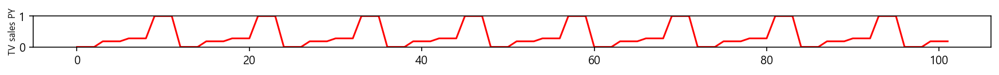

corr: [0.54] / importance: 22.1 %


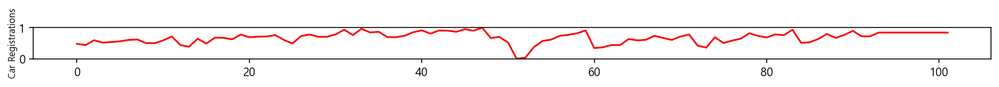

corr: [-0.53] / importance: 8.9 %


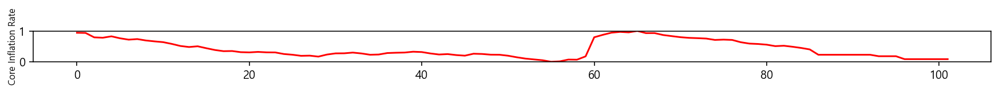

corr: [0.27] / importance: 2.1999999999999997 %


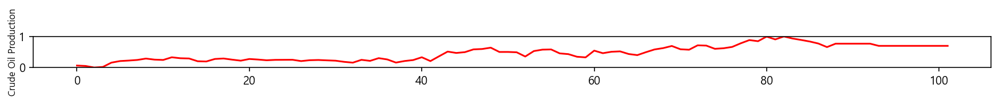

corr: [0.43] / importance: 4.3 %


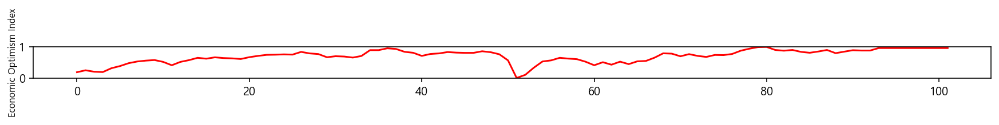

corr: [-0.52] / importance: 4.7 %


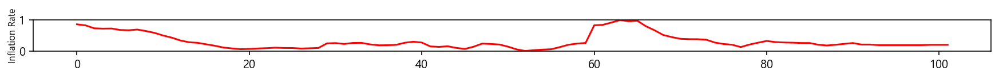

corr: [-0.57] / importance: 20.599999999999998 %


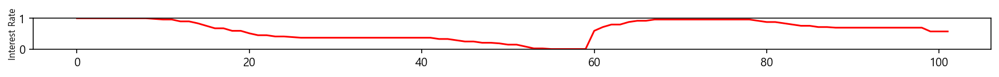

corr: [-0.07] / importance: 0.8999999999999999 %


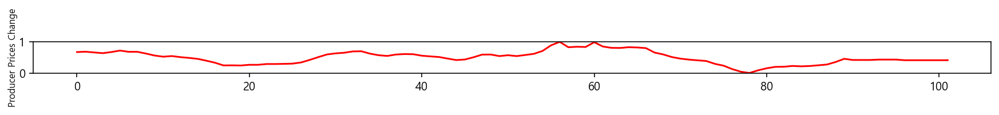

corr: [0.03] / importance: 1.0 %


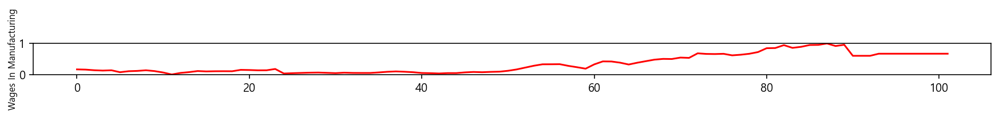

corr: [0.15] / importance: 4.5 %


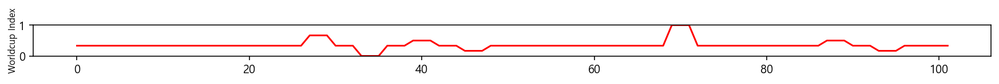

In [40]:
for n in range(1,m_feature+1,1):

    tv_sales = np.array(df_norm.iloc[:,1:2])
    x_feature = np.array(df_norm.iloc[:,n+1:n+2])
    x_feature_name = df_norm.columns[n+1:n+2]
    # print("정확도:", rfc.score(tv_sales, x_feature))
    #print(x_feature_name)
    #print("R2 Score:",r2_score(tv_sales, x_feature).round(3))
    plt.figure(figsize=(15, 0.5))
#     plt.plot(y_train_pred/(2*10**7), c='b')
    plt.plot(x_feature, c='r')
    plt.ylim((0,1))
    plt.ylabel(x_feature_name[0], labelpad=1, fontdict={'size': 8})
    values = range(len(df["ds"]))
    #plt.xticks(values,df["ds"], rotation='vertical')
    print("corr:", corr_data.xs(x_feature_name[0]).values.round(2), "/ importance:", df_importance["importance"].loc[n-1].round(3)*100,"%")
    plt.show()   

랜덤 포레스트 회귀: 예측 결과


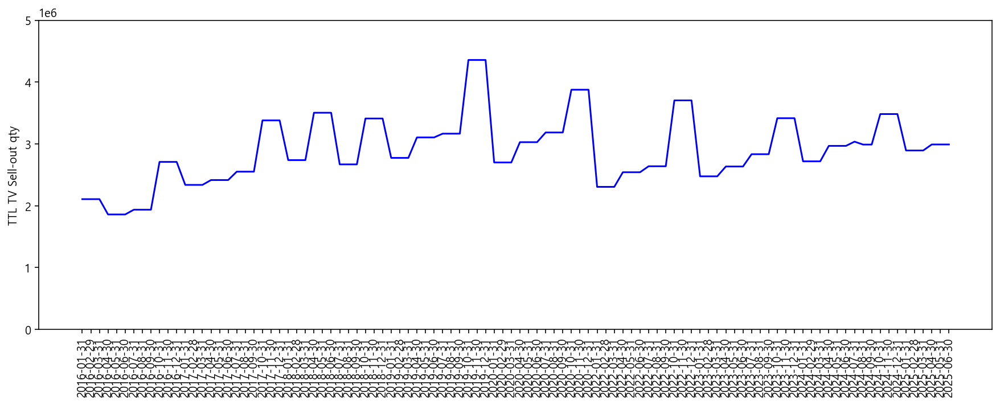

In [41]:
print("랜덤 포레스트 회귀: 예측 결과")

plt.figure(figsize=(15, 5))
plt.plot(y_train_pred, c='b')
plt.ylabel("TTL TV Sell-out qty")
plt.ylim((0,max_sales))
values = range(len(df["ds"]))
plt.xticks(values,df["ds"], rotation='vertical')
plt.show()

In [42]:
y_pred

array([3036126.60422, 2988762.67422, 2988762.67422, 3482130.82   ,
       3482130.82   , 3482130.82   , 2892996.2    , 2892996.2    ,
       2892996.2    , 2990379.68   , 2990379.68   , 2990379.68   ])

In [43]:
if pred_iloc == 0:
    ### 23.01.26 추가 - 시점에 따라 iloc 변경 ###
    # Gfk데이터가 분기마감되었을 때
    y_pred_2 = y_pred 
else:    
    # Gfk데이터가 분기마감+1개월일 때
    y_pred_2 = np.append(np.array(df.iloc[m_rows-pred_iloc:m_rows,1:2]), y_pred)
    # Gfk데이터가 분기마감+2개월일 때
# elif pred_iloc == 1:   
#     y_pred_2 = np.append(np.array(df.iloc[m_rows-pred_iloc+1:m_rows,1:2]), y_pred)
    #y_pred_2 = y_pred[1:]
y_pred_2

array([3036126.60422, 2988762.67422, 2988762.67422, 3482130.82   ,
       3482130.82   , 3482130.82   , 2892996.2    , 2892996.2    ,
       2892996.2    , 2990379.68   , 2990379.68   , 2990379.68   ])

In [49]:
### 21.11.30 추가 - 시점에 따라 iloc 변경 ###
### 24.01.26 추가 - Q+4 (현재기준 Q+3)로 예측구간 확대
### 24.10.07 추가 - Q+5 로 예측구간 확대
y_pred_q1 = y_pred_2[q_loc:q_loc+3].mean().round(0)
y_pred_q2 = y_pred_2[q_loc+3:q_loc+6].mean().round(0)
y_pred_q3 = y_pred_2[q_loc+6:q_loc+9].mean().round(0)
y_pred_q4 = y_pred_2[q_loc+9:q_loc+12].mean().round(0)
y_pred_q5 = y_pred_2[q_loc+12:q_loc+15].mean().round(0)
y_pred_q6 = y_pred_2[q_loc+15:q_loc+18].mean().round(0)
print(y_pred_q1, y_pred_q2, y_pred_q3, y_pred_q4, y_pred_q5, y_pred_q6)

### 21.11.30 추가 ###
### 24.01.26 추가 - Q+4 (현재기준 Q+3)로 예측구간 확대
### 24.10.07 추가 - Q+5 로 예측구간 확대
df4 = pd.DataFrame()
df4["predict_Q1"] = pd.Series(y_pred_q1)
df4["predict_Q2"] = pd.Series(y_pred_q2)
df4["predict_Q3"] = pd.Series(y_pred_q3)
df4["predict_Q4"] = pd.Series(y_pred_q4)
df4["predict_Q5"] = pd.Series(y_pred_q5)
df4["predict_Q6"] = pd.Series(y_pred_q6)


### 구글트렌드 사용/미사용 추가 24.06.12 ###            
if exclude_covid == "Y":
    if google_trends_yn == "Y":
        if use_google_trends == "Y":
            df4["predict_method"] = "RandomForest_wo_COVID"
        else:
            df4["predict_method"] = "RandomForest_wo_COVID_wo_GT"
    else:
        df4["predict_method"] = "RandomForest_wo_COVID"

else:
    if google_trends_yn == "Y":
        if use_google_trends == "Y":
            df4["predict_method"] = "RandomForest"  
        else:
            df4["predict_method"] = "RandomForest_wo_GT"
    else:
        df4["predict_method"] = "RandomForest"
        
            
df4["last update_date"] = time.strftime('%Y-%m-%d %H:%M', time.localtime(time.time()))
# .to_csv
if not os.path.exists(file_dir9):
    df4.to_csv(file_dir9, index=True, mode='w', encoding='utf-8-sig')    
else:
    if first_fcst == "Y":
        df4.to_csv(file_dir9, index=True, mode='w', encoding='utf-8-sig')
    else:
        df4.to_csv(file_dir9, index=True, mode='a', encoding='utf-8-sig', header=False)

3004551.0 3482131.0 2892996.0 2990380.0


# ML input과 중요도를 TV시장지수파일로 변환

In [ ]:
if exclude_covid == "N" and use_google_trends == "Y":
    
    df_test = pd.DataFrame()
    df_test_f = pd.DataFrame()

    ###################
    ### 필요시 변경 ###
    ###################
    df_test_f = pd.read_csv(file_dir7)  
    m_rows = 0
    m_cols = 2     
    m_rows_2 = len(df_test_f)+2
    m_cols_2 = len(df_test_f.columns)

    df_test_f = df_test_f.iloc[m_rows:m_rows_2,m_cols:m_cols_2]
    df_test_f = df_test_f.transpose()


    df_test = pd.read_csv(file_dir20)   
    m_rows = 0
    m_cols = 1     
    m_rows_2 = len(df_test)+3
    m_cols_2 = len(df_test.columns)
    print("rows:",m_rows, m_rows_2)
    print("columns:",m_cols, m_cols_2)

    df_test = df_test.iloc[m_rows:m_rows_2,m_cols:m_cols_2]

    wb = load_workbook(file_dir16)
    ws = wb['test_composite']

    try:
        ws1 = wb['test']
        ws1.delete_rows(1,m_rows_2-1)
    except:
        ws1 = wb.create_sheet('test')

    for r in dataframe_to_rows(df_test, index=False, header=True):
        ws1.append(r)


    try:
        ws2 = wb['f']
        ws2.delete_rows(1,3)
    except:
        ws2 = wb.create_sheet('f')

    for r in dataframe_to_rows(df_test_f, index=False, header=True):
        ws2.append(r)


    # 함수 적용
    for j in range(m_cols, m_cols_2, 1):
        for i in range(m_rows+1, m_rows_2-1, 1):
            #ws.cell(row=i+4, column=j).value = "=test!"+chr(64+j)+str(i+1)+""  
            # feature name 부터 가져옴 23.12.21
            ws.cell(row=i+3, column=j).value = ws1.cell(row=i, column=j).value

    # 함수 적용
    for j in range(m_cols, m_cols_2-2, 1):
        for i in range(2, 4, 1):
            ws.cell(row=i-1, column=j+2).value = "=f!"+chr(64+j)+str(i)+""

            
    # 함수 적용 추가 23.12.21
    for j in range(m_cols, m_cols_2-2, 1):
        for i in range(4, 5, 1):
            ws.cell(row=i-1, column=j+2).value = "=IF("+chr(64+j+2)+str(2)+">0,"+chr(64+j+2)+str(1)+",-"+chr(64+j+2)+str(1)+")"
            

    for j in range(m_cols, m_cols_2-2, 1):
        for i in range(5, 6, 1):
            ws.cell(row=i-1, column=j+m_cols_2-1).value = "="+chr(64+j+2)+str(4)+""
    

    #print(chr(65)+chr(65))
        
    if (m_cols_2-3)*2+3 <= 26:
        ws.cell(row=3, column=(m_cols_2-3)*2+3).value = "=CORREL(B5:B"+str(m_rows_init+4)+","+chr(64+((m_cols_2-3)*2+3))+"5:"+chr(64+((m_cols_2-3)*2+3))+str(m_rows_init+4)+")"
        ws.cell(row=4, column=(m_cols_2-3)*2+3).value = "Composite"
    elif (m_cols_2-3)*2+3 <= 26*2:
        ws.cell(row=3, column=(m_cols_2-3)*2+3).value = "=CORREL(B5:B"+str(m_rows_init+4)+",A"+chr(64-(26)+((m_cols_2-3)*2+3))+"5:A"+chr(64-(26)+((m_cols_2-3)*2+3))+str(m_rows_init+4)+")"
        ws.cell(row=4, column=(m_cols_2-3)*2+3).value = "Composite"
#     for j in range(m_cols, m_cols_2, 1):
#         ws.cell(row=4, column=j).value = ws1.cell(row=1, column=j).value     

    ##########################################
    ###    시장지수 수식 추가 23.05.17     ###
    ##########################################
    # 이후로 붙혀넣기 
    # Feature 함수 적용
    for j in range(m_cols_2, m_cols_2+m_cols_2-3, 1):
        for i in range(m_rows+1, m_rows_2-2, 1):
            ws.cell(row=i+4, column=j).value = "="+chr(64+j-m_cols_2+3)+str(i+4)+"*"+chr(64+j-m_cols_2+3)+"$3"
            

    # Composite 함수 적용
    for j in range(m_cols_2+m_cols_2-3, m_cols_2+m_cols_2-2, 1):
        for i in range(m_rows+1, m_rows_2-2, 1):
            if j-1 <= 26:
                ws.cell(row=i+4, column=j).value = "=AVERAGE("+chr(64+j-m_cols_2+3)+str(i+4)+":"+chr(64+j-1)+str(i+4)+")"
            elif j-1 <= 26*2:
                ws.cell(row=i+4, column=j).value = "=AVERAGE("+chr(64+j-m_cols_2+3)+str(i+4)+":A"+chr(64+j-26-1)+str(i+4)+")"
    
        
    # 파일 저장
    wb.save(file_dir16)
    wb.close()
    
    # 데이터프레임으로 변환 후 csv로 저장
    df_region_new = pd.DataFrame()

    app = xw.App(visible=False)
    wbxl= xw.Book(file_dir16)
    sheet = wbxl.sheets['test_composite']
    df_region_new = sheet.range('A4').options(pd.DataFrame, index=False, expand='table').value
    wbxl.close()
    app.kill()

    df_region_new.to_csv(file_dir21, index=False, mode='w', encoding='utf-8-sig')

    
#COVID_YN 리셋
# exclude_covid = exclude_covid_org

# [학습] TV시장지수 기준 머신러닝 학습

In [ ]:
##############################
### item parcelling 테스트 ###
##############################

df = pd.read_csv(file_dir21)

m_rows = m_rows_init_org    
m_rows_2 = m_rows_2_init_org

# if subsidiary_name == "12.AP":
#     m_rows = m_rows - 12    
#     m_rows_2 = m_rows_2 - 12 

# if subsidiary_name == "10.SP" or subsidiary_name == "16.CL": # 브라질
#     covid_start = covid_start + 12 
#     covid_end = covid_end + 12
    
if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
    m_rows = m_rows + 12         # 2020.01
    m_rows_2 = m_rows_2 + 12     # 2020.12
    

df = df.iloc[:m_rows,:] # 월에 따라 변경
print(df.shape)
############################################
### df_data 파일 입력으로 변경 21.11.30  ###
############################################
df_data = np.array(pd.DataFrame(df["Composite"]))
df_target = np.array(df[prod_type])

scaler = MinMaxScaler()
df_norm = pd.DataFrame(scaler.fit_transform(df_data))
df_norm.insert(0, 'ds', df["ds"])
df_data_trans = np.array(df_norm.iloc[:,1:])

In [ ]:
rfc_train_score = 0
rfc_test_score = 0
rfc_test_adj_score = 0
svm_train_score = 0
svm_test_score = 0

### 100회 실시 ###
for num in range (1,101,1):

    #X_train, X_test, y_train, y_test = train_test_split(df_data, df_target, shuffle=False, test_size=t_size)
    X_train, X_test, y_train, y_test = train_test_split(df_data_trans, df_target,test_size=0.2)

    # 랜덤 포레스트를 사용한 경우의 중요 특성
    rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
    rfc.fit(X_train, y_train)

    y_pred = rfc.predict(X_test)
    df2 = pd.DataFrame()
    df2["test"]= pd.Series(y_test)
    df2["predict"] = pd.Series(y_pred)
    df2["num"] = num
    df2["accuracy"] = 1 - (abs(y_test-y_pred)/y_test)
    
    # 23.5.11 머신러닝 train test prediction 분석 데이터에 연/월/일 추가하기
    df2.insert(0, 'ds', df2['test'].map(df.set_index(prod_type)['ds'].groupby(level=0).first()))

    df_importance = pd.DataFrame({'feature':'composite','importance':rfc.feature_importances_})
    df_importance = df_importance.sort_values('importance', ascending=False)
    
    df_importance.index.name = "index_s"
    
        
    df_importance["train accuracy"] = rfc.score(X_train, y_train).round(3)
    df_importance["test accuracy"] = rfc.score(X_test, y_test).round(3)
    
    ### 수정 결정계수 분석을 위해 추가 21.12.13
    X_train2 = sm.add_constant(X_train)
    model2 = sm.OLS(y_train, X_train2)
    result = model2.fit()
    df_importance["test ols accuracy"] = result.rsquared.round(3)
    df_importance["test adj accuracy"] = result.rsquared_adj.round(3)
          
    df_importance["num"] = num
    
    
    rfc_train_score = rfc_train_score + rfc.score(X_train, y_train).round(3)
    rfc_test_score = rfc_test_score + rfc.score(X_test, y_test).round(3)
    rfc_test_adj_score = rfc_test_adj_score + result.rsquared_adj.round(3)

    # .to_csv 
    # 최초 생성 이후 mode는 append      
    if not os.path.exists(file_dir11):
        df_importance.to_csv(file_dir11, index=True, mode='w', encoding='utf-8-sig')
    else:
        if num==1: 
            df_importance.to_csv(file_dir11, index=True, mode='w', encoding='utf-8-sig')
        else:
            df_importance.to_csv(file_dir11, index=True, mode='a', encoding='utf-8-sig', header=False)
    
    # .to_csv 
    # 최초 생성 이후 mode는 append      
    if not os.path.exists(file_dir8):
        df2.to_csv(file_dir8, index=True, mode='w', encoding='utf-8-sig')
    else:
        if num==1: 
            df2.to_csv(file_dir8, index=True, mode='w', encoding='utf-8-sig')
        else:
            df2.to_csv(file_dir8, index=True, mode='a', encoding='utf-8-sig', header=False)
            

                    
    ###################################################
    ##################   light GBM   ##################
    ###################################################    
    
    lgbm = LGBMRegressor()

    lgbm.fit(X_train, y_train)
    y_pred = lgbm.predict(X_test)
    
    
    df3 = pd.DataFrame()
    df3["test"]= pd.Series(y_test)
    df3["predict"] = pd.Series(y_pred)
    df3["num"] = num
    df3["accuracy"] = 1 - (abs(y_test-y_pred)/y_test)
    
    lgbm_test_score = r2_score(y_test, y_pred)
    
    
    if not os.path.exists(file_dir12):
        df3.to_csv(file_dir12, index=True, mode='w', encoding='utf-8-sig')
    else:
        if num==1: 
            df3.to_csv(file_dir12, index=True, mode='w', encoding='utf-8-sig')        
        else:
            df3.to_csv(file_dir12, index=True, mode='a', encoding='utf-8-sig', header=False)

    
    
    ###################################################
    ##########     SVM (서포트 벡터 머신)    ##########
    ###################################################

#     sc = StandardScaler()
#     X_train_2 = sc.fit_transform(X_train)
#     X_test_2 = sc.transform(X_test)    
 
    

    svm_parameters = [{'kernel': ['linear'], 'gamma': [0.001, 0.01, 0.1, 1], 
                      'C': [100000, 1000000, 10000000]}]
    svm = GridSearchCV(SVR(), svm_parameters)
    svm.fit(X_train, y_train)
#     print(svm.best_score_.round(3))     # 최고 점수
#     print(svm.best_params_)    # 최고 점수를 낸 파라미터


    svm_reg = SVR(kernel=svm.best_params_['kernel'], C=svm.best_params_['C'], gamma=svm.best_params_['gamma']) #linear추가
    svm_reg.fit(X_train,y_train)
    y_pred_svr = svm_reg.predict(X_test)
    
    df5 = pd.DataFrame()
    df5["test"]= pd.Series(y_test)
    df5["predict"] = pd.Series(y_pred_svr)
    df5["num"] = num
    df5["accuracy"] = 1 - (abs(y_test-y_pred_svr)/y_test)
    
    # 23.5.11 머신러닝 train test prediction 분석 데이터에 연/월/일 추가하기
    df5.insert(0, 'ds', df2['test'].map(df.set_index(prod_type)['ds'].groupby(level=0).first()))
      
    coef = abs(svm_reg.coef_.ravel())

  
    df_importance_2 = pd.DataFrame({'feature':'composite','importance':coef })
    df_importance_2 = df_importance_2.sort_values('importance', ascending=False)
  
        
    df_importance_2["train accuracy"] = svm_reg.score(X_train, y_train).round(3)
    df_importance_2["test accuracy"] = svm_reg.score(X_test, y_test).round(3)
    df_importance_2["num"] = num
    
    svm_train_score = svm_train_score + svm_reg.score(X_train, y_train).round(3)
    svm_test_score = svm_test_score + svm_reg.score(X_test, y_test).round(3)
    
    # .to_csv 
    # 최초 생성 이후 mode는 append
    if not os.path.exists(file_dir15):
        df_importance_2.to_csv(file_dir15, index=True, mode='w', encoding='utf-8-sig')
    else:
        if num==1: 
            df_importance_2.to_csv(file_dir15, index=True, mode='w', encoding='utf-8-sig')
        else:
            df_importance_2.to_csv(file_dir15, index=True, mode='a', encoding='utf-8-sig', header=False)
        
    if not os.path.exists(file_dir13):
        df5.to_csv(file_dir13, index=True, mode='w', encoding='utf-8-sig')
    else:
        if num==1: 
            df5.to_csv(file_dir13, index=True, mode='w', encoding='utf-8-sig')        
        else:
            df5.to_csv(file_dir13, index=True, mode='a', encoding='utf-8-sig', header=False)
    
                 
            
print("랜덤 포레스트 회귀")
print("Train 결정계수:", (rfc_train_score/num).round(3))
print("Test 결정계수:", (rfc_test_score/num).round(3))

print("light GBM")
#print("Train 정확도:", (lgbm_train_score/num).round(3))
print("Test 정확도:", (lgbm_test_score/num).round(3))

print("SVM 서포트 벡터 머신")
print("Train 정확도:", (svm_train_score/num).round(3))
print("Test 정확도:", (svm_test_score/num).round(3))

In [ ]:
print("TV시장 판매수량 시장지수 회귀: 예측 결과")

df_pred = pd.DataFrame()

if exclude_covid == "N": # COVID 제외 로직 추가           
    df_pred = pd.read_csv(file_dir8, index_col=0)
    df_pred = df_pred.sort_values(by='ds')
    df_pred.reset_index(drop=True, inplace=True)
    fig = plt.figure(figsize=(15, 5))
    sns.lineplot(data=df_pred, x=df_pred.index, y='test', label='test')
    sns.lineplot(data=df_pred, x=df_pred.index, y='predict', label='predict')
    plt.xticks(rotation=45)
    plt.show()

# [예측] TV시장지수 기준 Q+1~Q+2 예측

In [ ]:
##############################
### item parcelling 테스트 ###
##############################

df = pd.read_csv(file_dir21)
    
m_rows = m_rows_init_org    
m_rows_2 = m_rows_2_init_org 

# if subsidiary_name == "12.AP":
#     m_rows = m_rows - 12    
#     m_rows_2 = m_rows_2 - 12 

if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
    m_rows = m_rows + 12         
    m_rows_2 = m_rows_2 + 12     

df = df.iloc[:m_rows_2,:]
print(df.shape)

############################################
### df_data 파일 입력으로 변경 21.11.30  ###
############################################
df_data = np.array(pd.DataFrame(df["Composite"]))
df_target = np.array(df[prod_type])

scaler = MinMaxScaler()
df_norm = pd.DataFrame(scaler.fit_transform(df_data))
df_norm.insert(0, 'ds', 1)
df_data_trans = np.array(df_norm.iloc[:,1:])

#X_train, X_test, y_train, y_test = train_test_split(df_data_trans, df_target, test_size=t_size)
X_train, X_test, y_train, y_test = train_test_split(df_data_trans, df_target, shuffle=False, test_size=t_size)
#X_train, X_test, y_train, y_test = train_test_split(df_data, df_target, shuffle=False, test_size=t_size)
#X_train, X_test, y_train, y_test = train_test_split(df_data, df_target,test_size=t_size)

In [ ]:
# 랜덤 포레스트를 사용한 경우의 중요 특성
rfc = RandomForestRegressor(n_estimators=100,random_state=100,max_depth=200)
rfc.fit(X_train, y_train)

df_importance = pd.DataFrame({'feature':"composite",'importance':rfc.feature_importances_ })
df_importance = df_importance.sort_values('importance', ascending=False)
x = df_importance.feature
y = df_importance.importance
ypos = np.arange(len(x))

print("랜덤 포레스트 회귀")
#print("Test 결정계수:", (rfc_test_score/num).round(3))
#print("Train 정확도:", rfc.score(X_train, y_train).round(3))
#print("Test 정확도:", rfc.score(X_test, y_test).round(3))
# plt.figure(figsize=(10,1))
# plt.barh(x.iloc[0:], y.iloc[0:])
# plt.yticks(ypos, x.iloc[0:])
# plt.xlabel('Importance')
# plt.ylabel('Variable')
# plt.xlim(0, 1)
# plt.ylim(-1, len(x))
# plt.show()

y_pred = rfc.predict(X_test)
y_train_pred = np.concatenate((y_train, y_pred))


###################################################
##########     SVM (서포트 벡터 머신)    ##########
###################################################


svm_parameters = [{'kernel': ['linear'], 'gamma': [0.001, 0.01, 0.1, 1], 
                  'C': [100000, 1000000, 10000000]}]
svm = GridSearchCV(SVR(), svm_parameters)
svm.fit(X_train, y_train)
#print(svm.best_score_.round(3))     # 최고 점수
#print(svm.best_params_)    # 최고 점수를 낸 파라미터


svm_reg = SVR(kernel=svm.best_params_['kernel'], C=svm.best_params_['C'], gamma=svm.best_params_['gamma']) #linear추가
svm_reg.fit(X_train,y_train)
y_pred_svr = svm_reg.predict(X_test)
y_train_pred_svr = np.concatenate((y_train, y_pred_svr))


print("랜덤 포레스트 회귀: 예측 결과")

plt.figure(figsize=(15, 3))
plt.plot(y_train_pred, c='b')
plt.ylabel("TTL TV Sell-out qty")
plt.ylim((0,max_sales))
values = range(len(df["ds"]))
plt.xticks(values,df["ds"], rotation='vertical')
plt.show()

plt.figure(figsize=(15, 3))
plt.plot(y_train_pred_svr, c='b')
plt.ylabel("TTL TV Sell-out qty")
plt.ylim((0,max_sales))
values = range(len(df["ds"]))
plt.xticks(values,df["ds"], rotation='vertical')
plt.show()

plt.figure(figsize=(15, 3))
plt.plot(df_data_trans, c='r')
plt.ylim((-0.5,1))
plt.ylabel("composite", labelpad=23)
values = range(len(df["ds"]))
plt.xticks(values,df["ds"], rotation='vertical')
plt.show() 

In [ ]:
#미국 coverage 변경 반영
# if subsidiary_name == "02.US":
#    y_pred = y_pred * 0.918
#    y_pred_svr = y_pred_svr * 0.918

print(y_pred.round(0))
print(y_pred_svr.round(0))

In [ ]:
if pred_iloc == 0:
    ### 23.01.26 추가 - 시점에 따라 iloc 변경 ###
    # Gfk데이터가 분기마감되었을 때
    y_pred_2 = y_pred 
else:
    # Gfk데이터가 분기마감+1개월일 때
    y_pred_2 = np.append(np.array(df.iloc[m_rows-pred_iloc:m_rows,1:2]), y_pred)
# elif pred_iloc == 2:
#     # Gfk데이터가 분기마감+2개월일 때
#     y_pred_2 = np.append(np.array(df.iloc[m_rows-pred_iloc+1:m_rows,1:2]), y_pred)



### 21.11.30 추가 - 시점에 따라 iloc 변경 ###
### 24.01.26 추가 - Q+4 (현재기준 Q+3)로 예측구간 확대 
### 24.10.07 추가 - Q+5 로 예측구간 확대
y_pred_q1 = y_pred_2[q_loc:q_loc+3].mean().round(0)
y_pred_q2 = y_pred_2[q_loc+3:q_loc+6].mean().round(0)
y_pred_q3 = y_pred_2[q_loc+6:q_loc+9].mean().round(0)
y_pred_q4 = y_pred_2[q_loc+9:q_loc+12].mean().round(0)
y_pred_q5 = y_pred_2[q_loc+12:q_loc+15].mean().round(0)
y_pred_q6 = y_pred_2[q_loc+15:q_loc+18].mean().round(0)


if pred_iloc == 0:   
    ### 23.01.26 추가 - 시점에 따라 iloc 변경 ###
    # Gfk데이터가 분기마감되었을 때
    y_pred_svr_2 = y_pred_svr
else:
    # Gfk데이터가 분기마감+1개월일 때
    y_pred_svr_2 = np.append(np.array(df.iloc[m_rows-pred_iloc:m_rows,1:2]), y_pred_svr)
#     elif pred_iloc == 2:
#         # Gfk데이터가 분기마감+2개월일 때
#         y_pred_svr_2 = np.append(np.array(df.iloc[m_rows-pred_iloc+1:m_rows,1:2]), y_pred_svr)
y_pred_svr_2

y_pred_svr_q1 = y_pred_svr_2[q_loc:q_loc+3].mean().round(0)
y_pred_svr_q2 = y_pred_svr_2[q_loc+3:q_loc+6].mean().round(0)
y_pred_svr_q3 = y_pred_svr_2[q_loc+6:q_loc+9].mean().round(0)
y_pred_svr_q4 = y_pred_svr_2[q_loc+9:q_loc+12].mean().round(0)
y_pred_svr_q5 = y_pred_svr_2[q_loc+12:q_loc+15].mean().round(0)
y_pred_svr_q6 = y_pred_svr_2[q_loc+15:q_loc+18].mean().round(0)

print(y_pred_q1, y_pred_q2, y_pred_q3, y_pred_q4, y_pred_q5, y_pred_q6)
print(y_pred_svr_q1, y_pred_svr_q2, y_pred_svr_q3, y_pred_svr_q4, y_pred_svr_q5, y_pred_svr_q6)


In [ ]:
### 21.11.30 추가 ###
### 24.01.26 추가 - Q+4 (현재기준 Q+3)로 예측구간 확대
### 24.10.07 추가 - Q+5 로 예측구간 확대
df4 = pd.DataFrame()
df4["predict_Q1"] = pd.Series(y_pred_q1)
df4["predict_Q2"] = pd.Series(y_pred_q2)
df4["predict_Q3"] = pd.Series(y_pred_q3)
df4["predict_Q4"] = pd.Series(y_pred_q4)
df4["predict_Q5"] = pd.Series(y_pred_q5)
df4["predict_Q6"] = pd.Series(y_pred_q6)

df4["predict_method"] = "RandomForest_composite"
df4["last update_date"] = time.strftime('%Y-%m-%d %H:%M', time.localtime(time.time()))
# .to_csv
if not os.path.exists(file_dir9):
    df4.to_csv(file_dir9, index=True, mode='w', encoding='utf-8-sig')    
else:
    if first_fcst == "Y":
        df4.to_csv(file_dir9, index=True, mode='w', encoding='utf-8-sig')
    else:
        df4.to_csv(file_dir9, index=True, mode='a', encoding='utf-8-sig', header=False)

df4["predict_Q1"] = pd.Series(y_pred_svr_q1)
df4["predict_Q2"] = pd.Series(y_pred_svr_q2)
df4["predict_Q3"] = pd.Series(y_pred_svr_q3)
df4["predict_Q4"] = pd.Series(y_pred_svr_q4)
df4["predict_Q5"] = pd.Series(y_pred_svr_q5)

df4["predict_method"] = "RandomForest_composite_SVM"
df4["last update_date"] = time.strftime('%Y-%m-%d %H:%M', time.localtime(time.time()))
# .to_csv
if not os.path.exists(file_dir9):
    df4.to_csv(file_dir9, index=True, mode='w', encoding='utf-8-sig')    
else:
    df4.to_csv(file_dir9, index=True, mode='a', encoding='utf-8-sig', header=False)

# 시장지수파일만 생성 한번에 실행하기

In [ ]:
for sub_i in tqdm.tqdm_notebook(range(1,subs_no,1)):
# for sub_i in tqdm.tqdm_notebook(range(10,11,1)):
    
##############################################################################################################
### sub_i = CI 1, US 2, DG 3, ES 4, FS 5, IS 6, PL 7, UK 8, MS 9, SP 10, TK 11, AP 12, VH 13, IL 14, RA 15, CL 16  ###
##############################################################################################################


##### DX Signal 법인만 추출 #####
# dx_signal_sub = [1]
# for sub_i in tqdm.tqdm_notebook(dx_signal_sub):
#################################


    m_rows_init = m_rows_init_org
    m_rows_2_init = m_rows_2_init_org

    file_dir_sub = r"D:\05. SCM DX개선\{}\0.ALL\subsidiary_name.csv".format(PG_dir)
    # 법인정보 가져오기 #
    df_subsidiary = pd.DataFrame()
    df_subsidiary = pd.read_csv(file_dir_sub)
    print("-------")
    print(df_subsidiary.shape)
    df_subsidiary_name = list(df_subsidiary["subsidiary_name"])
    subsidiary_name = df_subsidiary_name[sub_i-1]
    print("법인명: "+subsidiary_name)
    
    file_dir = "D:/05. SCM DX개선/{}/{}/Raw/historical_indicator_Q.csv"
    file_dir2 = "D:/05. SCM DX개선/{}/{}/corr_data.csv"
    file_dir3 = "D:/05. SCM DX개선/{}/{}/regression_data.csv"
    file_dir4 = "D:/05. SCM DX개선/{}/{}/regression_pred_data.csv"
    file_dir5 = "D:/05. SCM DX개선/{}/{}/regression_data_m.csv"
    file_dir6 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m.csv"
    file_dir7 = "D:/05. SCM DX개선/{}/{}/regression_data_m_f.csv"
    file_dir8 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_c.csv"
    file_dir9 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_fn.csv"
    file_dir10 = "D:/05. SCM DX개선/{}/{}/Raw/feature_names.csv"
    file_dir11 = "D:/05. SCM DX개선/{}/{}/regression_data_m_c.csv"
    file_dir12 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_c_lgbm.csv"
    file_dir13 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_c_svm.csv"
    file_dir14 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_lgbm.csv"
    file_dir15 = "D:/05. SCM DX개선/{}/{}/regression_data_m_c_svm.csv"
    file_dir16 = "D:/05. SCM DX개선/{}/{}/test_composite.xlsx"
    file_dir17 = "D:/05. SCM DX개선/{}/{}/regression_data_m_woc.csv"
    file_dir18 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_m_woc.csv"
    file_dir19 = "D:/05. SCM DX개선/{}/{}/corr_data_wo_covid.csv"
    file_dir20 = "D:/05. SCM DX개선/{}/{}/test.csv"
    file_dir21 = "D:/05. SCM DX개선/{}/{}/test_composite_Q.csv"
    file_dir22 = "D:/05. SCM DX개선/{}/{}/regression_data_woc.csv"
    file_dir23 = "D:/05. SCM DX개선/{}/{}/regression_pred_data_woc.csv"
    file_dir24 = "D:/05. SCM DX개선/{}/{}/regression_data_m_f_woc.csv"
    file_dir25 = "D:/05. SCM DX개선/{}/{}/regression_data_m_lgbm.csv"
  

    df = pd.read_csv(file_dir)

    covid_start = 0
    covid_end = 0
    covid_range = 0


    if exclude_covid == "Y":
        covid_start = df[df["COVID_YN"]==1].index[0:].min()   # COVID 시작
        covid_end = df[df["COVID_YN"]==1].index[0:].max()+1   # COVID 끝

    # if subsidiary_name == "10.SP" or subsidiary_name == "16.CL": # 브라질 2016년 부터
    #     covid_start = covid_start + 12 
    #     covid_end = covid_end + 12

    covid_range = covid_end - covid_start
    exclude_covid_org = exclude_covid

    if np.isnan(covid_range):
        exclude_covid = "N" # Pent-up 수요기간 없을 경우


    # 23.04.12 제외 
    # if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
    #     df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
    #     df = df.reset_index(drop=True)

    print(df.shape)
    print("COVID 구간 제외 여부: ",exclude_covid)
    print("COVID 구간 : ",covid_range)
    df_org = df.copy()


    # 23.4.12 추가
    if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
        m_rows_init = m_rows_init + 12         # 2020.01
        m_rows_2_init = m_rows_2_init + 12     # 2020.12

    m_rows = m_rows_init    
    m_rows_2 = m_rows_2_init  


    ### m_rows 추가 조정 ###
    if exclude_covid == "Y" :
        m_rows = m_rows-covid_range
        m_rows_2 = m_rows_2-covid_range

    # 23.4.12 제외
    # if subsidiary_name == "10.SP" or subsidiary_name == "16.CL":
    #     m_rows = m_rows + 12         # 2020.01
    #     m_rows_2 = m_rows_2 + 12     # 2020.12
    ### m_rows 추가 조정 ###


    t_size = m_rows_2-m_rows     # 예측기간
    q_loc = 0      # Q+1 시작점


    org_feature_no = df.shape[1]-2 # Features
    max_feature_adj = 0 # max_feature 조정시 1 / 아닐경우 0
    max_feature_no = 0 

    # if subsidiary_name == "07.PL" or subsidiary_name == "09.MS": # Seasonality 종속성 완화
    #     max_feature_adj = 1
    #     max_feature_no = 7

    # if subsidiary_name == "01.CI" or subsidiary_name == "14.IL" or subsidiary_name == "06.IS": # Seasonality 종속성 완화
    #     max_feature_adj = 1
    #     max_feature_no = 8

    # if subsidiary_name == "02.US": # Seasonality 종속성 완화
    #     max_feature_adj = 1
    #     max_feature_no = 8

    # if subsidiary_name == "08.UK": # Seasonality 종속성 완화
    #     max_feature_adj = 1
    #     max_feature_no = 12

    max_feature_adj = df_subsidiary["dependency"][sub_i-1]
    max_feature_no = df_subsidiary["max_no"][sub_i-1]
    mov_no = df_subsidiary["mov"][sub_i-1]

    print("max_feature 조정값:(No=0/Yes=1)", max_feature_adj)
    print("max_feature 갯수:", max_feature_no)
    print("feature 범위: 0 ~ -", mov_no,"개월")
    

    # M0 ~ M+6 TV sales와 인자별 상관계수 분석
    # 상관분석 M+1

    # for mov in range (1,7,1):    # 6개월 선행관계 확인
    for mov in range (0,7,1):    # 6개월 선행관계 확인

        df_TV_sales = pd.DataFrame()
        df_features = pd.DataFrame()
        df_features_mov = pd.DataFrame()

        df_TV_sales = df_org.iloc[covid:m_rows_init,:3]

        df_TV_sales = df_TV_sales.reset_index(drop=True)

        # 24.01.29 변경 mov=0 추가
        if mov == 0:
            ######
            df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+1]
            df = pd.concat([df_TV_sales, df_features], axis=1)
            ######
        else:

            # 23.4.12 변경
            df_features = df_org.iloc[covid:covid+1,3:org_feature_no+1]
            for item in range (1, mov, 1):
                df_features = df_features.append(df_org.iloc[covid:covid+1,3:org_feature_no+1], ignore_index=True)
            # 변경 완료

            df_features = df_features.append(df_org.iloc[covid:m_rows_init-mov,3:org_feature_no+2], ignore_index=True)

            df = pd.concat([df_TV_sales, df_features], axis=1)

        # 23.4.12 추가
        if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
            df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
            df = df.reset_index(drop=True)

    #     if mov == 1:
        if mov == 0:
            print(df.shape)

        df_cor = df.corr()
        num = df_cor._get_numeric_data()
        num[num < 0] = num*-1

        corr_data_pros = pd.DataFrame()
        corr_data_cons = pd.DataFrame()
        corr_data_pros = df.corr().iloc[:,[0]]
        corr_data_cons = df.corr().iloc[:,[0]]
        corr_data_pros = corr_data_pros.sort_values(by=prod_type, ascending=False)
        corr_data_cons = corr_data_cons.sort_values(by=prod_type, ascending=True)

        corr_data_pros["mov"] = mov

                
    # TV sales vs 지표별 상관계수

    # 파일 열기
    df = pd.read_csv(file_dir)

    df_TV_sales = pd.DataFrame()
    df_features = pd.DataFrame()
    df_features_mov = pd.DataFrame()

    df_TV_sales = df.iloc[covid:m_rows_init,:3]

    df_TV_sales = df_TV_sales.reset_index(drop=True)


    # 24.01.29 변경 mov=0 (동일 월 기준으로 모델링 변경)
    df_features = df_org.iloc[covid:m_rows_init,3:org_feature_no+2]
    df = pd.concat([df_TV_sales, df_features], axis=1)


    # 23.4.12 변경
    # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

    # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
    # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
    # df = pd.concat([df_TV_sales, df_features], axis=1)

    # 23.7.5 과거 월의 feature 값을 추가하여 모델링하기 위해 수정
    # for item in range (2, mov_no+1, 1):

    # df_features = df.iloc[covid:covid+1,3:org_feature_no+1]

    # df_features = df_features.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
    # df_features["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')
    # df = pd.concat([df_TV_sales, df_features], axis=1)

    for item in range (1, mov_no+1, 1):
        if item == 1:
            df_features_mov = df.iloc[covid:covid+1,3:org_feature_no+1]
            df_features_mov = df_features_mov.append(df.iloc[covid:m_rows_init-1,3:org_feature_no+2], ignore_index=True)
            df_features_mov["COVID_YN"] = df_features["COVID_YN"].fillna(method='bfill')

        else:
            df_features_mov = df.iloc[covid:m_rows_init,3:org_feature_no+2].shift(item-1)
            df_features_mov = df_features_mov.fillna(method='bfill')

        new_cols = []
        for col in df_features_mov.columns:
            new_col = str(col + "_" + str(item))
            new_cols.append(new_col)

        df_features_mov.columns = new_cols

        df = pd.concat([df, df_features_mov], axis=1)
    #변경 완료


    # 23.4.12 추가
    if exclude_covid == "Y" : # Covid 포함 N / 제외 여부 Y
        df = pd.concat([df.iloc[:covid_start,:], df.iloc[covid_end:,:]], axis=0)
        df = df.reset_index(drop=True)

    print(df.shape)  


    df_cor = df.corr()
    num = df_cor._get_numeric_data()
    num[num < 0] = num*-1

    corr_data = pd.DataFrame()
    corr_data_pros = pd.DataFrame()
    corr_data_cons = pd.DataFrame()
    corr_data = df.corr().iloc[:,[0]]
    corr_data_pros = df.corr().iloc[:,[0]]
    corr_data_cons = df.corr().iloc[:,[0]]
    corr_data_pros = corr_data_pros.sort_values(by=prod_type, ascending=False)
    corr_data_cons = corr_data_cons.sort_values(by=prod_type, ascending=True)

    plt.figure(figsize=(1,3))
    sns.heatmap(data = corr_data_pros.iloc[1:14,[0]], annot=True, 
    fmt = '.2f', linewidths=.3, cmap='Blues')
    plt.figure(figsize=(1,3))
    sns.heatmap(data = corr_data_cons.iloc[:12,[0]], annot=True, 
    fmt = '.2f', linewidths=.3, cmap='Reds')

    corr_data_pros_index1 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[1:3].tolist() + corr_data_pros.index[4:5].tolist() + corr_data_pros.index[6:9].tolist()
    corr_data_pros_index2 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[8:14].tolist()
    corr_data_pros_index3 = corr_data_pros.index[0:1].tolist() + corr_data_pros.index[14:20].tolist()
    corr_data_cons_index1 = corr_data_pros.index[0:1].tolist() + corr_data_cons.index[0:6].tolist()
    corr_data_cons_index2 = corr_data_pros.index[0:1].tolist() + corr_data_cons.index[6:12].tolist()
    print(corr_data_pros_index1)
    print(corr_data_cons_index1)

    ### 그래프 최대값 ###
    max_sales = (max(df[prod_type]) // 10**(len(str(int(max(df[prod_type])))) - 1) + 1) * 10**(len(str(int(max(df[prod_type])))) - 1)


    #########################################################
    ######## ----- 여기까지 필수로 실행할 것 ----- ##########
    #########################################################

    

    
            
    # ML Input 중요도 TV시장지수파일로 변환     
    if exclude_covid == "N":

        df_test = pd.DataFrame()
        df_test_f = pd.DataFrame()

        ###################
        ### 필요시 변경 ###
        ###################
        df_test_f = pd.read_csv(file_dir7)  
        m_rows = 0
        m_cols = 2     
        m_rows_2 = len(df_test_f)+2
        m_cols_2 = len(df_test_f.columns)

        df_test_f = df_test_f.iloc[m_rows:m_rows_2,m_cols:m_cols_2]
        df_test_f = df_test_f.transpose()


        df_test = pd.read_csv(file_dir20)   
        m_rows = 0
        m_cols = 1     
        m_rows_2 = len(df_test)+3
        m_cols_2 = len(df_test.columns)
        print("rows:",m_rows, m_rows_2)
        print("columns:",m_cols, m_cols_2)

        df_test = df_test.iloc[m_rows:m_rows_2,m_cols:m_cols_2]

        wb = load_workbook(file_dir16)
        ws = wb['test_composite']

        try:
            ws1 = wb['test']
            ws1.delete_rows(1,m_rows_2-1)
        except:
            ws1 = wb.create_sheet('test')

        for r in dataframe_to_rows(df_test, index=False, header=True):
            ws1.append(r)


        try:
            ws2 = wb['f']
            ws2.delete_rows(1,3)
        except:
            ws2 = wb.create_sheet('f')

        for r in dataframe_to_rows(df_test_f, index=False, header=True):
            ws2.append(r)


        # 함수 적용
        for j in range(m_cols, m_cols_2, 1):
            for i in range(m_rows+1, m_rows_2-1, 1):
                #ws.cell(row=i+4, column=j).value = "=test!"+chr(64+j)+str(i+1)+""  
                # feature name 부터 가져옴 23.12.21
                ws.cell(row=i+3, column=j).value = ws1.cell(row=i, column=j).value

        # 함수 적용
        for j in range(m_cols, m_cols_2-2, 1):
            for i in range(2, 4, 1):
                ws.cell(row=i-1, column=j+2).value = "=f!"+chr(64+j)+str(i)+""


        # 함수 적용 추가 23.12.21
        for j in range(m_cols, m_cols_2-2, 1):
            for i in range(4, 5, 1):
                ws.cell(row=i-1, column=j+2).value = "=IF("+chr(64+j+2)+str(2)+">0,"+chr(64+j+2)+str(1)+",-"+chr(64+j+2)+str(1)+")"


        for j in range(m_cols, m_cols_2-2, 1):
            for i in range(5, 6, 1):
                ws.cell(row=i-1, column=j+m_cols_2-1).value = "="+chr(64+j+2)+str(4)+""


        #print(chr(65)+chr(65))

        if (m_cols_2-3)*2+3 <= 26:
            ws.cell(row=3, column=(m_cols_2-3)*2+3).value = "=CORREL(B5:B"+str(m_rows_init+4)+","+chr(64+((m_cols_2-3)*2+3))+"5:"+chr(64+((m_cols_2-3)*2+3))+str(m_rows_init+4)+")"
            ws.cell(row=4, column=(m_cols_2-3)*2+3).value = "Composite"
        elif (m_cols_2-3)*2+3 <= 26*2:
            ws.cell(row=3, column=(m_cols_2-3)*2+3).value = "=CORREL(B5:B"+str(m_rows_init+4)+",A"+chr(64-(26)+((m_cols_2-3)*2+3))+"5:A"+chr(64-(26)+((m_cols_2-3)*2+3))+str(m_rows_init+4)+")"
            ws.cell(row=4, column=(m_cols_2-3)*2+3).value = "Composite"
    #     for j in range(m_cols, m_cols_2, 1):
    #         ws.cell(row=4, column=j).value = ws1.cell(row=1, column=j).value     

        ##########################################
        ###    시장지수 수식 추가 23.05.17     ###
        ##########################################
        # 이후로 붙혀넣기 
        # Feature 함수 적용
        for j in range(m_cols_2, m_cols_2+m_cols_2-3, 1):
            for i in range(m_rows+1, m_rows_2-2, 1):
                ws.cell(row=i+4, column=j).value = "="+chr(64+j-m_cols_2+3)+str(i+4)+"*"+chr(64+j-m_cols_2+3)+"$3"


        # Composite 함수 적용
        for j in range(m_cols_2+m_cols_2-3, m_cols_2+m_cols_2-2, 1):
            for i in range(m_rows+1, m_rows_2-2, 1):
                if j-1 <= 26:
                    ws.cell(row=i+4, column=j).value = "=AVERAGE("+chr(64+j-m_cols_2+3)+str(i+4)+":"+chr(64+j-1)+str(i+4)+")"
                elif j-1 <= 26*2:
                    ws.cell(row=i+4, column=j).value = "=AVERAGE("+chr(64+j-m_cols_2+3)+str(i+4)+":A"+chr(64+j-26-1)+str(i+4)+")"


        # 파일 저장
        wb.save(file_dir16)
        wb.close()

        # 데이터프레임으로 변환 후 csv로 저장
        df_region_new = pd.DataFrame()

        app = xw.App(visible=False)
        wbxl= xw.Book(file_dir16)
        sheet = wbxl.sheets['test_composite']
        df_region_new = sheet.range('A4').options(pd.DataFrame, index=False, expand='table').value
        wbxl.close()
        app.kill()

        df_region_new.to_csv(file_dir21, index=False, mode='w', encoding='utf-8-sig')
    
        #COVID_YN 리셋
        exclude_covid = exclude_covid_org